In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import kpss
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.tsa.seasonal import seasonal_decompose

## Data Preprocessing

In [3]:
# Load CSV data
# missing values will be forward filled
product1 = pd.read_csv('../Testdaten/1.csv',parse_dates=['datum']).fillna(method='ffill')
product2 = pd.read_csv('../Testdaten/2.csv',parse_dates=['datum']).fillna(method='ffill')
product3 = pd.read_csv('../Testdaten/3.csv',parse_dates=['datum']).fillna(method='ffill')
product4 = pd.read_csv('../Testdaten/4.csv',parse_dates=['datum']).fillna(method='ffill')

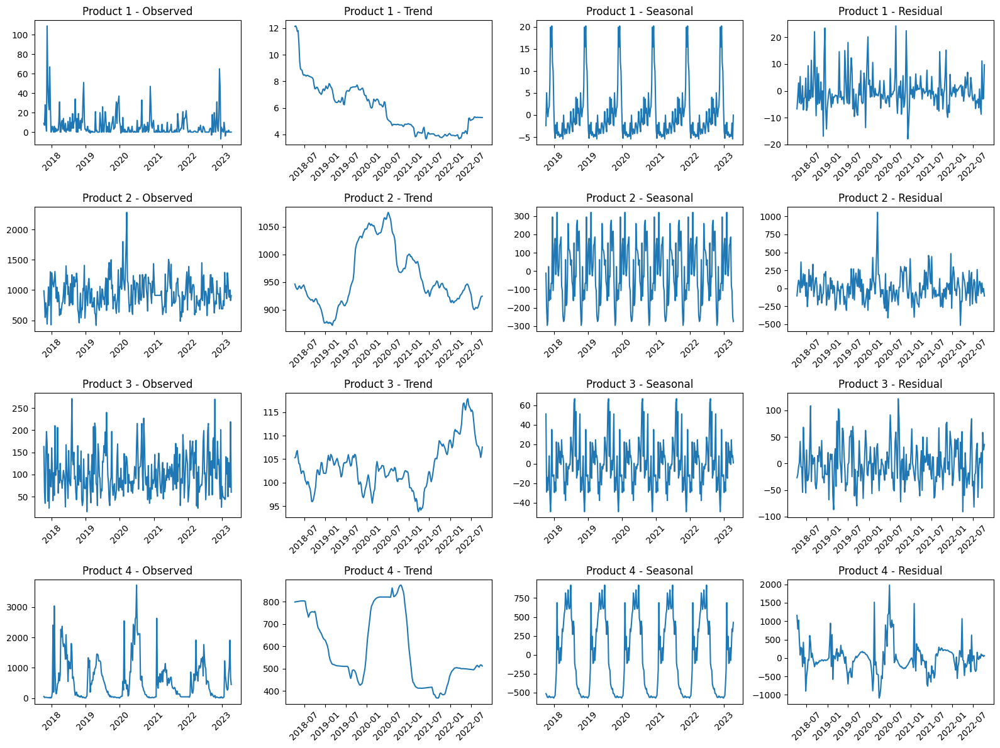

In [4]:
# Decompose time series into trend, seasonal and residual component
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

prod1 = pd.read_csv('../Testdaten/1.csv', parse_dates=['datum'], index_col=0).fillna(method='ffill')
prod2 = pd.read_csv('../Testdaten/2.csv', parse_dates=['datum'], index_col=0).fillna(method='ffill')
prod3 = pd.read_csv('../Testdaten/3.csv', parse_dates=['datum'], index_col=0).fillna(method='ffill')
prod4 = pd.read_csv('../Testdaten/4.csv', parse_dates=['datum'], index_col=0).fillna(method='ffill')

fig, axes = plt.subplots(4, 4, figsize=(16, 12))
components = ["observed", "trend", "seasonal", "resid"]
products = [prod1, prod2, prod3, prod4]

for i, product in enumerate(products):
    result = seasonal_decompose(product, model='additive')
    
    axes[i, 0].plot(result.observed)
    axes[i, 0].set_title(f'Product {i+1} - Observed')
    axes[i, 0].tick_params(axis='x', rotation=45)
    
    axes[i, 1].plot(result.trend)
    axes[i, 1].set_title(f'Product {i+1} - Trend')
    axes[i, 1].tick_params(axis='x', rotation=45)

    axes[i, 2].plot(result.seasonal)
    axes[i, 2].set_title(f'Product {i+1} - Seasonal')
    axes[i, 2].tick_params(axis='x', rotation=45)
    
    axes[i, 3].plot(result.resid)
    axes[i, 3].set_title(f'Product {i+1} - Residual')
    axes[i, 3].tick_params(axis='x', rotation=45)

plt.tight_layout()
plt.subplots_adjust(hspace=0.5)
plt.show()


In [4]:

def preprocess_for_stationarity(product, seasonality=0):
    # Applying logarithmic transformation
    product['log_demand'] = np.log(product['bedarf_stueck'])

    # First order differencing
    product['first_order_diff'] = product['log_demand']-product['log_demand'].shift(1)
    product['first_order_diff'] = product['first_order_diff'].dropna()
    
    # Seasonal differencing
    if seasonality>0:
        product['seasonal_diff'] = product['first_order_diff']-product['first_order_diff'].shift(seasonality)
        product['seasonal_diff'] = product['seasonal_diff'].dropna()

    return product.dropna()

# Applying the preprocessing to each product
product1_processed=product1
constant_to_add = abs(product1_processed['bedarf_stueck'].min()) + 1
product1_processed['log_demand'] = np.log(product1_processed['bedarf_stueck'] + constant_to_add)
product1_processed['first_order_diff'] = product1_processed["log_demand"] - product1_processed['log_demand'].shift(1)
product1_processed['first_order_diff'] = product1_processed['first_order_diff'].dropna()
#product1_processed['second_order_diff'] = product1_processed['first_order_diff'].diff()
product1_processed['seasonal_diff'] = product1_processed["first_order_diff"] - product1_processed['first_order_diff'].shift(52)#product1_processed['log_demand'].diff(52).dropna()
product1_processed['seasonal_diff'] = product1_processed['seasonal_diff'].dropna()
product1_processed = product1_processed.dropna()
#product1_processed['seasonal_diff'] = product1_processed['log_demand'].diff(52)

product2_processed = preprocess_for_stationarity(product2,52)
product3_processed = preprocess_for_stationarity(product3,52)
product4_processed = preprocess_for_stationarity(product4,52)


In [5]:
print(product1_processed.head())

        datum  bedarf_stueck  log_demand  first_order_diff  seasonal_diff
53 2018-10-15           19.0    3.295837          1.216395       1.341558
54 2018-10-22            4.0    2.484907         -0.810930      -1.686399
55 2018-10-29            4.0    2.484907          0.000000       0.693147
56 2018-11-05           12.0    2.995732          0.510826       1.203973
57 2018-11-12            2.0    2.302585         -0.693147      -3.258097


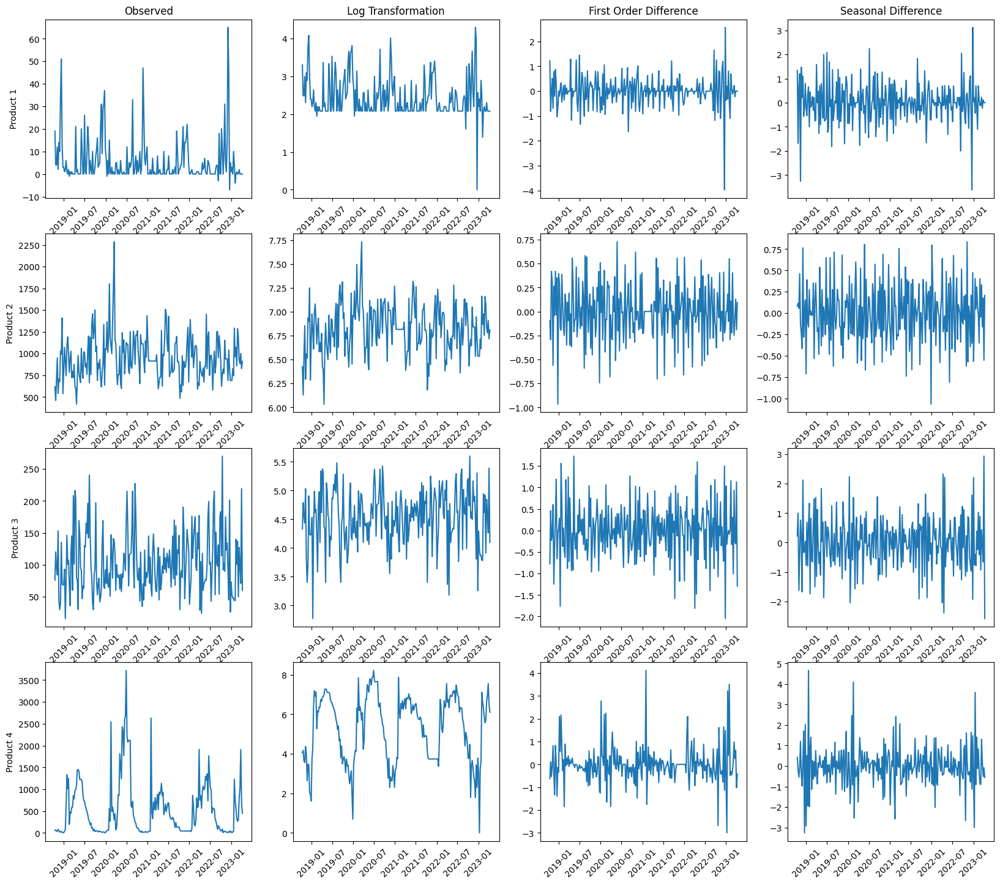

In [35]:
import matplotlib.pyplot as plt

def plot_transformation_steps(products, product_names):
    fig, axs = plt.subplots(4, 4, figsize=(20, 16))
    
    titles = ["Observed", "Log Transformation", "First Order Difference", "Seasonal Difference"]
    
    for i, product in enumerate(products):
        # Observed data
        axs[i, 0].plot(product['datum'], product['bedarf_stueck'])
        axs[i, 0].set_ylabel(product_names[i])
        axs[i, 0].tick_params(axis='x', rotation=45)
        if i == 0:
            axs[i, 0].set_title(titles[0])

        # Log transformation
        axs[i, 1].plot(product['datum'], product['log_demand'])
        if i == 0:
            axs[i, 1].set_title(titles[1])
        axs[i, 1].tick_params(axis='x', rotation=45)

        # First order difference
        axs[i, 2].plot(product['datum'], product['first_order_diff'])
        if i == 0:
            axs[i, 2].set_title(titles[2])
        axs[i, 2].tick_params(axis='x', rotation=45)
        
        # Seasonal difference
        axs[i, 3].plot(product['datum'], product['seasonal_diff'])
        if i == 0:
            axs[i, 3].set_title(titles[3])
        axs[i, 3].tick_params(axis='x', rotation=45)
  
    plt.subplots_adjust(top=0.95)
    plt.show()

products = [product1_processed, product2_processed, product3_processed, product4_processed]
product_names = ["Product 1", "Product 2", "Product 3", "Product 4"]

plot_transformation_steps(products, product_names)

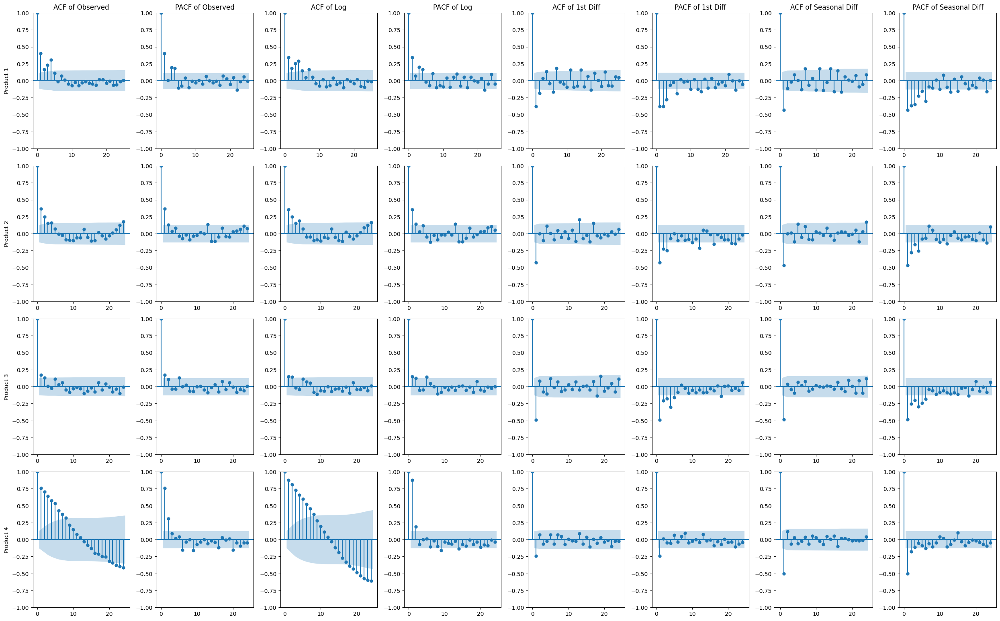

In [24]:
def visualize_acf_pacf(products, product_names):
    fig, axs = plt.subplots(4, 8, figsize=(25, 16))
    
    titles = ["ACF of Observed", "PACF of Observed", "ACF of Log", "PACF of Log", "ACF of 1st Diff", "PACF of 1st Diff", "ACF of Seasonal Diff", "PACF of Seasonal Diff"]
    
    for i, product in enumerate(products):
        
        plot_acf(product['bedarf_stueck'], ax=axs[i, 0], title='' if i else titles[0])
        plot_pacf(product['bedarf_stueck'], ax=axs[i, 1], title='' if i else titles[1])
        
        axs[i, 0].set_ylabel(product_names[i])
        
        plot_acf(product['log_demand'], ax=axs[i, 2], title='' if i else titles[2])
        plot_pacf(product['log_demand'], ax=axs[i, 3], title='' if i else titles[3])
        
        plot_acf(product['first_order_diff'].dropna(), ax=axs[i, 4], title='' if i else titles[4])
        plot_pacf(product['first_order_diff'].dropna(), ax=axs[i, 5], title='' if i else titles[5])
        
        plot_acf(product['seasonal_diff'].dropna(), ax=axs[i, 6], title='' if i else titles[6])
        plot_pacf(product['seasonal_diff'].dropna(), ax=axs[i, 7], title='' if i else titles[7])
            
    plt.tight_layout()
    plt.subplots_adjust(top=0.95)
    plt.show()


products = [product1_processed, product2_processed, product3_processed, product4_processed]
product_names = ["Product 1", "Product 2", "Product 3", "Product 4"]

visualize_acf_pacf(products, product_names)


In [37]:
def augmented_dickey_fuller_test(ts, name):
    """
    Augmented Dickey Fuller Test
    H0: time series has unit root -> is non-stationary
    H1: time series has not unit root -> is stationary
    """
    print(f"Results of Augmented Dickey-Fuller Test for {name}:")
    dftest = adfuller(ts, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', '#Lags Used', 'Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput[f'Critical Value ({key})'] = value
    print(dfoutput, '\n')

def kpss_test(timeseries, product_name):
    """
    KPSS test
    H0: time series time series is stationary
    H1: time series is non-stationary
    """
    print(f'Results of KPSS Test for {product_name}:\n')
    
    kpsstest = kpss(timeseries, regression='c', nlags="auto")
    kpss_output = pd.Series(kpsstest[0:3], index=['Test Statistic','p-value','Lags Used'])
    
    for key, value in kpsstest[3].items():
        kpss_output[f'Critical Value ({key})'] = value
        
    print(kpss_output)

product_data = [
    (product1_processed, "Product 1"),
    (product2_processed, "Product 2"),
    (product3_processed, "Product 3"),
    (product4_processed, "Product 4")
]

for data, name in product_data:
    
    # ADF test
    augmented_dickey_fuller_test(data['seasonal_diff'], name)

    # KPSS test
    kpss_test(data['seasonal_diff'], name)

Results of Augmented Dickey-Fuller Test for Product 1:
Test Statistic                -6.858269e+00
p-value                        1.627203e-09
#Lags Used                     1.400000e+01
Number of Observations Used    2.200000e+02
Critical Value (1%)           -3.460428e+00
Critical Value (5%)           -2.874769e+00
Critical Value (10%)          -2.573821e+00
dtype: float64 

Results of KPSS Test for Product 1:

Test Statistic            0.085257
p-value                   0.100000
Lags Used                35.000000
Critical Value (10%)      0.347000
Critical Value (5%)       0.463000
Critical Value (2.5%)     0.574000
Critical Value (1%)       0.739000
dtype: float64
Results of Augmented Dickey-Fuller Test for Product 2:
Test Statistic                -6.566528e+00
p-value                        8.132874e-09
#Lags Used                     1.100000e+01
Number of Observations Used    2.230000e+02
Critical Value (1%)           -3.460019e+00
Critical Value (5%)           -2.874590e+00
Crit

/var/folders/8x/0zjt5hnd3s74dcghvfgvz5d40000gn/T/ipykernel_18673/2406945134.py:22: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(timeseries, regression='c', nlags="auto")
/var/folders/8x/0zjt5hnd3s74dcghvfgvz5d40000gn/T/ipykernel_18673/2406945134.py:22: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(timeseries, regression='c', nlags="auto")
/var/folders/8x/0zjt5hnd3s74dcghvfgvz5d40000gn/T/ipykernel_18673/2406945134.py:22: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(timeseries, regression='c', nlags="auto")
/var/folders/8x/0zjt5hnd3s74dcghvfgvz5d40000gn/T/ipykernel_18673/24069

In [8]:
from sklearn.model_selection import TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=50,test_size=1,max_train_size=100)
for i, (train_index, test_index) in enumerate(tscv.split(product1_processed)):
    print(f"Fold {i}:")

    print(f"  Train: index={train_index}")
    print(f"  Test:  index={test_index}")

Fold 0:
  Train: index=[ 85  86  87  88  89  90  91  92  93  94  95  96  97  98  99 100 101 102
 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120
 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138
 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156
 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174
 175 176 177 178 179 180 181 182 183 184]
  Test:  index=[185]
Fold 1:
  Train: index=[ 86  87  88  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103
 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121
 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139
 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157
 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175
 176 177 178 179 180 181 182 183 184 185]
  Test:  index=[186]
Fold 2:
  Train: index=[ 87  88  89  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104
 1

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


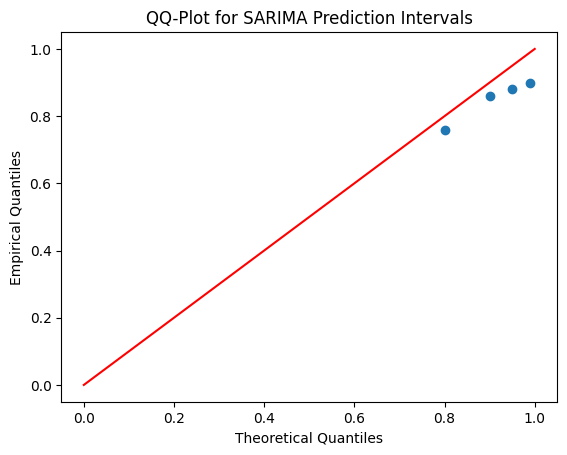

In [24]:
alpha_levels = [0.01, 0.05, 0.10, 0.20]
empirical_quantiles = {}
p, d, q = 0, 0, 1  # Non-seasonal order
P, D, Q, s = 0, 0, 1, 52  # Seasonal order with seasonality of 52


data = product1_processed['seasonal_diff'].values

for train_index, test_index in tscv.split(data):

    train, test = data[train_index], data[test_index]
    
    model = SARIMAX(train, order=(p, d, q), seasonal_order=(P, D, Q, s))
    result = model.fit(disp=False)
    forecast = result.get_forecast(steps=1)
    
    for alpha in alpha_levels:
        
        # Direct interval construction with SARIMAs built in function
        conf_int = forecast.conf_int(alpha=alpha)
        lower_bound = conf_int[0, 0]
        upper_bound = conf_int[0, 1]
        
        is_within_interval = lower_bound <= test[0] <= upper_bound
        
        if alpha not in empirical_quantiles:
            empirical_quantiles[alpha] = []
        empirical_quantiles[alpha].append(is_within_interval)

empirical_quantiles = {alpha: np.mean(values) for alpha, values in empirical_quantiles.items()}

theoretical_quantiles = [1-a for a in alpha_levels]
empirical_values = [empirical_quantiles[a] for a in alpha_levels]

plt.plot(theoretical_quantiles, empirical_values, 'o')
plt.plot([0, 1], [0, 1], 'r-')  
plt.xlabel('Theoretical Quantiles')
plt.ylabel('Empirical Quantiles')
plt.title('QQ-Plot for SARIMA Prediction Intervals')
plt.show()


## SARIMA model

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


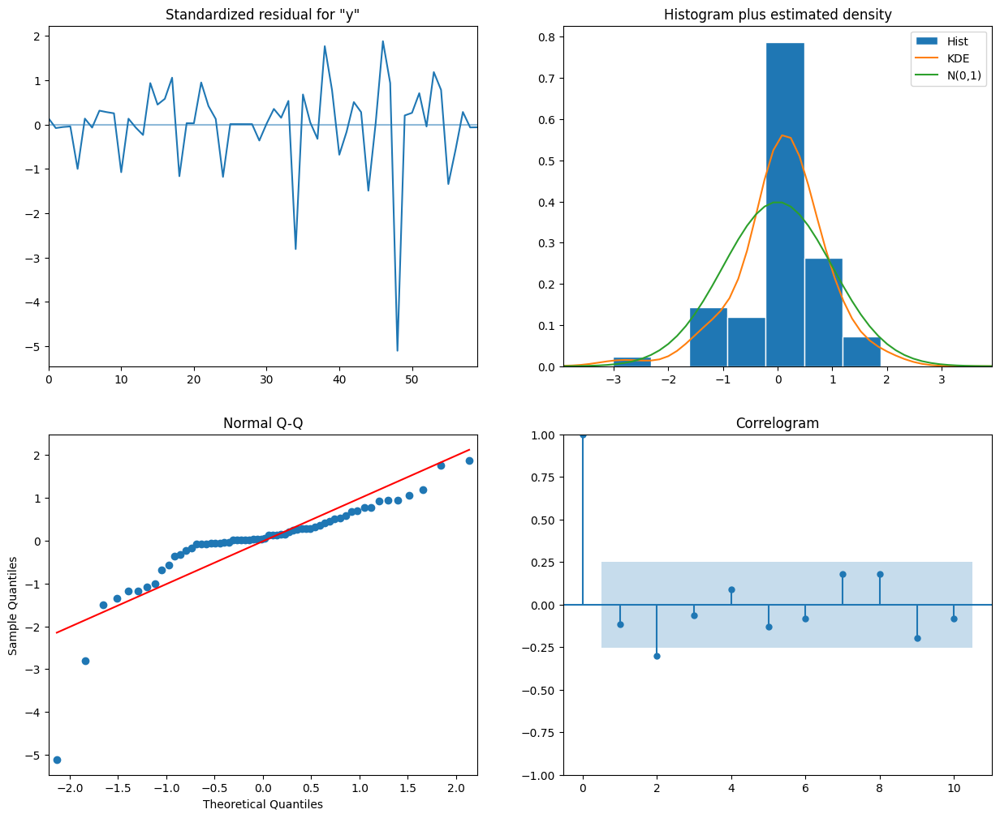

Alpha: 0.01, PICP: 100.00%, MPIW: 2.8141,  NMPIW: 0.4176
Alpha: 0.05, PICP: 97.50%, MPIW: 2.1413,  NMPIW: 0.3178
Alpha: 0.1, PICP: 92.50%, MPIW: 1.7970,  NMPIW: 0.2667
Alpha: 0.2, PICP: 90.00%, MPIW: 1.4001,  NMPIW: 0.2078
Alpha: 0.3, PICP: 67.50%, MPIW: 1.1323,  NMPIW: 0.1680


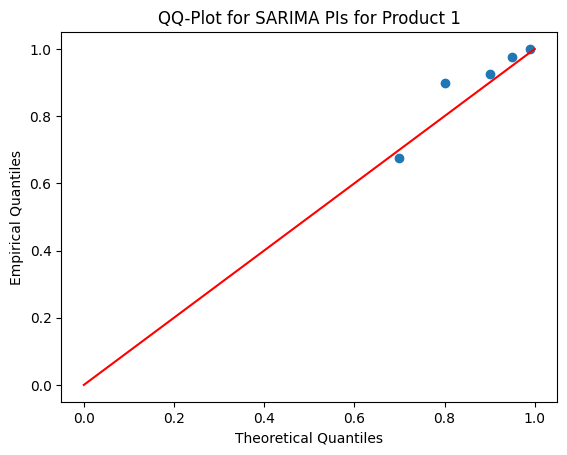

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likeli

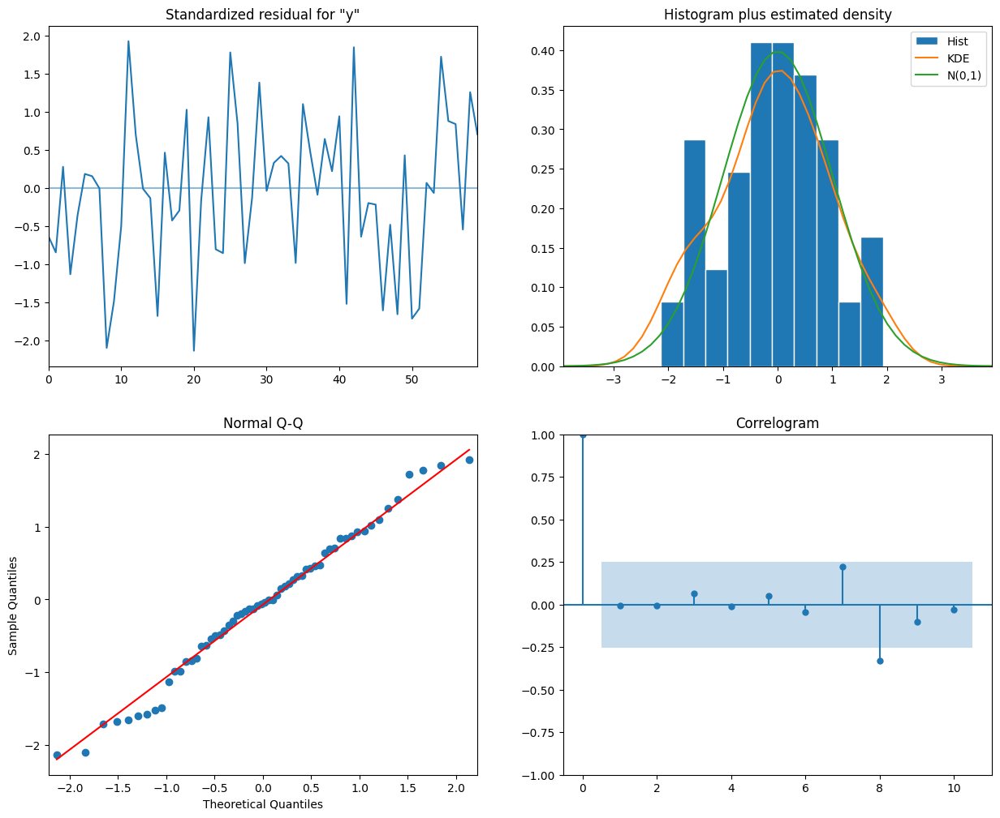

Alpha: 0.01, PICP: 100.00%, MPIW: 1.3503,  NMPIW: 0.7097
Alpha: 0.05, PICP: 97.50%, MPIW: 1.0274,  NMPIW: 0.5400
Alpha: 0.1, PICP: 87.50%, MPIW: 0.8623,  NMPIW: 0.4532
Alpha: 0.2, PICP: 67.50%, MPIW: 0.6718,  NMPIW: 0.3531
Alpha: 0.3, PICP: 62.50%, MPIW: 0.5433,  NMPIW: 0.2856


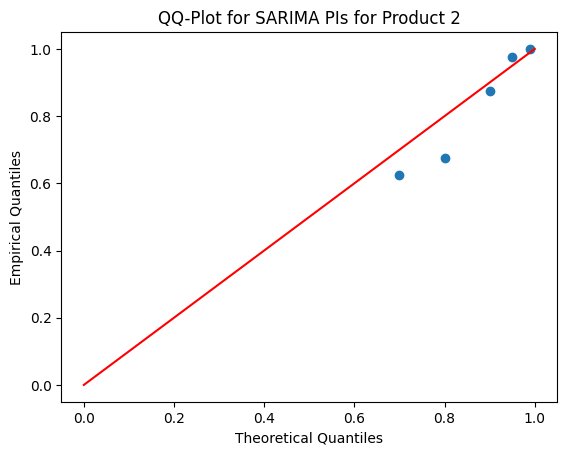

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likeli

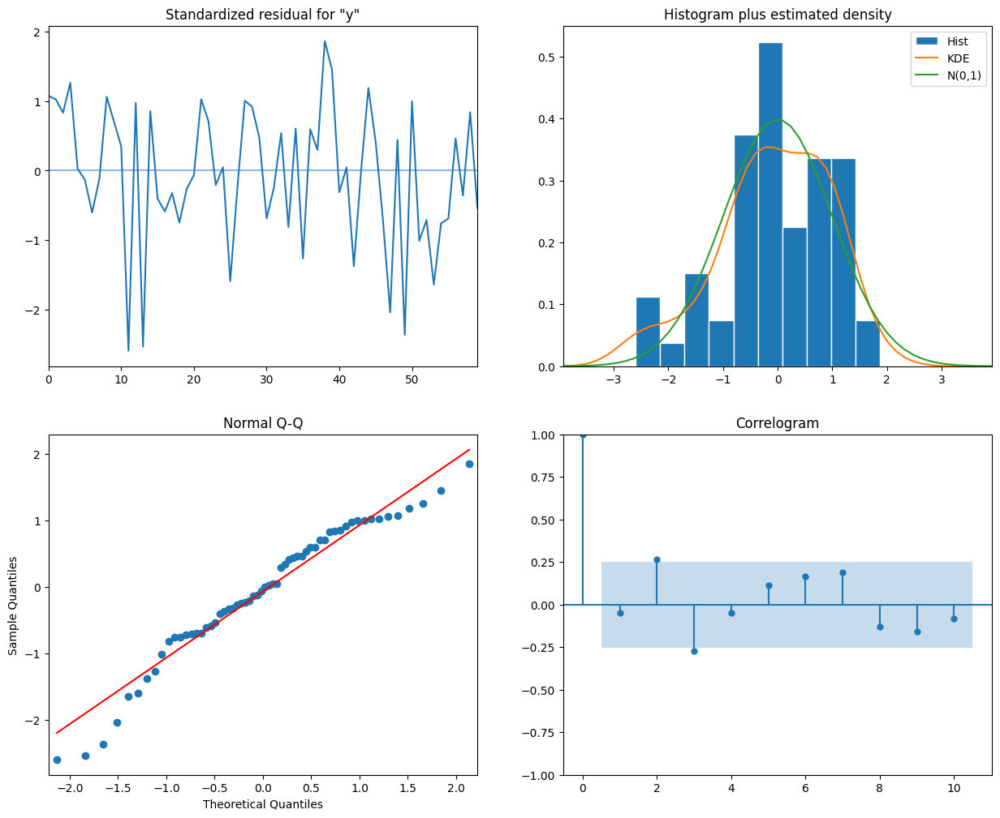

Alpha: 0.01, PICP: 92.50%, MPIW: 3.0245,  NMPIW: 0.5482
Alpha: 0.05, PICP: 90.00%, MPIW: 2.3013,  NMPIW: 0.4172
Alpha: 0.1, PICP: 82.50%, MPIW: 1.9313,  NMPIW: 0.3501
Alpha: 0.2, PICP: 80.00%, MPIW: 1.5048,  NMPIW: 0.2728
Alpha: 0.3, PICP: 75.00%, MPIW: 1.2170,  NMPIW: 0.2206


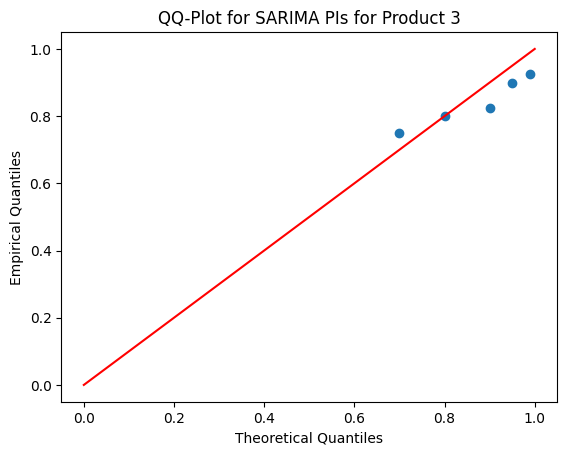

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


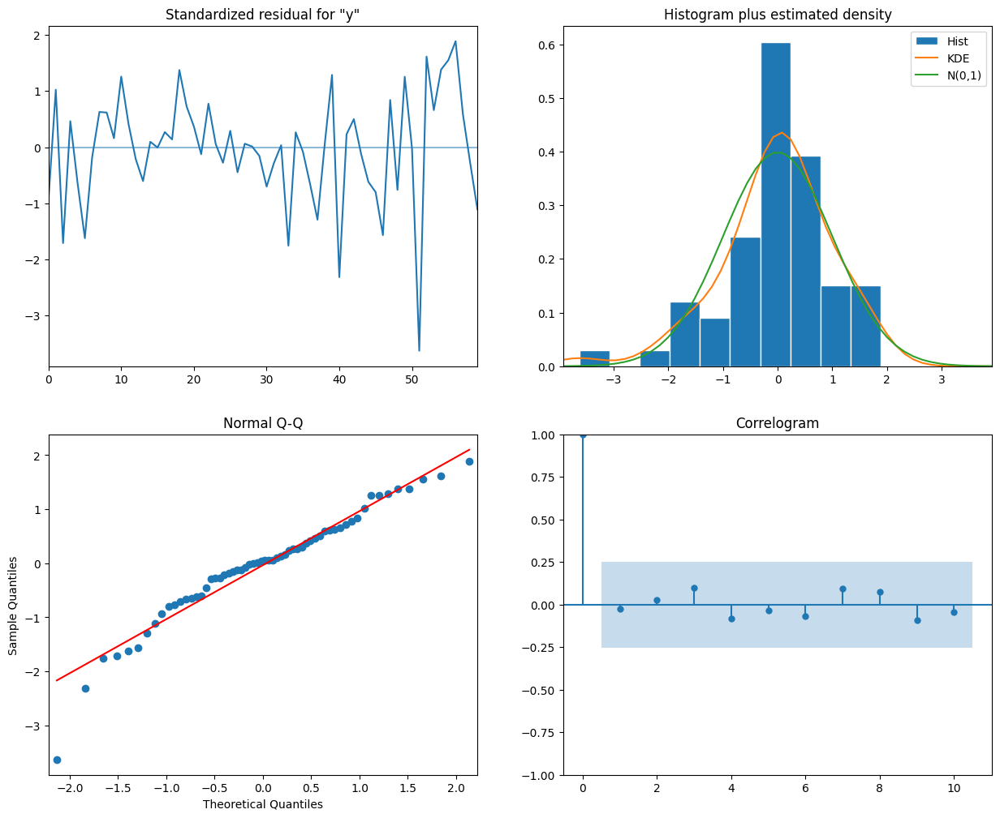

Alpha: 0.01, PICP: 95.00%, MPIW: 3.9012,  NMPIW: 0.4925
Alpha: 0.05, PICP: 92.50%, MPIW: 2.9684,  NMPIW: 0.3748
Alpha: 0.1, PICP: 90.00%, MPIW: 2.4912,  NMPIW: 0.3145
Alpha: 0.2, PICP: 80.00%, MPIW: 1.9410,  NMPIW: 0.2450
Alpha: 0.3, PICP: 75.00%, MPIW: 1.5697,  NMPIW: 0.1982


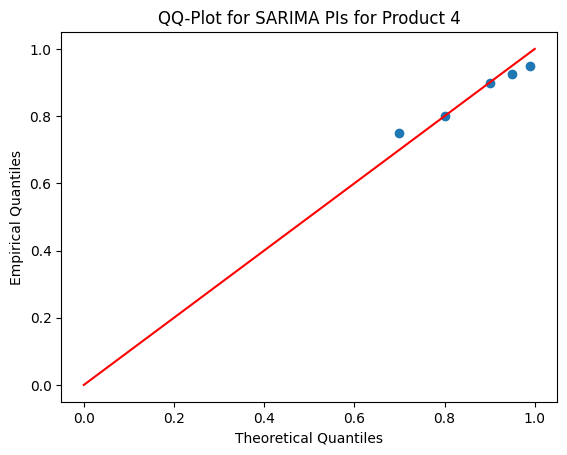

In [11]:
def compute_and_plot_QQ(data, tscv, product_name, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30], p=0, d=0, q=1, P=0, D=0, Q=1, s=52):
    empirical_quantiles = {}
    normalization_factor = np.max(data) - np.min(data)
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}
    NMPIW_dict = {alpha: [] for alpha in alpha_levels}

    for train_index, test_index in tscv.split(data):
        train, test = data[train_index], data[test_index]

        model = SARIMAX(train, order=(p, d, q), seasonal_order=(P, D, Q, s))
        result = model.fit(disp=False)
        
        forecast = result.get_forecast(steps=1)

        for alpha in alpha_levels:

            conf_int = forecast.conf_int(alpha=alpha)
            lower_bound = conf_int[0, 0]
            upper_bound = conf_int[0, 1]

            is_within_interval = lower_bound <= test[0] <= upper_bound

            PICP_dict[alpha].append(is_within_interval)
            MPIW_dict[alpha].append(upper_bound - lower_bound)
            NMPIW_dict[alpha].append((upper_bound - lower_bound)/normalization_factor)

            if alpha not in empirical_quantiles:
                empirical_quantiles[alpha] = []
            empirical_quantiles[alpha].append(is_within_interval)
      
    result.plot_diagnostics(figsize=(15, 12))
    plt.show()  
    
    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}
    NMPIW_values = {alpha: np.mean(values) for alpha, values in NMPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f},  NMPIW: {NMPIW_values[alpha]:.4f}")
  

    empirical_quantiles = {alpha: np.mean(values) for alpha, values in empirical_quantiles.items()}

    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [empirical_quantiles[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for SARIMA PIs for {product_name}')
    plt.show()

import pandas as pd
import numpy as np
from sklearn.model_selection import TimeSeriesSplit
from statsmodels.tsa.statespace.sarimax import SARIMAX
products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]
alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]
tscv = TimeSeriesSplit(n_splits=40,test_size=5,max_train_size=60)
for data, product_name in products_data:
    compute_and_plot_QQ(data, tscv, product_name, alpha_levels=alpha_levels)


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Alpha: 0.01, PICP: 90.00%, MPIW: 2.4736,  NMPIW: 0.3671
Alpha: 0.05, PICP: 88.00%, MPIW: 1.8822,  NMPIW: 0.2793
Alpha: 0.1, PICP: 86.00%, MPIW: 1.5796,  NMPIW: 0.2344
Alpha: 0.2, PICP: 76.00%, MPIW: 1.2307,  NMPIW: 0.1826
Alpha: 0.3, PICP: 68.00%, MPIW: 0.9953,  NMPIW: 0.1477


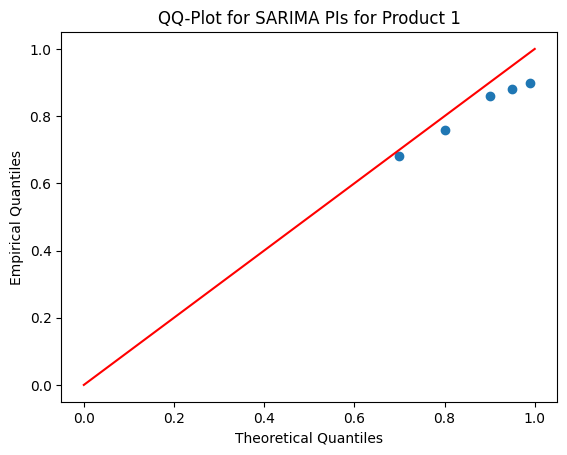

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Alpha: 0.01, PICP: 100.00%, MPIW: 1.4234,  NMPIW: 0.7482
Alpha: 0.05, PICP: 100.00%, MPIW: 1.0831,  NMPIW: 0.5693
Alpha: 0.1, PICP: 96.00%, MPIW: 0.9089,  NMPIW: 0.4778
Alpha: 0.2, PICP: 82.00%, MPIW: 0.7082,  NMPIW: 0.3722
Alpha: 0.3, PICP: 70.00%, MPIW: 0.5727,  NMPIW: 0.3010


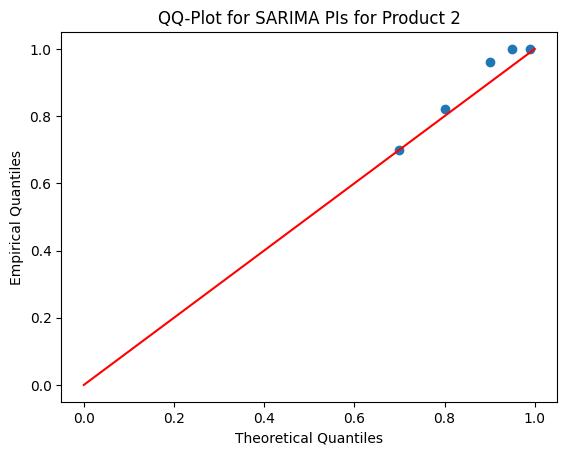

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Alpha: 0.01, PICP: 98.00%, MPIW: 2.8783,  NMPIW: 0.5217
Alpha: 0.05, PICP: 94.00%, MPIW: 2.1901,  NMPIW: 0.3970
Alpha: 0.1, PICP: 84.00%, MPIW: 1.8380,  NMPIW: 0.3332
Alpha: 0.2, PICP: 80.00%, MPIW: 1.4320,  NMPIW: 0.2596
Alpha: 0.3, PICP: 68.00%, MPIW: 1.1581,  NMPIW: 0.2099


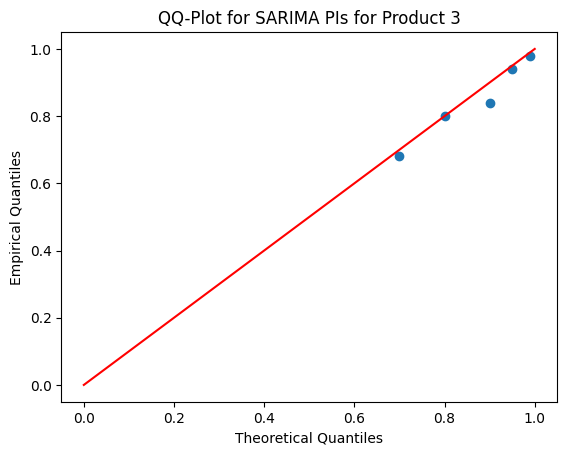

Alpha: 0.01, PICP: 96.00%, MPIW: 3.7665,  NMPIW: 0.4755
Alpha: 0.05, PICP: 94.00%, MPIW: 2.8659,  NMPIW: 0.3618
Alpha: 0.1, PICP: 86.00%, MPIW: 2.4052,  NMPIW: 0.3037
Alpha: 0.2, PICP: 78.00%, MPIW: 1.8739,  NMPIW: 0.2366
Alpha: 0.3, PICP: 70.00%, MPIW: 1.5155,  NMPIW: 0.1913


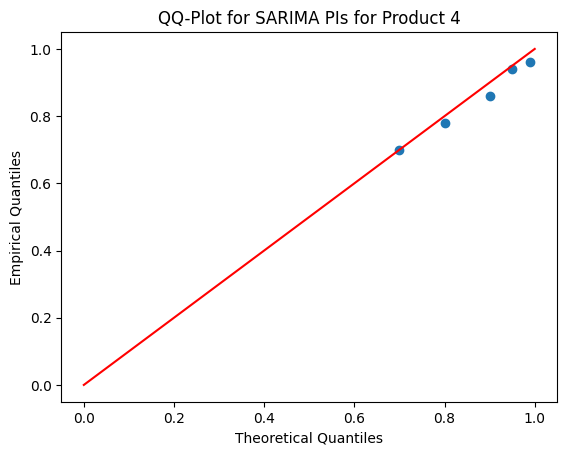

In [12]:
# one step forecast
def compute_and_plot_QQ(data, tscv, product_name, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30], p=0, d=0, q=1, P=0, D=0, Q=1, s=52):
    empirical_quantiles = {}
    normalization_factor = np.max(data) - np.min(data)
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}
    NMPIW_dict = {alpha: [] for alpha in alpha_levels}

    for train_index, test_index in tscv.split(data):
        train, test = data[train_index], data[test_index]

        model = SARIMAX(train, order=(p, d, q), seasonal_order=(P, D, Q, s))
        result = model.fit(disp=False)
        
        forecast = result.get_forecast(steps=1)

        for alpha in alpha_levels:

            conf_int = forecast.conf_int(alpha=alpha)
            lower_bound = conf_int[0, 0]
            upper_bound = conf_int[0, 1]

            is_within_interval = lower_bound <= test[0] <= upper_bound

            PICP_dict[alpha].append(is_within_interval)
            MPIW_dict[alpha].append(upper_bound - lower_bound)
            NMPIW_dict[alpha].append((upper_bound - lower_bound)/normalization_factor)

            if alpha not in empirical_quantiles:
                empirical_quantiles[alpha] = []
            empirical_quantiles[alpha].append(is_within_interval)

    # Evaluation of fitted SARIMA model - Residual observation        
    #result.plot_diagnostics(figsize=(15, 12))
    #plt.show()  
    
    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}
    NMPIW_values = {alpha: np.mean(values) for alpha, values in NMPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f},  NMPIW: {NMPIW_values[alpha]:.4f}")
  

    empirical_quantiles = {alpha: np.mean(values) for alpha, values in empirical_quantiles.items()}

    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [empirical_quantiles[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for SARIMA PIs for {product_name}')
    plt.show()
    
products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]
alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]
tscv = TimeSeriesSplit(n_splits=50,test_size=1,max_train_size=100)
for data, product_name in products_data:
    compute_and_plot_QQ(data, tscv, product_name, alpha_levels=alpha_levels)


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


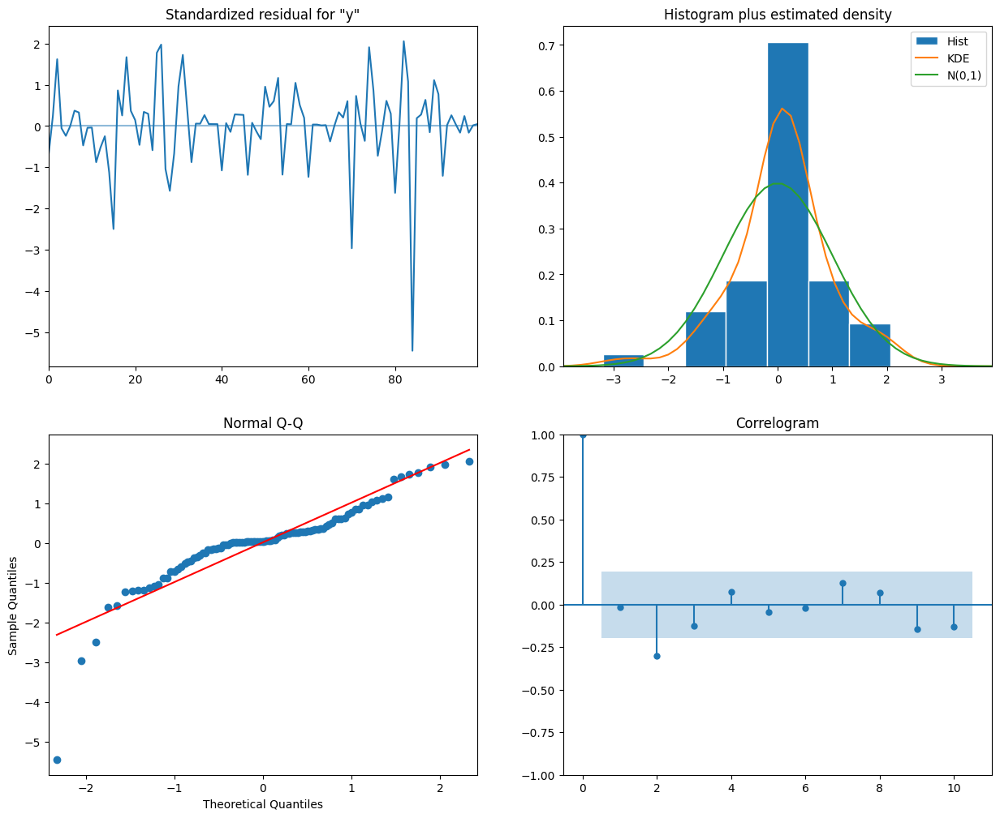

Alpha: 0.01, PICP: 90.00%, MPIW: 2.3523
Alpha: 0.05, PICP: 90.00%, MPIW: 2.0086
Alpha: 0.1, PICP: 86.00%, MPIW: 1.6497
Alpha: 0.2, PICP: 74.00%, MPIW: 1.1858
Alpha: 0.3, PICP: 66.00%, MPIW: 0.9017


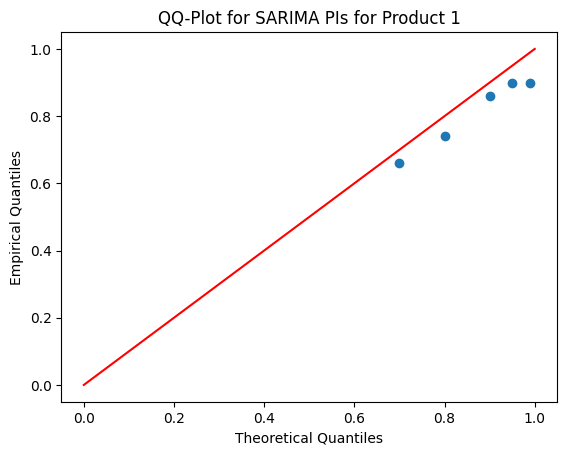

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


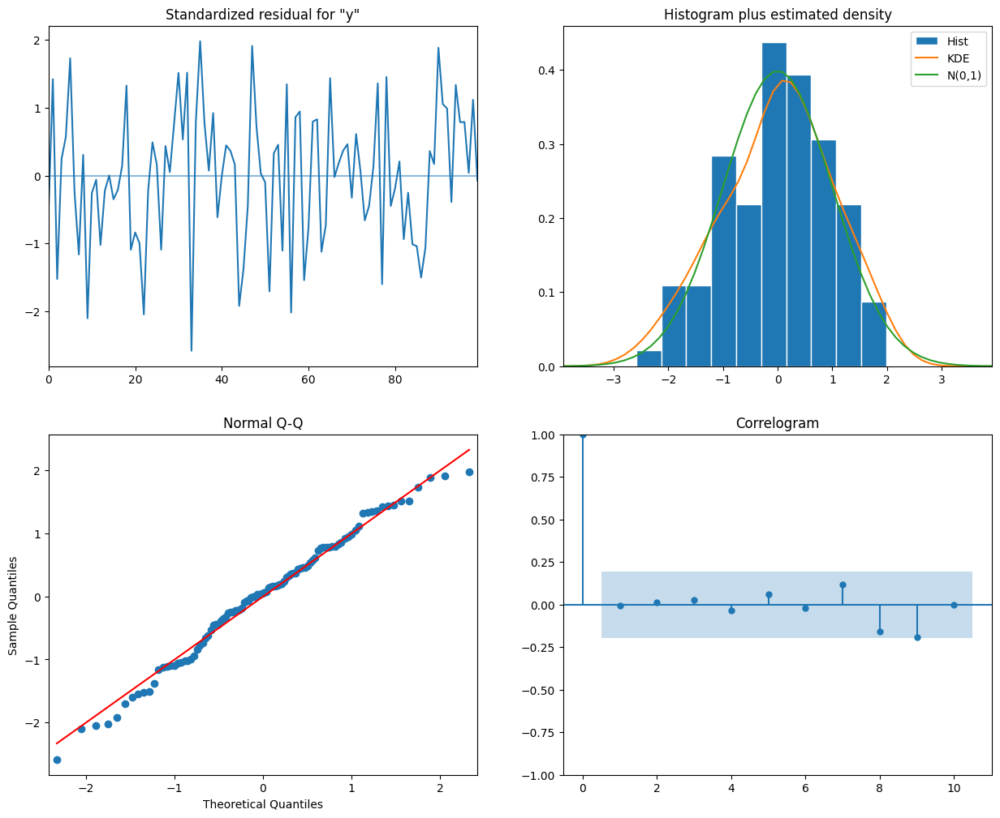

Alpha: 0.01, PICP: 96.00%, MPIW: 1.1552
Alpha: 0.05, PICP: 94.00%, MPIW: 1.0360
Alpha: 0.1, PICP: 94.00%, MPIW: 0.9066
Alpha: 0.2, PICP: 82.00%, MPIW: 0.7205
Alpha: 0.3, PICP: 64.00%, MPIW: 0.5838


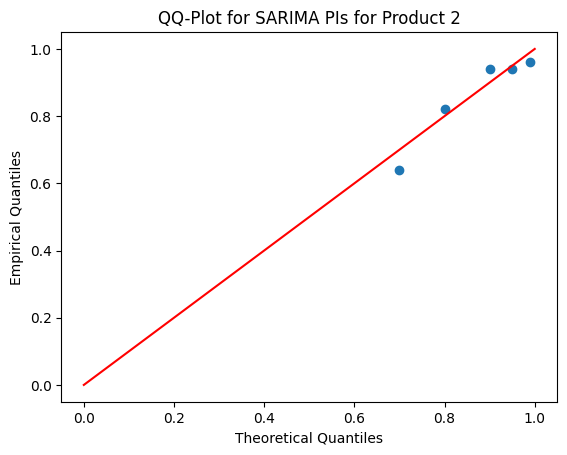

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


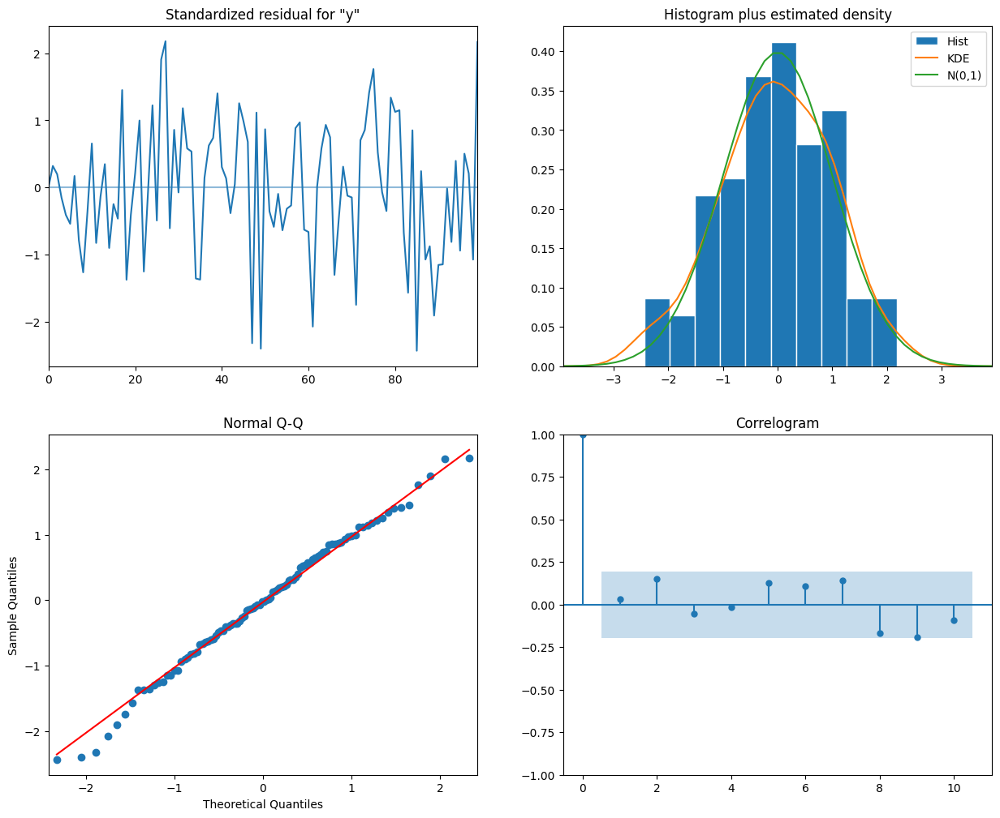

Alpha: 0.01, PICP: 96.00%, MPIW: 2.6292
Alpha: 0.05, PICP: 92.00%, MPIW: 2.1860
Alpha: 0.1, PICP: 86.00%, MPIW: 1.8156
Alpha: 0.2, PICP: 74.00%, MPIW: 1.3796
Alpha: 0.3, PICP: 52.00%, MPIW: 1.1054


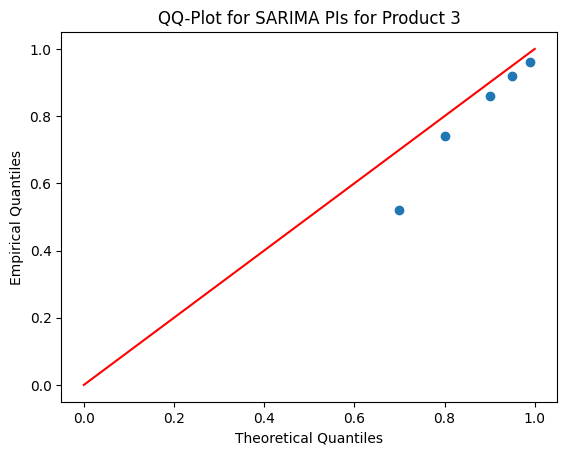

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/statsmodels/tsa/statespace/sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


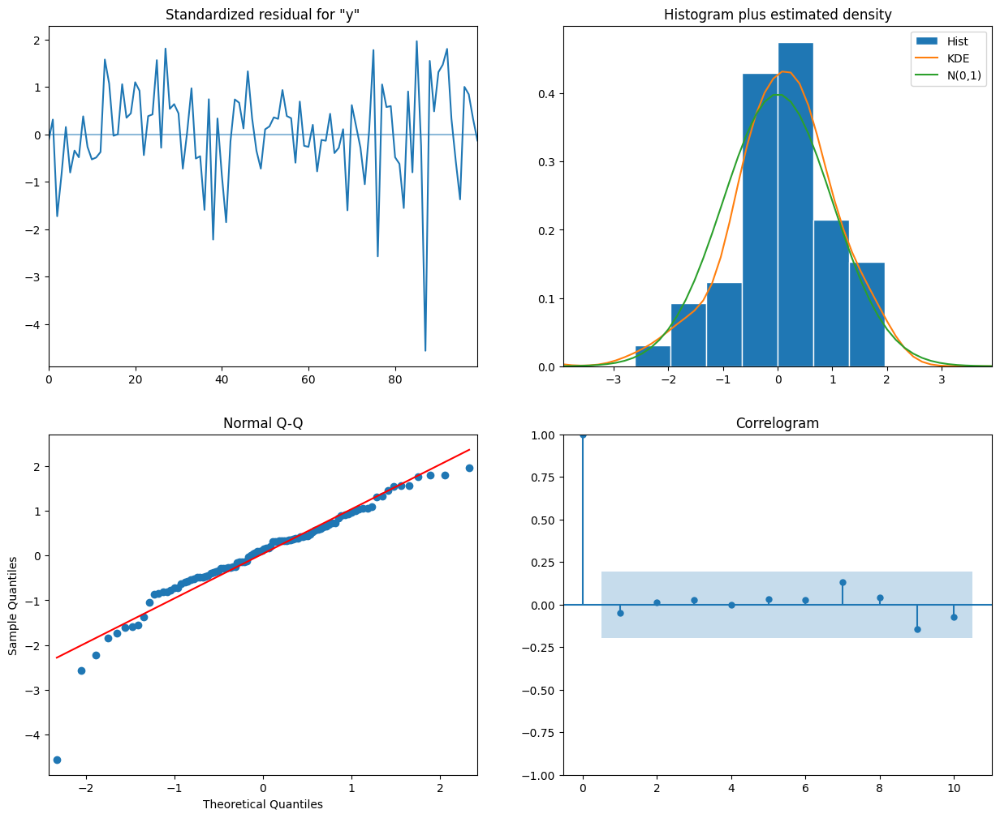

Alpha: 0.01, PICP: 94.00%, MPIW: 3.4539
Alpha: 0.05, PICP: 90.00%, MPIW: 2.7092
Alpha: 0.1, PICP: 84.00%, MPIW: 2.2682
Alpha: 0.2, PICP: 70.00%, MPIW: 1.6702
Alpha: 0.3, PICP: 66.00%, MPIW: 1.2866


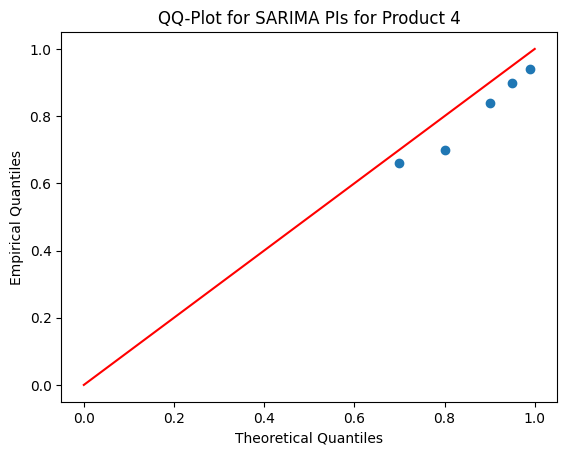

In [69]:
# just a try - not included in further experiments
# SARIMA point prediction and PI construction with residual Bootstrap method
def compute_and_plot_bootstrap_PI(data, tscv, B=200, product_name="Prod1", alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30], p=0, d=0, q=1, P=0, D=0, Q=1, s=52):  # other params
    empirical_quantiles = {}
    normalization_factor = np.max(data) - np.min(data)
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}
    NMPIW_dict = {alpha: [] for alpha in alpha_levels}

    for train_index, test_index in tscv.split(data):
        train, test = data[train_index], data[test_index]

        model = SARIMAX(train, order=(p, d, q), seasonal_order=(P, D, Q, s))
        result = model.fit(disp=False)
        
        forecast = result.forecast(steps=1)[0]

        residuals = train - result.fittedvalues
        bootstrapped_forecasts = np.array([forecast + np.random.choice(residuals, len(test), replace=True) for _ in range(B)])

        for alpha in alpha_levels:
            lower_bound = np.percentile(bootstrapped_forecasts, (alpha/2)*100, axis=0)
            upper_bound = np.percentile(bootstrapped_forecasts, (1-alpha/2)*100, axis=0)

            is_within_interval = lower_bound <= test[0] <= upper_bound

            PICP_dict[alpha].append(is_within_interval)
            MPIW_dict[alpha].append(upper_bound - lower_bound)
            NMPIW_dict[alpha].append((upper_bound - lower_bound)/normalization_factor)


            if alpha not in empirical_quantiles:
                empirical_quantiles[alpha] = []
            empirical_quantiles[alpha].append(is_within_interval)
        
            
    result.plot_diagnostics(figsize=(15, 12))
    plt.show()  
    
    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}
    NMPIW_values = {alpha: np.mean(values) for alpha, values in NMPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f},  NMPIW: {NMPIW_values[alpha]:.4f}")

    empirical_quantiles = {alpha: np.mean(values) for alpha, values in empirical_quantiles.items()}

    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [empirical_quantiles[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for SARIMA PIs for {product_name}')
    plt.show()

products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]

for data, product_name in products_data:
    compute_and_plot_bootstrap_PI(data, tscv, 50, product_name)


Blocked Cross Validation

In [5]:
from sklearn.model_selection import TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=50,test_size=5,max_train_size=20)
for i, (train_index, test_index) in enumerate(tscv.split(product1)):
    print(f"Fold {i}:")

    print(f"  Train: index={train_index}")
    print(f"  Test:  index={test_index}")

Fold 0:
  Train: index=[18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37]
  Test:  index=[38 39 40 41 42]
Fold 1:
  Train: index=[23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42]
  Test:  index=[43 44 45 46 47]
Fold 2:
  Train: index=[28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47]
  Test:  index=[48 49 50 51 52]
Fold 3:
  Train: index=[33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52]
  Test:  index=[53 54 55 56 57]
Fold 4:
  Train: index=[38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57]
  Test:  index=[58 59 60 61 62]
Fold 5:
  Train: index=[43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62]
  Test:  index=[63 64 65 66 67]
Fold 6:
  Train: index=[48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67]
  Test:  index=[68 69 70 71 72]
Fold 7:
  Train: index=[53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72]
  Test:  index=[73 74 75 76 77]
Fold 8:
  Train: index=[58 59 60 61 62 63 64 65 66 67 68 69 70 7

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
import keras
from keras import backend as K
import tensorflow as tf
from keras.callbacks import EarlyStopping

# hyperparameters
lambda_ = 0.01 # lambda in loss fn
alpha_ = 0.05  # capturing (1-alpha)% of samples
soften_ = 160.
n_ = 100 # batch size

# define loss fn
def qd_objective(y_true, y_pred):
    '''Loss_QD-soft, from algorithm 1'''
    y_true = y_true[:,0]
    y_u = y_pred[:,0]
    y_l = y_pred[:,1]
    
    K_HU = tf.maximum(0.,tf.sign(y_u - y_true))
    K_HL = tf.maximum(0.,tf.sign(y_true - y_l))
    K_H = tf.multiply(K_HU, K_HL)
    
    K_SU = tf.sigmoid(tf.clip_by_value(soften_ * (y_u - y_true), -10, 10))
    K_SL = tf.sigmoid(tf.clip_by_value(soften_ * (y_true - y_l), -10, 10))

    #K_SU = tf.sigmoid(soften_ * (y_u - y_true))
    #K_SL = tf.sigmoid(soften_ * (y_true - y_l))
    K_S = tf.multiply(K_SU, K_SL)
    epsilon = 1e-7
    MPIW_c = tf.reduce_sum(tf.multiply((y_u - y_l), K_H)) / (tf.reduce_sum(K_H) )

    #MPIW_c = tf.reduce_sum(tf.multiply((y_u - y_l),K_H))/tf.reduce_sum(K_H)
    PICP_H = tf.reduce_mean(K_H)
    PICP_S = tf.reduce_mean(K_S)
    
    Loss_S = MPIW_c + lambda_ * n_ / (alpha_*(1-alpha_)) * tf.maximum(0.,(1-alpha_) - PICP_S)
    
    return Loss_S

model = Sequential()
model.add(Dense(100, input_dim=1, activation='relu',
                kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.2)))
model.add(Dense(2, activation='linear',
                kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.3), 
                bias_initializer=keras.initializers.Constant(value=[1.,-1.]))) # important to init biases to start!

early_stopping = EarlyStopping(monitor='loss', 
                               patience=30,     
                               verbose=1,      
                               restore_best_weights=True)

lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-2,
    decay_steps=10000,
    decay_rate=0.9)
opt = keras.optimizers.legacy.Adam(learning_rate=lr_schedule)
#opt = keras.optimizers.legacy.Adam(lr=0.02, decay=0.01)
model.compile(loss=qd_objective, optimizer=opt)

In [ ]:
def build_model():
    model = Sequential()
    model.add(Dense(100, input_dim=1, activation='relu',
                    kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.2)))
    model.add(Dense(2, activation='linear',
                    kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.3), 
                    bias_initializer=keras.initializers.Constant(value=[1.,-1.]))) # important to init biases to start!

    early_stopping = EarlyStopping(monitor='loss', 
                                   patience=30,     
                                   verbose=1,      
                                   restore_best_weights=True)

    lr_schedule = keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=1e-2,
        decay_steps=10000,
        decay_rate=0.9)
    opt = keras.optimizers.legacy.Adam(learning_rate=lr_schedule)
    
    model.compile(loss=qd_objective, optimizer=opt)
    
    return model

## Actual High Quality Prediction Interval Construction based on Pearce 2018

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
import keras
from keras import backend as K
import tensorflow as tf
from keras.callbacks import EarlyStopping
def get_nn_model(alpha_):
    ''' 
    Build model for each fold with significance level as input 
    '''
    
    lambda_ = 0.01 # lambda in loss fn
    #alpha_ = 0.05  # capturing (1-alpha)% of samples
    soften_ = 160.
    n_ = 100 # batch size
    
    model = Sequential()
    model.add(Dense(100, input_dim=1, activation='relu',
                    kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.2)))
    model.add(Dense(2, activation='linear',
                    kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.3), 
                    bias_initializer=keras.initializers.Constant(value=[1.,-1.]))) # important to init biases to start!

    def qd_objective(y_true, y_pred):
        '''Loss_QD-soft, from algorithm 1'''
        y_true = y_true[:,0]
        y_u = y_pred[:,0]
        y_l = y_pred[:,1]
        
        K_HU = tf.maximum(0.,tf.sign(y_u - y_true))
        K_HL = tf.maximum(0.,tf.sign(y_true - y_l))
        K_H = tf.multiply(K_HU, K_HL)
        
        K_SU = tf.sigmoid(tf.clip_by_value(soften_ * (y_u - y_true), -10, 10))
        K_SL = tf.sigmoid(tf.clip_by_value(soften_ * (y_true - y_l), -10, 10))

        #K_SU = tf.sigmoid(soften_ * (y_u - y_true))
        #K_SL = tf.sigmoid(soften_ * (y_true - y_l))
        K_S = tf.multiply(K_SU, K_SL)
        epsilon = 1e-7
        MPIW_c = tf.reduce_sum(tf.multiply((y_u - y_l), K_H)) / (tf.reduce_sum(K_H) )

        #MPIW_c = tf.reduce_sum(tf.multiply((y_u - y_l),K_H))/tf.reduce_sum(K_H)
        PICP_H = tf.reduce_mean(K_H)
        PICP_S = tf.reduce_mean(K_S)
        
        Loss_S = MPIW_c + lambda_ * n_ / (alpha_*(1-alpha_)) * tf.maximum(0.,(1-alpha_) - PICP_S)
        
        return Loss_S
    
    # Learning rate scheduler - initial experiment
    early_stopping = EarlyStopping(monitor='loss', 
                                patience=30,     
                                verbose=1,      
                                restore_best_weights=True)

    lr_schedule = keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=1e-2,
        decay_steps=10000,
        decay_rate=0.9)
    #opt = keras.optimizers.legacy.Adam(learning_rate=lr_schedule)
    opt = keras.optimizers.legacy.Adam(lr=0.02, decay=0.01)
    model.compile(loss=qd_objective, optimizer=opt)
    
    return model



def compute_and_plot_NN_QQ(data, tscv, product_name, alpha_levels=[0.01, 0.05, 0.10, 0.20]):
    empirical_quantiles = {}
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}
  
    for train_index, test_index in tscv.split(data):
        X_train, X_test = train_index.reshape(-1, 1), test_index.reshape(-1, 1)
        y_train, y_test = data[train_index], data[test_index]

        # Normalizing X and y - Important for the algorithm
        X_train_mean, X_train_std = np.mean(X_train), np.std(X_train)
        X_train = (X_train - X_train_mean) / X_train_std
        y_mean, y_std = np.mean(y_train), np.std(y_train)
        y_train = (y_train - y_mean) / y_std
        X_test = (X_test - X_train_mean) / X_train_std
        y_test = (y_test - y_mean) / y_std

        for alpha in alpha_levels:
            model = get_nn_model(alpha)
            model.fit(X_train, y_train, epochs=400, batch_size=100, verbose=0)

            y_pred_test = model.predict(X_test, verbose=0)
            
            
            y_u_pred_test = y_pred_test[:, 0]
            y_l_pred_test = y_pred_test[:, 1]

            within_interval_count = np.sum(np.logical_and(y_l_pred_test <= y_test, y_u_pred_test >= y_test))
            total_width = np.sum(y_u_pred_test - y_l_pred_test)
            PICP = within_interval_count / len(y_test)
            MPIW = total_width / len(y_test)

            
            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)

            if alpha not in empirical_quantiles:
                empirical_quantiles[alpha] = []
            empirical_quantiles[alpha].append(PICP)
            
    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f}")
  
    empirical_quantiles = {alpha: np.mean(values) for alpha, values in empirical_quantiles.items()}

    
    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [empirical_quantiles[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for High Quality PIs for {product_name}')
    plt.show()

High Quality PIs -> see other notebook HQ_Pearce_QQ_Good.ipynb

Alpha: 0.01, PICP: 88.00%, MPIW: 5.2316
Alpha: 0.05, PICP: 82.00%, MPIW: 3.3770
Alpha: 0.1, PICP: 78.00%, MPIW: 2.5069
Alpha: 0.2, PICP: 60.00%, MPIW: 1.8497


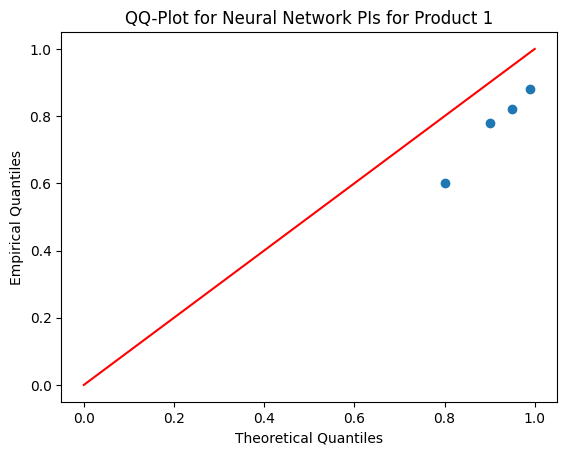

Alpha: 0.01, PICP: 96.00%, MPIW: 5.3598
Alpha: 0.05, PICP: 92.00%, MPIW: 4.4219
Alpha: 0.1, PICP: 88.00%, MPIW: 3.3478
Alpha: 0.2, PICP: 62.00%, MPIW: 2.2782


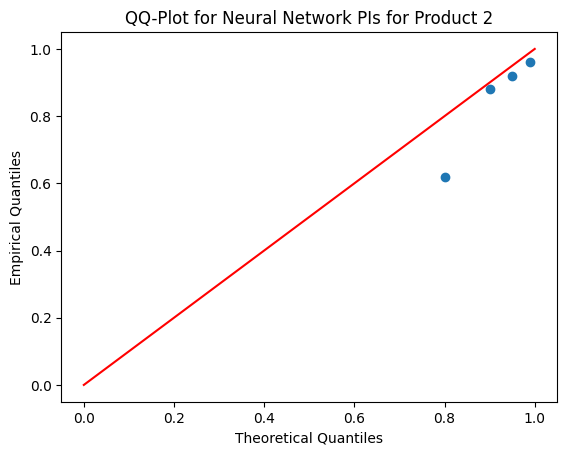

Alpha: 0.01, PICP: 90.00%, MPIW: 5.7382
Alpha: 0.05, PICP: 84.00%, MPIW: 4.1395
Alpha: 0.1, PICP: 82.00%, MPIW: 3.1743
Alpha: 0.2, PICP: 60.00%, MPIW: 2.3000


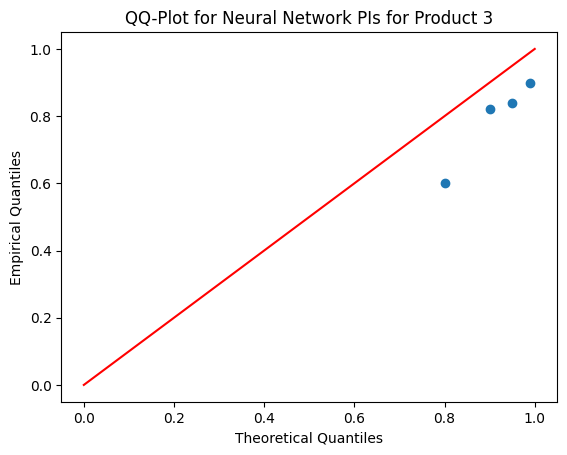

Alpha: 0.01, PICP: 90.00%, MPIW: 4.1769
Alpha: 0.05, PICP: 82.00%, MPIW: 3.4266
Alpha: 0.1, PICP: 72.00%, MPIW: 2.7959
Alpha: 0.2, PICP: 66.00%, MPIW: 1.7104


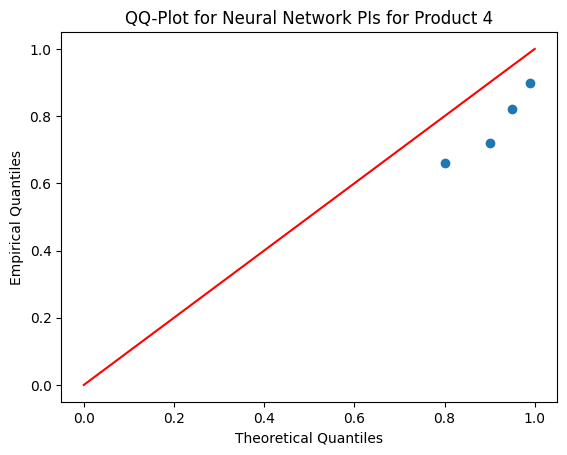

In [33]:
#  High Quality
#  https://github.com/TeaPearce/Deep_Learning_Prediction_Intervals
def get_nn_model(alpha_):
    ''' 
    Build model for each fold with significance level as input 
    '''
    
    lambda_ = 0.01 # lambda in loss fn
    #alpha_ = 0.05  # capturing (1-alpha)% of samples
    soften_ = 160.
    n_ = 100 # batch size
    
    model = Sequential()
    model.add(Dense(100, input_dim=1, activation='relu',
                    kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.2)))
    model.add(Dense(2, activation='linear',
                    kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.3), 
                    bias_initializer=keras.initializers.Constant(value=[1.,-1.]))) # important to init biases to start!

    def qd_objective(y_true, y_pred):
        '''Loss_QD-soft, from algorithm 1'''
        y_true = y_true[:,0]
        y_u = y_pred[:,0]
        y_l = y_pred[:,1]
        
        K_HU = tf.maximum(0.,tf.sign(y_u - y_true))
        K_HL = tf.maximum(0.,tf.sign(y_true - y_l))
        K_H = tf.multiply(K_HU, K_HL)
        
        K_SU = tf.sigmoid(tf.clip_by_value(soften_ * (y_u - y_true), -10, 10))
        K_SL = tf.sigmoid(tf.clip_by_value(soften_ * (y_true - y_l), -10, 10))

        K_S = tf.multiply(K_SU, K_SL)
        epsilon = 1e-7
        MPIW_c = tf.reduce_sum(tf.multiply((y_u - y_l), K_H)) / (tf.reduce_sum(K_H) )

        PICP_H = tf.reduce_mean(K_H)
        PICP_S = tf.reduce_mean(K_S)
        
        Loss_S = MPIW_c + lambda_ * n_ / (alpha_*(1-alpha_)) * tf.maximum(0.,(1-alpha_) - PICP_S)
        
        return Loss_S
    
    # Learning rate scheduler - initial experiment
    early_stopping = EarlyStopping(monitor='loss', 
                                patience=30,     
                                verbose=1,      
                                restore_best_weights=True)

    lr_schedule = keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=1e-2,
        decay_steps=10000,
        decay_rate=0.9)
    #opt = keras.optimizers.legacy.Adam(learning_rate=lr_schedule)
    opt = keras.optimizers.legacy.Adam(lr=0.02, decay=0.01)
    model.compile(loss=qd_objective, optimizer=opt)
    
    return model



def compute_and_plot_NN_QQ(data, tscv, product_name, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]):
    empirical_quantiles = {}
    normalization_factor = np.max(data) - np.min(data)
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}
    NMPIW_dict = {alpha: [] for alpha in alpha_levels}
  
    for train_index, test_index in tscv.split(data):
        X_train, X_test = train_index.reshape(-1, 1), test_index.reshape(-1, 1)
        y_train, y_test = data[train_index], data[test_index]

        # Normalizing X and y - Important for the algorithm
        X_train_mean, X_train_std = np.mean(X_train), np.std(X_train)
        X_train = (X_train - X_train_mean) / X_train_std
        y_mean, y_std = np.mean(y_train), np.std(y_train)
        y_train = (y_train - y_mean) / y_std
        X_test = (X_test - X_train_mean) / X_train_std
        y_test = (y_test - y_mean) / y_std

        for alpha in alpha_levels:
            model = get_nn_model(alpha)
            model.fit(X_train, y_train, epochs=400, batch_size=100, verbose=0)

            y_pred_test = model.predict(X_test, verbose=0)
            
            
            y_u_pred_test = y_pred_test[:, 0]
            y_l_pred_test = y_pred_test[:, 1]

            within_interval_count = np.sum(np.logical_and(y_l_pred_test <= y_test, y_u_pred_test >= y_test))
            total_width = np.sum(y_u_pred_test - y_l_pred_test)
            PICP = within_interval_count / len(y_test)
            MPIW = total_width / len(y_test)

            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)
            NMPIW_dict[alpha].append((np.sum(y_u_pred_test - y_l_pred_test))/normalization_factor)

            if alpha not in empirical_quantiles:
                empirical_quantiles[alpha] = []
            empirical_quantiles[alpha].append(PICP)
            
    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}
    NMPIW_values = {alpha: np.mean(values) for alpha, values in NMPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f},  NMPIW: {NMPIW_values[alpha]:.4f}")
  
    empirical_quantiles = {alpha: np.mean(values) for alpha, values in empirical_quantiles.items()}

    
    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [empirical_quantiles[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for High Quality PIs for {product_name}')
    plt.show()

# apply HQ LUBE to stationary data

products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]

for data, product_name in products_data:
    compute_and_plot_NN_QQ(data, tscv, product_name)

Alpha: 0.01, PICP: 86.00%, MPIW: 4.9050
Alpha: 0.05, PICP: 74.00%, MPIW: 2.6607
Alpha: 0.1, PICP: 66.00%, MPIW: 2.1902
Alpha: 0.2, PICP: 48.00%, MPIW: 1.6399
Alpha: 0.3, PICP: 38.00%, MPIW: nan


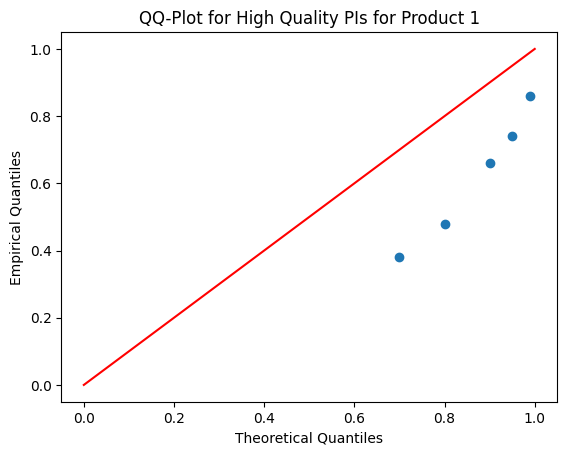

Alpha: 0.01, PICP: 96.00%, MPIW: 5.3435
Alpha: 0.05, PICP: 88.00%, MPIW: 3.9888
Alpha: 0.1, PICP: 76.00%, MPIW: 2.8294
Alpha: 0.2, PICP: 52.00%, MPIW: 1.8589
Alpha: 0.3, PICP: 38.00%, MPIW: nan


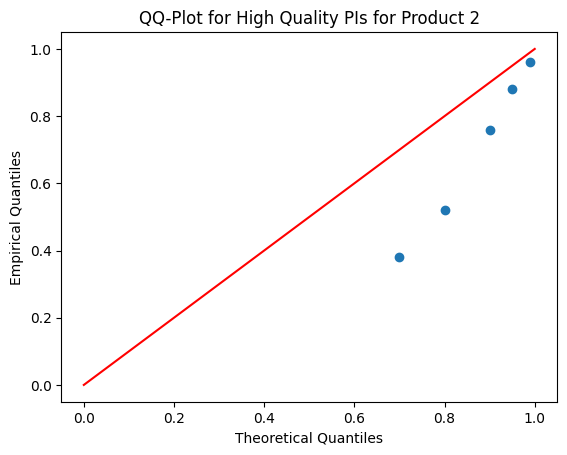

Alpha: 0.01, PICP: 90.00%, MPIW: 5.4474
Alpha: 0.05, PICP: 78.00%, MPIW: 4.1738
Alpha: 0.1, PICP: 74.00%, MPIW: 2.7037
Alpha: 0.2, PICP: 38.00%, MPIW: 1.3642
Alpha: 0.3, PICP: 30.00%, MPIW: nan


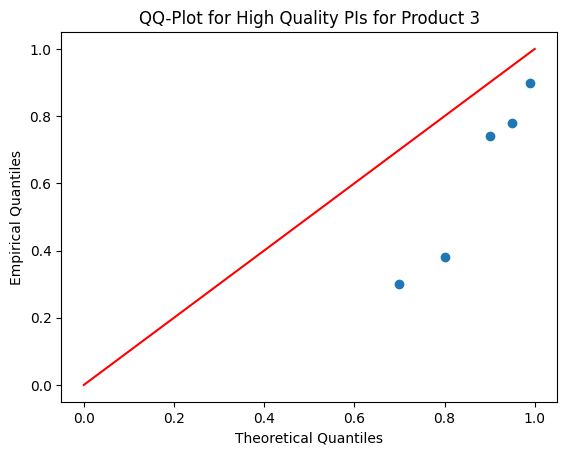

Alpha: 0.01, PICP: 88.00%, MPIW: 4.6948
Alpha: 0.05, PICP: 78.00%, MPIW: 2.8737
Alpha: 0.1, PICP: 70.00%, MPIW: 2.5272
Alpha: 0.2, PICP: 58.00%, MPIW: 1.5882
Alpha: 0.3, PICP: 20.00%, MPIW: nan


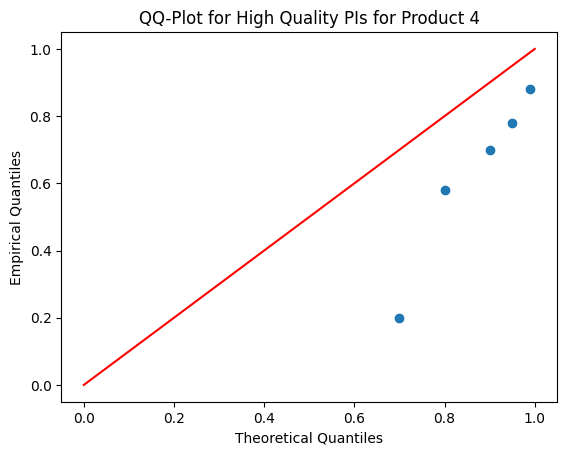

In [7]:
# multi step

import numpy as np
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout
import keras
from keras import backend as K
import tensorflow as tf
from keras.callbacks import EarlyStopping
from sklearn.model_selection import TimeSeriesSplit
# hyperparameters
lambda_ = 0.01 # lambda in loss fn
soften_ = 160.
n_ = 50 # batch size

#  High Quality
#  https://github.com/TeaPearce/Deep_Learning_Prediction_Intervals
def get_nn_model(alpha_):
    ''' 
    Build model for each fold with significance level as input 
    '''
    
    lambda_ = 0.01 # lambda in loss fn
    #alpha_ = 0.05  # capturing (1-alpha)% of samples
    soften_ = 160.
    n_ = 100 # batch size
    
    model = Sequential()
    model.add(Dense(100, input_dim=1, activation='relu',
                    kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.2)))
    model.add(Dense(2, activation='linear',
                    kernel_initializer=keras.initializers.RandomNormal(mean=0.0, stddev=0.3), 
                    bias_initializer=keras.initializers.Constant(value=[1.,-1.]))) # important to init biases to start!

    def qd_objective(y_true, y_pred):
        '''Loss_QD-soft, from algorithm 1'''
        y_true = y_true[:,0]
        y_u = y_pred[:,0]
        y_l = y_pred[:,1]
        
        K_HU = tf.maximum(0.,tf.sign(y_u - y_true))
        K_HL = tf.maximum(0.,tf.sign(y_true - y_l))
        K_H = tf.multiply(K_HU, K_HL)
        
        K_SU = tf.sigmoid(tf.clip_by_value(soften_ * (y_u - y_true), -10, 10))
        K_SL = tf.sigmoid(tf.clip_by_value(soften_ * (y_true - y_l), -10, 10))

        #K_SU = tf.sigmoid(soften_ * (y_u - y_true))
        #K_SL = tf.sigmoid(soften_ * (y_true - y_l))
        K_S = tf.multiply(K_SU, K_SL)
        epsilon = 1e-7
        MPIW_c = tf.reduce_sum(tf.multiply((y_u - y_l), K_H)) / (tf.reduce_sum(K_H) )

        #MPIW_c = tf.reduce_sum(tf.multiply((y_u - y_l),K_H))/tf.reduce_sum(K_H)
        PICP_H = tf.reduce_mean(K_H)
        PICP_S = tf.reduce_mean(K_S)
        
        Loss_S = MPIW_c + lambda_ * n_ / (alpha_*(1-alpha_)) * tf.maximum(0.,(1-alpha_) - PICP_S)
        
        return Loss_S
    
    # Learning rate scheduler - initial experiment
    early_stopping = EarlyStopping(monitor='loss', 
                                patience=30,     
                                verbose=1,      
                                restore_best_weights=True)

    lr_schedule = keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=1e-2,
        decay_steps=10000,
        decay_rate=0.9)
    #opt = keras.optimizers.legacy.Adam(learning_rate=lr_schedule)
    opt = keras.optimizers.legacy.Adam(lr=0.02, decay=0.01)
    model.compile(loss=qd_objective, optimizer=opt)
    
    return model



def compute_and_plot_NN_QQ(data, tscv, product_name, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]):
    empirical_quantiles = {}

    normalization_factor = np.max(data) - np.min(data)
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}
    NMPIW_dict = {alpha: [] for alpha in alpha_levels}
  
    for train_index, test_index in tscv.split(data):
        X_train, X_test = train_index.reshape(-1, 1), test_index.reshape(-1, 1)
        y_train, y_test = data[train_index], data[test_index]

        # Normalizing X and y - Important for the algorithm
        X_train_mean, X_train_std = np.mean(X_train), np.std(X_train)
        X_train = (X_train - X_train_mean) / X_train_std
        y_mean, y_std = np.mean(y_train), np.std(y_train)
        y_train = (y_train - y_mean) / y_std
        X_test = (X_test - X_train_mean) / X_train_std
        y_test = (y_test - y_mean) / y_std

        for alpha in alpha_levels:
            model = get_nn_model(alpha)
            model.fit(X_train, y_train, epochs=400, batch_size=100, verbose=0)

            y_pred_test = model.predict(X_test, verbose=0)
            
            
            y_u_pred_test = y_pred_test[:, 0]
            y_l_pred_test = y_pred_test[:, 1]

            within_interval_count = np.sum(np.logical_and(y_l_pred_test <= y_test, y_u_pred_test >= y_test))
            total_width = np.sum(y_u_pred_test - y_l_pred_test)
            PICP = within_interval_count / len(y_test)
            MPIW = total_width / len(y_test)

            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)
            NMPIW_dict[alpha].append(total_width/normalization_factor)

            if alpha not in empirical_quantiles:
                empirical_quantiles[alpha] = []
            empirical_quantiles[alpha].append(PICP)
            
    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}
    NMPIW_values = {alpha: np.mean(values) for alpha, values in NMPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f},  NMPIW: {NMPIW_values[alpha]:.4f}")
    
    empirical_quantiles = {alpha: np.mean(values) for alpha, values in empirical_quantiles.items()}

    
    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [empirical_quantiles[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for High Quality PIs for {product_name}')
    plt.show()

# apply HQ lower upper bound to stationary data

products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]
tscv = TimeSeriesSplit(n_splits=10,test_size=5,max_train_size=100)
alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]
for data, product_name in products_data:
    compute_and_plot_NN_QQ(data, tscv, product_name, alpha_levels=alpha_levels)

Alpha: 0.01, PICP: 88.00%, MPIW: 5.3571
Alpha: 0.05, PICP: 84.00%, MPIW: 3.2208
Alpha: 0.1, PICP: 78.00%, MPIW: 2.5892
Alpha: 0.2, PICP: 60.00%, MPIW: 1.7784


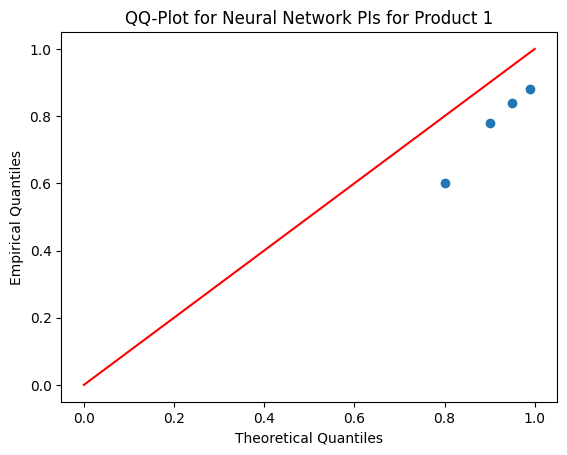

Alpha: 0.01, PICP: 92.00%, MPIW: 4.9207
Alpha: 0.05, PICP: 96.00%, MPIW: 4.3810
Alpha: 0.1, PICP: 84.00%, MPIW: 3.3355
Alpha: 0.2, PICP: 56.00%, MPIW: 2.1373


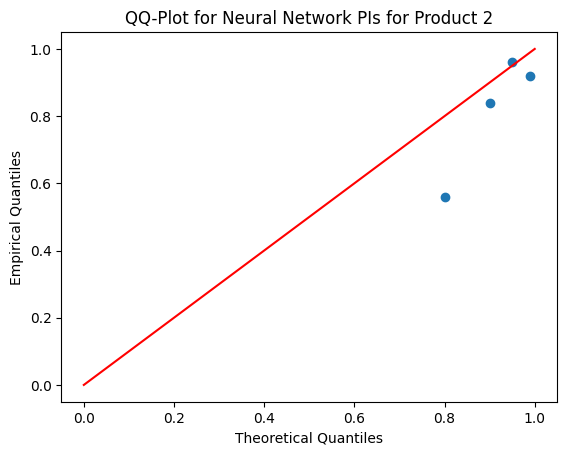

Alpha: 0.01, PICP: 90.00%, MPIW: 5.6023
Alpha: 0.05, PICP: 86.00%, MPIW: 4.0795
Alpha: 0.1, PICP: 82.00%, MPIW: 3.2434
Alpha: 0.2, PICP: 54.00%, MPIW: 2.1867


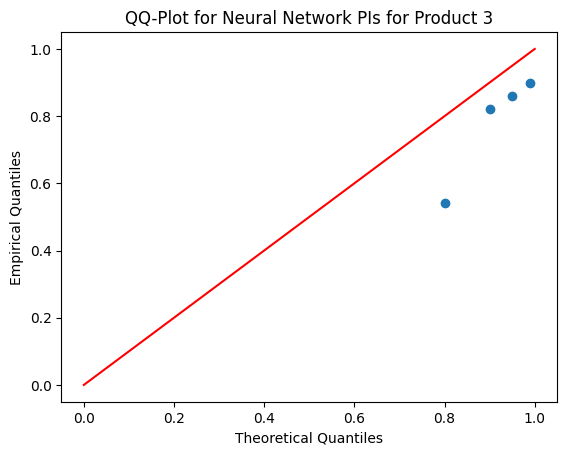

Alpha: 0.01, PICP: 88.00%, MPIW: 3.8730
Alpha: 0.05, PICP: 84.00%, MPIW: 3.1993
Alpha: 0.1, PICP: 78.00%, MPIW: 2.9998
Alpha: 0.2, PICP: 56.00%, MPIW: 1.7188


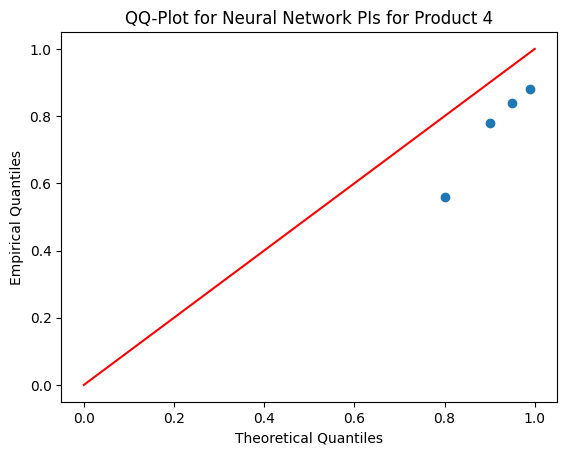

In [34]:
# with original
for data, product_name in products_data:
    compute_and_plot_NN_QQ(data, tscv, product_name)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/keras/src/optimizers/legacy/adam.py:118: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


Alpha: 0.01, PICP: 84.00%, MPIW: 3.6398
Alpha: 0.05, PICP: 72.00%, MPIW: 2.1900
Alpha: 0.1, PICP: 74.00%, MPIW: 1.5558
Alpha: 0.2, PICP: 54.00%, MPIW: nan


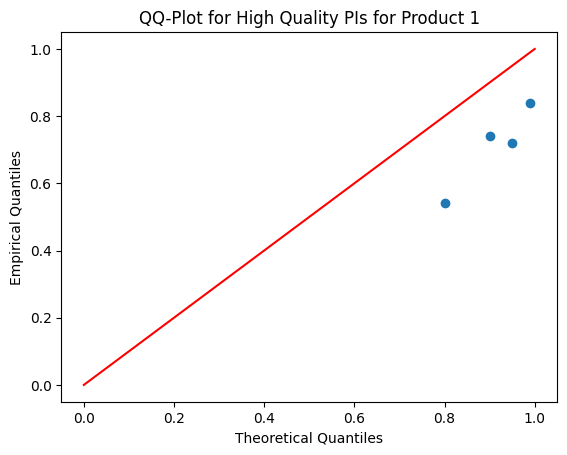

Alpha: 0.01, PICP: 92.00%, MPIW: 3.5846
Alpha: 0.05, PICP: 90.00%, MPIW: 3.0912
Alpha: 0.1, PICP: 80.00%, MPIW: nan
Alpha: 0.2, PICP: 52.00%, MPIW: nan


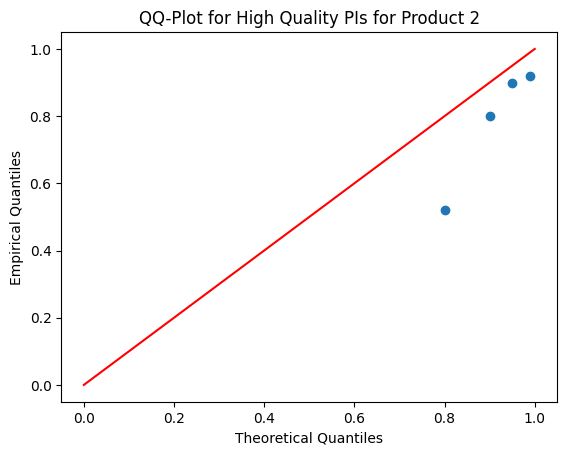

Alpha: 0.01, PICP: 90.00%, MPIW: 4.5616
Alpha: 0.05, PICP: 90.00%, MPIW: 4.0220
Alpha: 0.1, PICP: 76.00%, MPIW: 3.2212
Alpha: 0.2, PICP: 44.00%, MPIW: nan


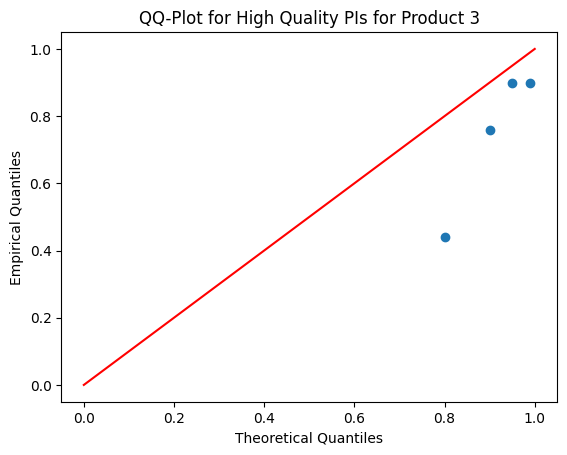

Alpha: 0.01, PICP: 86.00%, MPIW: 4.2133
Alpha: 0.05, PICP: 68.00%, MPIW: 2.2157
Alpha: 0.1, PICP: 50.00%, MPIW: 1.5995
Alpha: 0.2, PICP: 32.00%, MPIW: nan


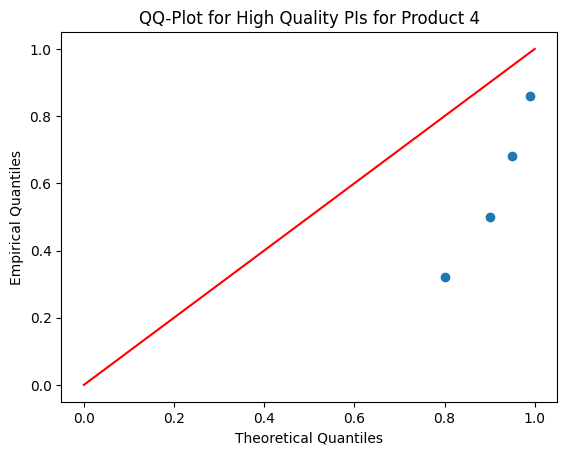

In [20]:
# Apply HQ LUBE to original data

products_data = [
    (product1['bedarf_stueck'].values, "Product 1"),
    (product2['bedarf_stueck'].values, "Product 2"),
    (product3['bedarf_stueck'].values, "Product 3"),
    (product4['bedarf_stueck'].values, "Product 4")
]

for data, product_name in products_data:
    compute_and_plot_NN_QQ(data, tscv, product_name)

## MVE Method

In [6]:
from sklearn.model_selection import TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=50,test_size=1,max_train_size=100)

In [16]:
from neural_networks import MVENetwork

In [17]:
n_hidden = np.array([40, 20, 20, 20, 10, 10, 10, 10])
n_epochs = 1000

Alpha: 0.01, PICP: 92.00%, MPIW: 4.2483,  NMPIW: 0.6305
Alpha: 0.05, PICP: 92.00%, MPIW: 3.2326,  NMPIW: 0.4797
Alpha: 0.1, PICP: 88.00%, MPIW: 2.7128,  NMPIW: 0.4026
Alpha: 0.2, PICP: 82.00%, MPIW: 2.1137,  NMPIW: 0.3137
Alpha: 0.3, PICP: 78.00%, MPIW: 1.7094,  NMPIW: 0.2537


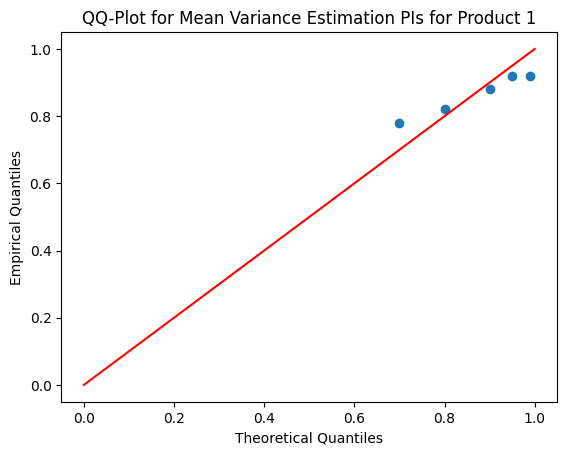

Alpha: 0.01, PICP: 100.00%, MPIW: 2.2047,  NMPIW: 1.1588
Alpha: 0.05, PICP: 96.00%, MPIW: 1.6776,  NMPIW: 0.8818
Alpha: 0.1, PICP: 96.00%, MPIW: 1.4079,  NMPIW: 0.7400
Alpha: 0.2, PICP: 82.00%, MPIW: 1.0969,  NMPIW: 0.5765
Alpha: 0.3, PICP: 70.00%, MPIW: 0.8871,  NMPIW: 0.4663


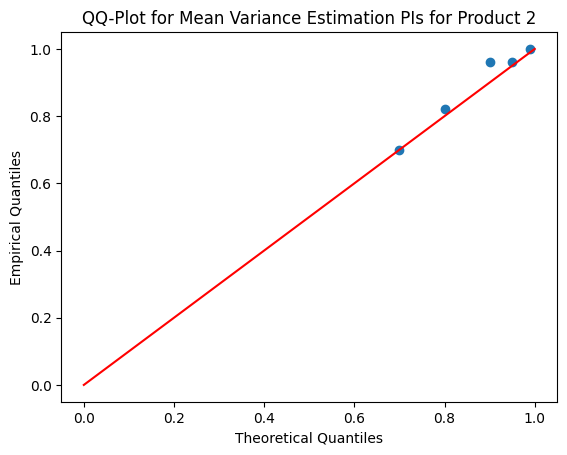

Alpha: 0.01, PICP: 96.00%, MPIW: 5.2452,  NMPIW: 0.9508
Alpha: 0.05, PICP: 92.00%, MPIW: 3.9911,  NMPIW: 0.7235
Alpha: 0.1, PICP: 90.00%, MPIW: 3.3495,  NMPIW: 0.6072
Alpha: 0.2, PICP: 88.00%, MPIW: 2.6097,  NMPIW: 0.4731
Alpha: 0.3, PICP: 76.00%, MPIW: 2.1105,  NMPIW: 0.3826


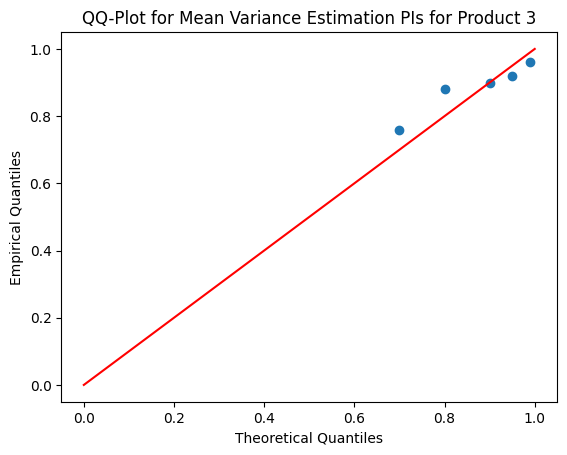

Alpha: 0.01, PICP: 94.00%, MPIW: 5.2131,  NMPIW: 0.6581
Alpha: 0.05, PICP: 92.00%, MPIW: 3.9667,  NMPIW: 0.5008
Alpha: 0.1, PICP: 88.00%, MPIW: 3.3289,  NMPIW: 0.4203
Alpha: 0.2, PICP: 82.00%, MPIW: 2.5937,  NMPIW: 0.3274
Alpha: 0.3, PICP: 72.00%, MPIW: 2.0976,  NMPIW: 0.2648


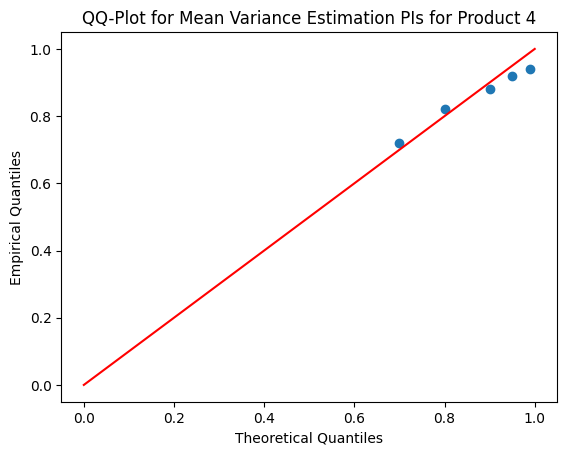

In [18]:
from scipy.stats import norm
from scipy.stats import t   # experiment whether or not t-dist is better than normal -> it does not improve

def compute_and_plot_MVE_QQ(data, tscv, product_name, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]):
    empirical_quantiles = {}
    normalization_factor = np.max(data) - np.min(data)
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}
    NMPIW_dict = {alpha: [] for alpha in alpha_levels}
  
    for train_index, test_index in tscv.split(data):
        X_train, X_test = train_index.reshape(-1, 1), test_index.reshape(-1, 1)
        y_train, y_test = data[train_index], data[test_index]

        # MVE with seperate regularization
        # input: unnormalized data
        model = MVENetwork(X=X_train, Y=y_train, n_hidden_mean=n_hidden, n_hidden_var=n_hidden, 
                           n_epochs=100, verbose=0, warmup=0, fixed_mean=1, batch_size=100, 
                           reg_mean=0, reg_var=1)
        
        for alpha in alpha_levels:
            means = model.f(X_test)
            sigmas = model.sigma(X_test)
      
            z_value = norm.ppf(1-alpha/2)  # z-score from the normal distribution
            
            y_u_pred_test = means + z_value * sigmas
            y_l_pred_test = means - z_value * sigmas
            
            
            within_interval_count = np.sum(np.logical_and(y_l_pred_test <= y_test, y_u_pred_test >= y_test))
            total_width = np.sum(y_u_pred_test - y_l_pred_test)
            PICP = within_interval_count / len(y_test)
            MPIW = total_width / len(y_test)

            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)
            NMPIW_dict[alpha].append(MPIW/normalization_factor)

            if alpha not in empirical_quantiles:
                empirical_quantiles[alpha] = []
            empirical_quantiles[alpha].append(PICP)
            
    
    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}
    NMPIW_values = {alpha: np.mean(values) for alpha, values in NMPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f},  NMPIW: {NMPIW_values[alpha]:.4f}")

    empirical_quantiles = {alpha: np.mean(values) for alpha, values in empirical_quantiles.items()}

    
    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [empirical_quantiles[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')  
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for Mean Variance Estimation PIs for {product_name}')
    plt.show()


products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]
alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]
tscv = TimeSeriesSplit(n_splits=50,test_size=1,max_train_size=100)
for data, product_name in products_data:
    compute_and_plot_MVE_QQ(data, tscv=tscv, product_name=product_name,alpha_levels=alpha_levels)

Alpha: 0.01, PICP: 94.00%, MPIW: 46.1396
Alpha: 0.05, PICP: 86.00%, MPIW: 35.1079
Alpha: 0.1, PICP: 80.00%, MPIW: 29.4635
Alpha: 0.2, PICP: 78.00%, MPIW: 22.9558


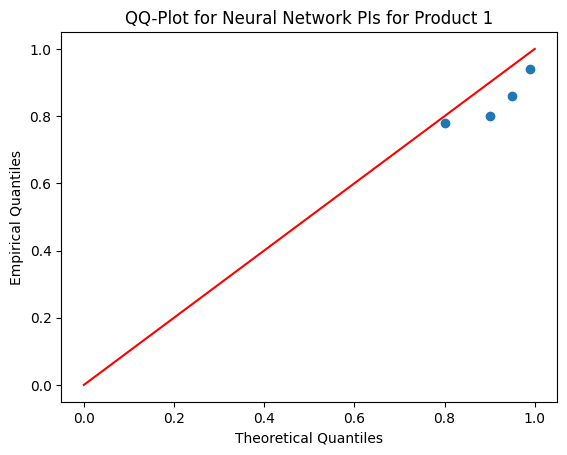

Alpha: 0.01, PICP: 94.00%, MPIW: 46.1509
Alpha: 0.05, PICP: 88.00%, MPIW: 35.1165
Alpha: 0.1, PICP: 82.00%, MPIW: 29.4707
Alpha: 0.2, PICP: 80.00%, MPIW: 22.9615


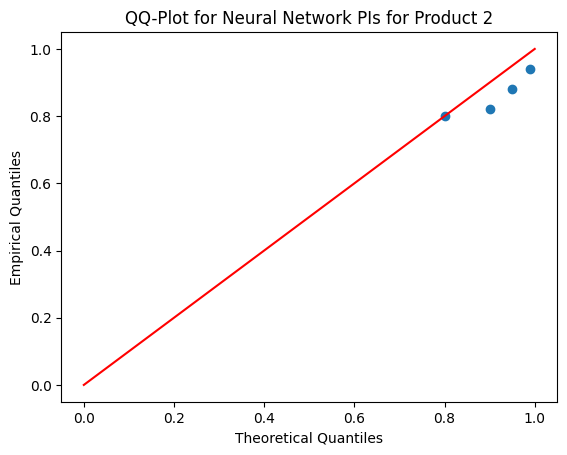

Alpha: 0.01, PICP: 94.00%, MPIW: 46.1316
Alpha: 0.05, PICP: 90.00%, MPIW: 35.1018
Alpha: 0.1, PICP: 82.00%, MPIW: 29.4584
Alpha: 0.2, PICP: 76.00%, MPIW: 22.9518


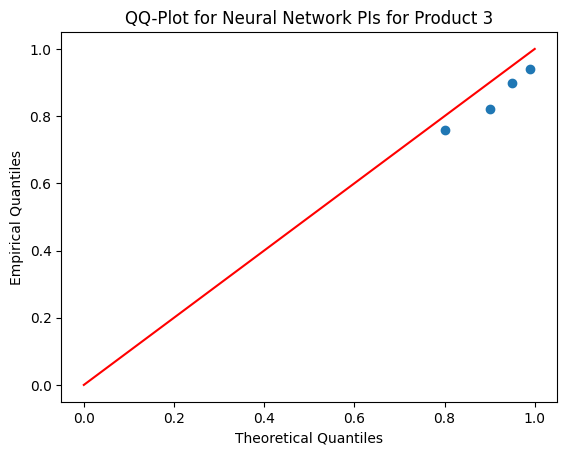

Alpha: 0.01, PICP: 94.00%, MPIW: 46.0610
Alpha: 0.05, PICP: 90.00%, MPIW: 35.0481
Alpha: 0.1, PICP: 84.00%, MPIW: 29.4133
Alpha: 0.2, PICP: 80.00%, MPIW: 22.9167


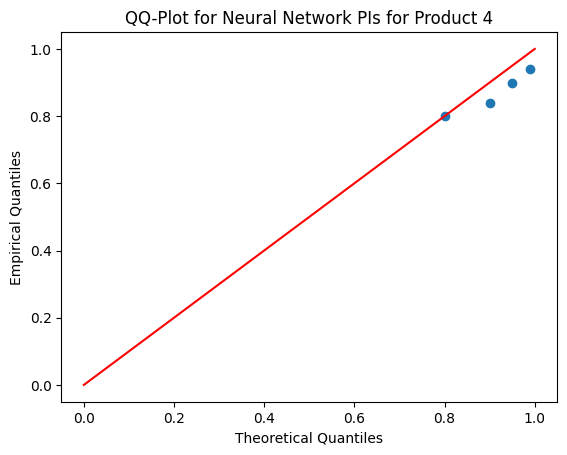

In [15]:
# apply MVE to original data

products_data = [
    (product1['bedarf_stueck'].values, "Product 1"),
    (product1['bedarf_stueck'].values, "Product 2"),
    (product1['bedarf_stueck'].values, "Product 3"),
    (product1['bedarf_stueck'].values, "Product 4")
]

for data, product_name in products_data:
    compute_and_plot_MVE_QQ(data, tscv, product_name)

Alpha: 0.01, PICP: 97.33%, MPIW: 4.8299,  NMPIW: 0.7168
Alpha: 0.05, PICP: 96.00%, MPIW: 3.6751,  NMPIW: 0.5454
Alpha: 0.1, PICP: 94.67%, MPIW: 3.0843,  NMPIW: 0.4577
Alpha: 0.2, PICP: 90.00%, MPIW: 2.4030,  NMPIW: 0.3566
Alpha: 0.3, PICP: 82.67%, MPIW: 1.9434,  NMPIW: 0.2884


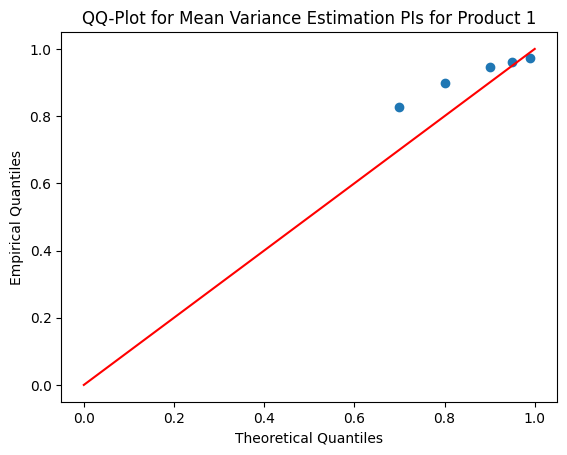

Alpha: 0.01, PICP: 99.33%, MPIW: 2.1294,  NMPIW: 1.1192
Alpha: 0.05, PICP: 98.67%, MPIW: 1.6203,  NMPIW: 0.8516
Alpha: 0.1, PICP: 93.33%, MPIW: 1.3598,  NMPIW: 0.7147
Alpha: 0.2, PICP: 84.67%, MPIW: 1.0594,  NMPIW: 0.5569
Alpha: 0.3, PICP: 78.00%, MPIW: 0.8568,  NMPIW: 0.4503


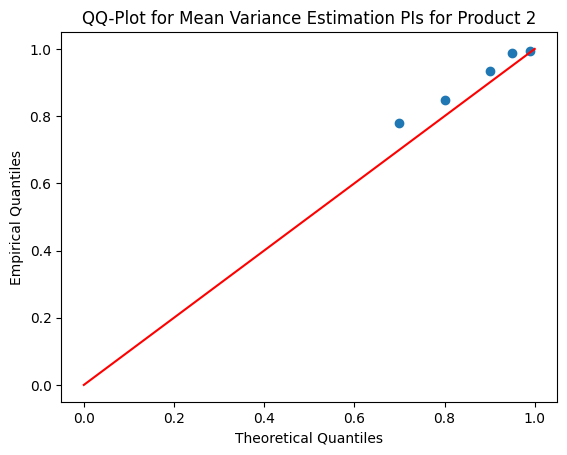

Alpha: 0.01, PICP: 99.33%, MPIW: 5.0468,  NMPIW: 0.9148
Alpha: 0.05, PICP: 94.67%, MPIW: 3.8402,  NMPIW: 0.6961
Alpha: 0.1, PICP: 92.00%, MPIW: 3.2228,  NMPIW: 0.5842
Alpha: 0.2, PICP: 87.33%, MPIW: 2.5110,  NMPIW: 0.4552
Alpha: 0.3, PICP: 78.67%, MPIW: 2.0307,  NMPIW: 0.3681


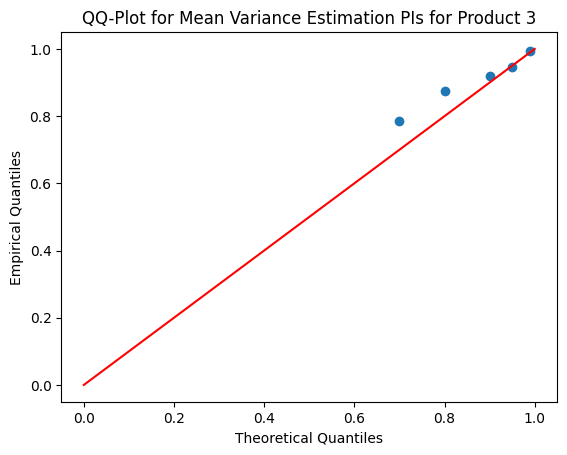

Alpha: 0.01, PICP: 98.00%, MPIW: 5.8436,  NMPIW: 0.7377
Alpha: 0.05, PICP: 96.67%, MPIW: 4.4464,  NMPIW: 0.5614
Alpha: 0.1, PICP: 93.33%, MPIW: 3.7315,  NMPIW: 0.4711
Alpha: 0.2, PICP: 90.00%, MPIW: 2.9073,  NMPIW: 0.3670
Alpha: 0.3, PICP: 84.00%, MPIW: 2.3513,  NMPIW: 0.2968


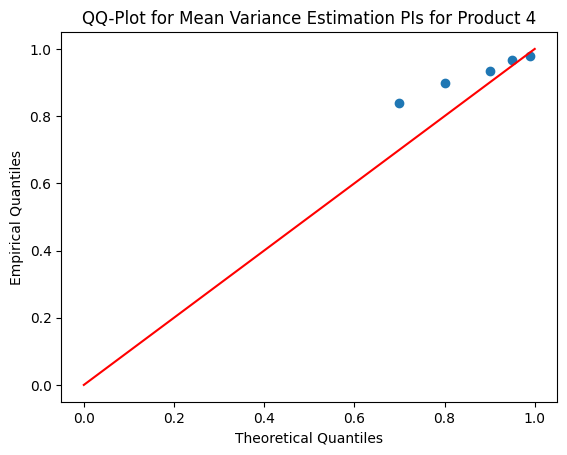

In [29]:
# multi step forecasting with MVE
from scipy.stats import norm
from scipy.stats import t 
def compute_and_plot_MVE_QQ(data, tscv, product_name, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]):
    empirical_quantiles = {}
    normalization_factor = np.max(data) - np.min(data)
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}
    NMPIW_dict = {alpha: [] for alpha in alpha_levels}
  
    for train_index, test_index in tscv.split(data):
        X_train, X_test = train_index.reshape(-1, 1), test_index.reshape(-1, 1)
        y_train, y_test = data[train_index], data[test_index]

        # MVE with seperate regularization
        # input: unnormalized data!!!
        model = MVENetwork(X=X_train, Y=y_train, n_hidden_mean=n_hidden, n_hidden_var=n_hidden, 
                           n_epochs=100, verbose=0, warmup=0, fixed_mean=1, batch_size=50, 
                           reg_mean=0, reg_var=1)
        
        for alpha in alpha_levels:
            means = model.f(X_test)
            sigmas = model.sigma(X_test)
      
            z_value = norm.ppf(1-alpha/2)  # z-score from the normal distribution
            
            y_u_pred_test = means + z_value * sigmas
            y_l_pred_test = means - z_value * sigmas
            
            within_interval_count = np.sum(np.logical_and(y_l_pred_test <= y_test, y_u_pred_test >= y_test))

            #for i in range(len(y_test)):
            #    print(f"True value: {y_test[i]}, Predicted interval: [{y_l_pred_test[i]}, {y_u_pred_test[i]}]")

            total_width = np.sum(y_u_pred_test - y_l_pred_test)
            PICP = within_interval_count / len(y_test)
            MPIW = total_width / len(y_test)

            
            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)
            NMPIW_dict[alpha].append(MPIW/normalization_factor)

            
            if alpha not in empirical_quantiles:
                empirical_quantiles[alpha] = []
            empirical_quantiles[alpha].append(PICP)
            
    
    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}
    NMPIW_values = {alpha: np.mean(values) for alpha, values in NMPIW_dict.items()}
    
    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f},  NMPIW: {NMPIW_values[alpha]:.4f}")

    empirical_quantiles = {alpha: np.mean(values) for alpha, values in empirical_quantiles.items()}

    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [empirical_quantiles[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-') 
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for Mean Variance Estimation PIs for {product_name}')
    plt.show()

tscv = TimeSeriesSplit(n_splits=10,test_size=5,max_train_size=50)
products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]
alpha_levels = [0.01, 0.05, 0.10, 0.20, 0.30]
tscv = TimeSeriesSplit(n_splits=30,test_size=5,max_train_size=100)
for data, product_name in products_data:
    compute_and_plot_MVE_QQ(data, tscv=tscv, product_name=product_name,alpha_levels=alpha_levels)

## ML method plus Bootstrap

First: Ridge Regression plus Bootstrap (simple case)
Not included in thesis

Alpha: 0.01, PICP: 92.00%, MPIW: 4.6308
Alpha: 0.05, PICP: 92.00%, MPIW: 2.9640
Alpha: 0.1, PICP: 80.00%, MPIW: 2.1649
Alpha: 0.2, PICP: 78.00%, MPIW: 1.5998


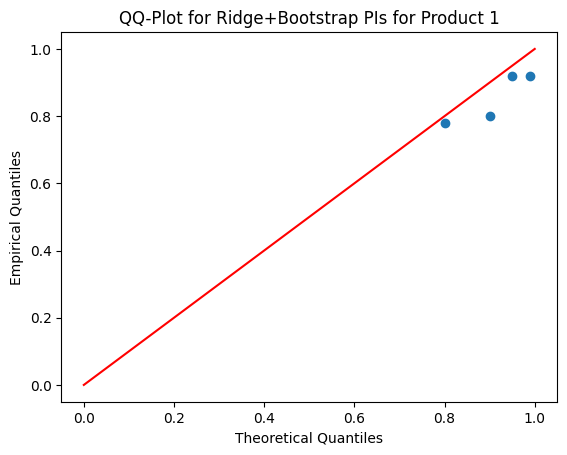

Alpha: 0.01, PICP: 98.00%, MPIW: 1.8640
Alpha: 0.05, PICP: 96.00%, MPIW: 1.4318
Alpha: 0.1, PICP: 92.00%, MPIW: 1.1784
Alpha: 0.2, PICP: 72.00%, MPIW: 0.8681


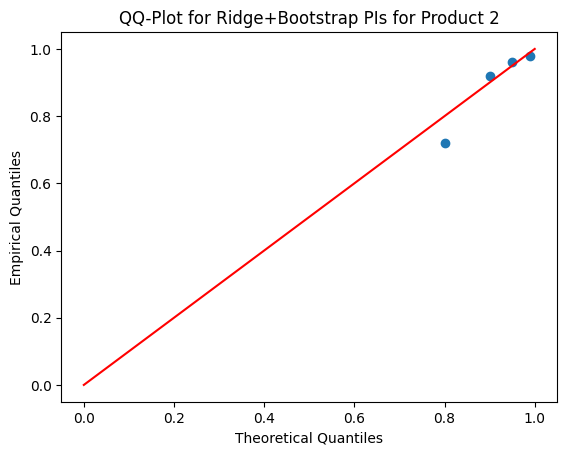

Alpha: 0.01, PICP: 96.00%, MPIW: 4.6992
Alpha: 0.05, PICP: 92.00%, MPIW: 3.7611
Alpha: 0.1, PICP: 88.00%, MPIW: 2.8054
Alpha: 0.2, PICP: 74.00%, MPIW: 2.0353


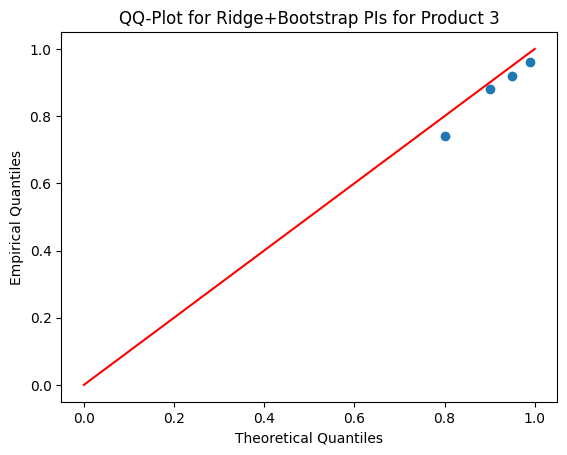

Alpha: 0.01, PICP: 94.00%, MPIW: 5.3496
Alpha: 0.05, PICP: 90.00%, MPIW: 3.7320
Alpha: 0.1, PICP: 86.00%, MPIW: 2.7977
Alpha: 0.2, PICP: 74.00%, MPIW: 1.9865


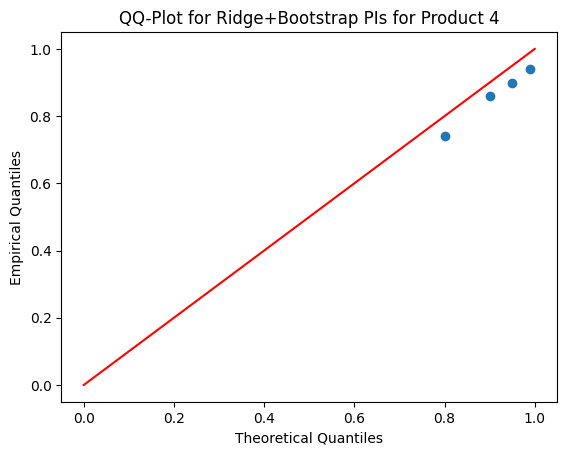

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import Ridge
from sklearn.utils import resample
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import TimeSeriesSplit


def bootstrap_intervals(model, X_train, y_train, X_test, alpha_level):
    model.fit(X_train, y_train)
    predictions = model.predict(X_test)
    residuals = y_train - model.predict(X_train)

    n_bootstrap = 1000
    lower_percentile = 100 * alpha_level / 2
    upper_percentile = 100 * (1 - alpha_level / 2)

    residuals_bootstrap = resample(residuals, replace=True, n_samples=len(y_train)*n_bootstrap)
    residuals_bootstrap = residuals_bootstrap.reshape(len(y_train), n_bootstrap)
    predictions_bootstrap = predictions.reshape(-1, 1) + residuals_bootstrap[:len(predictions)]
    
    lower = np.percentile(predictions_bootstrap, lower_percentile, axis=1)
    upper = np.percentile(predictions_bootstrap, upper_percentile, axis=1)
    
    return lower, upper, predictions

def compute_and_plot_ridge_bootstrap(data, tscv, product_name, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]):
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}
    
    for train_index, test_index in tscv.split(data):
        
        X_train, X_test = train_index.reshape(-1, 1), test_index.reshape(-1, 1)
        y_train, y_test = data[train_index], data[test_index]

        ridge = Ridge(alpha=1.0)

        for alpha in alpha_levels:
            lower, upper, predictions = bootstrap_intervals(ridge, X_train, y_train, X_test, alpha)
            
            within_interval = np.logical_and(lower <= y_test, upper >= y_test)
            PICP = np.mean(within_interval)
            MPIW = np.mean(upper - lower)
            
            
            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)

    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}
    
    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f}")
    
    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [PICP_values[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for Ridge+Bootstrap PIs for {product_name}')
    plt.show()

tscv = TimeSeriesSplit(n_splits=50, test_size=1, max_train_size=100)

products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]

for data, product_name in products_data:
    compute_and_plot_ridge_bootstrap(data, tscv, product_name)


In [43]:
# code from https://www.saattrupdan.com/2020-03-01-bootstrap-prediction
# not included in thesis
def prediction_interval(model, X_train, y_train, x0, alpha: float = 0.05):
  ''' Compute a prediction interval around the model's prediction of x0.

  INPUT
    model
      A predictive model with `fit` and `predict` methods
    X_train: numpy array of shape (n_samples, n_features)
      A numpy array containing the training input data
    y_train: numpy array of shape (n_samples,)
      A numpy array containing the training target data
    x0
      A new data point, of shape (n_features,)
    alpha: float = 0.05
      The prediction uncertainty

  OUTPUT
    A triple (`lower`, `pred`, `upper`) with `pred` being the prediction
    of the model and `lower` and `upper` constituting the lower- and upper
    bounds for the prediction interval around `pred`, respectively. '''

  # Number of training samples
  n = X_train.shape[0]

  # The authors choose the number of bootstrap samples as the square root
  # of the number of samples
  nbootstraps = np.sqrt(n).astype(int)

  # Compute the m_i's and the validation residuals
  # Compute the m_i's and the validation residuals
  bootstrap_preds, val_residuals = np.empty(nbootstraps), []
  for b in range(nbootstraps):
    train_idxs = np.random.choice(range(n), size=n, replace=True)
    val_idxs = np.array([idx for idx in range(n) if idx not in train_idxs])
    model.fit(X_train[train_idxs, :], y_train[train_idxs])
    preds = model.predict(X_train[val_idxs])
    # Ensure preds is a 2D array with a single column
    preds = preds.reshape(-1, 1)
    
    val_residuals.append(y_train[val_idxs] - preds)

  bootstrap_preds -= np.mean(bootstrap_preds)
  val_residuals = np.concatenate(val_residuals)

  # Compute the prediction and the training residuals
  model.fit(X_train, y_train)
  preds = model.predict(X_train)
  train_residuals = y_train - preds

  # Take percentiles of the training- and validation residuals to enable
  # comparisons between them
  val_residuals = np.percentile(val_residuals, q = np.arange(100))
  train_residuals = np.percentile(train_residuals, q = np.arange(100))

  # Compute the .632+ bootstrap estimate for the sample noise and bias
  no_information_error = np.mean(np.abs(np.random.permutation(y_train) - \
    np.random.permutation(preds)))
  generalisation = np.abs(val_residuals.mean() - train_residuals.mean())
  no_information_val = np.abs(no_information_error - train_residuals)
  relative_overfitting_rate = np.mean(generalisation / no_information_val)
  weight = .632 / (1 - .368 * relative_overfitting_rate)
  residuals = (1 - weight) * train_residuals + weight * val_residuals

  # Construct the C set and get the percentiles
  C = np.array([m + o for m in bootstrap_preds for o in residuals])
  qs = [100 * alpha / 2, 100 * (1 - alpha / 2)]
  percentiles = np.percentile(C, q = qs)

  return percentiles[0], model.predict(x0.reshape(1, -1)), percentiles[1]


In [45]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import TimeSeriesSplit
import numpy as np


products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]


alpha = 0.05

tscv = TimeSeriesSplit(n_splits=50, test_size=1, max_train_size=100)

for product_data, product_name in products_data:
    
    product_data = product_data.reshape(-1, 1)
    
    for train_index, test_index in tscv.split(product_data):
        X_train, X_test = train_index.reshape(-1, 1), test_index.reshape(-1, 1)
        y_train, y_test = product_data[train_index], product_data[test_index]
        
        model = DecisionTreeRegressor()
        model.fit(X_train, y_train)
        
        # one step forecast
        x0 = X_test[0]

        lower, pred, upper = prediction_interval(model, X_train, y_train, x0, alpha=alpha)
        print(f"{product_name}, Fold: {train_index[-1]} Prediction: {pred}, Interval: ({lower}, {upper})")


Product 1, Fold: 184 Prediction: [0.70865137], Interval: (-2.497539893749252, 2.426226845930214)
Product 1, Fold: 185 Prediction: [-0.26236426], Interval: (-2.4976851673321647, 2.1791584824413572)
Product 1, Fold: 186 Prediction: [0.09531018], Interval: (-2.230654814118794, 2.566004748982746)
Product 1, Fold: 187 Prediction: [0.31015493], Interval: (-2.483316172030736, 2.1908326853648092)
Product 1, Fold: 188 Prediction: [-1.32175584], Interval: (-2.514052346898247, 2.432505143024553)
Product 1, Fold: 189 Prediction: [0.69314718], Interval: (-2.5098997966596217, 2.1268879051131866)
Product 1, Fold: 190 Prediction: [0.], Interval: (-2.2731908464039243, 2.1099201812835755)
Product 1, Fold: 191 Prediction: [0.55961579], Interval: (-2.3728548801284313, 2.0667176541336634)
Product 1, Fold: 192 Prediction: [-0.29725152], Interval: (-2.327235618672844, 2.1087556791816167)
Product 1, Fold: 193 Prediction: [-0.16705408], Interval: (-2.4469655564363997, 2.155903559103887)
Product 1, Fold: 194 Pr

In [48]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import TimeSeriesSplit

def compute_and_plot_decision_tree(data, tscv, product_name, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]):
    """
    Compute PICP, MPIW, and generate QQ-plots for various alpha levels using a DecisionTreeRegressor model.
    """
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}

    for train_index, test_index in tscv.split(data):
        
        X_train, X_test = train_index, test_index
        y_train, y_test = data[train_index], data[test_index]

        model = DecisionTreeRegressor()
        model.fit(X_train, y_train)
        
        for alpha in alpha_levels:
            
            x0 = X_test[0]
            lower, pred, upper = prediction_interval(model, X_train, y_train, x0, alpha=alpha)

            within_interval = np.logical_and(lower <= y_test[0], upper >= y_test[0])
            PICP = np.mean(within_interval)
            MPIW = np.mean(upper - lower)

            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)

    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f}")

    
    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [PICP_values[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for DecisionTree PIs for {product_name}')
    plt.show()

products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]

# Alpha values to evaluate
alphas = [0.01, 0.05, 0.1, 0.2, 0.3]

tscv = TimeSeriesSplit(n_splits=50, test_size=1, max_train_size=100)
for product_data, product_name in products_data:
    product_data = product_data.reshape(-1, 1)
    compute_and_plot_decision_tree(product_data, tscv, product_name)


ValueError: Expected 2D array, got 1D array instead:
array=[ 85.  86.  87.  88.  89.  90.  91.  92.  93.  94.  95.  96.  97.  98.
  99. 100. 101. 102. 103. 104. 105. 106. 107. 108. 109. 110. 111. 112.
 113. 114. 115. 116. 117. 118. 119. 120. 121. 122. 123. 124. 125. 126.
 127. 128. 129. 130. 131. 132. 133. 134. 135. 136. 137. 138. 139. 140.
 141. 142. 143. 144. 145. 146. 147. 148. 149. 150. 151. 152. 153. 154.
 155. 156. 157. 158. 159. 160. 161. 162. 163. 164. 165. 166. 167. 168.
 169. 170. 171. 172. 173. 174. 175. 176. 177. 178. 179. 180. 181. 182.
 183. 184.].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [77]:
# RNN definition from EnbPI authors
# code available here: https://github.com/hamrel-cxu/EnbPI

# now producing point predictions with LSTMS
from keras.layers import LSTM, Dense, Dropout
from keras.models import Sequential
from keras.optimizers.legacy import Adam
def keras_rnn():
    model = Sequential(name='RNN')
    # For fast cuDNN implementation, activation = 'relu' does not work
    model.add(LSTM(100, activation='tanh', return_sequences=True))
    model.add(LSTM(100, activation='tanh'))
    model.add(Dense(1, activation='relu'))
    # Compile model
    opt = Adam(0.0005)
    model.compile(loss='mean_squared_error', optimizer=opt)
    return model


In [47]:
product1_processed['seasonal_diff'].values.shape

(235,)

In [78]:
def preprocess_shape_rnn(data, sequence_length):
    X, Y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i+sequence_length])
        Y.append(data[i+sequence_length])
    return np.array(X), np.array(Y)


In [88]:
def prediction_interval_RNN(model, X_train, y_train, x0, alpha=0.05):
    n = X_train.shape[0]
    nbootstraps = np.sqrt(n).astype(int)
    sequence_length=10

    fixed_val_size = int(0.2 * n)  # 20% of data for validation
    bootstrap_preds = []
    val_residuals = []

    for _ in range(nbootstraps):
        train_idxs = np.random.choice(range(n), size=n-fixed_val_size, replace=True)
        val_idxs = np.random.choice(list(set(range(n)) - set(train_idxs)), size=fixed_val_size, replace=False)
        
        model.fit(X_train[train_idxs], y_train[train_idxs], epochs=10, verbose=0)
        preds = model.predict(X_train[val_idxs])
        
        val_residuals.extend(y_train[val_idxs] - preds.squeeze())
        bootstrap_pred = model.predict(x0.reshape(1, sequence_length, 1)).squeeze()

        bootstrap_preds.append(bootstrap_pred)

    bootstrap_preds = np.array(bootstrap_preds)
    mean_pred = np.mean(bootstrap_preds)

    flat_residuals = np.array(val_residuals).flatten()

    adjusted_residuals = np.random.choice(flat_residuals, size=len(bootstrap_preds), replace=True)

    lower = np.percentile(bootstrap_preds - adjusted_residuals, alpha/2 * 100)
    upper = np.percentile(bootstrap_preds + adjusted_residuals, 100 - alpha/2 * 100)

    return lower, mean_pred, upper


1/1 [==============================] - 0s 13ms/step
Alpha: 0.01, PICP: 80.00%, MPIW: 2.1416
Alpha: 0.05, PICP: 76.00%, MPIW: 2.0575
Alpha: 0.1, PICP: 70.00%, MPIW: 1.5036
Alpha: 0.2, PICP: 70.00%, MPIW: 1.3800
Alpha: 0.3, PICP: 50.00%, MPIW: 0.9433


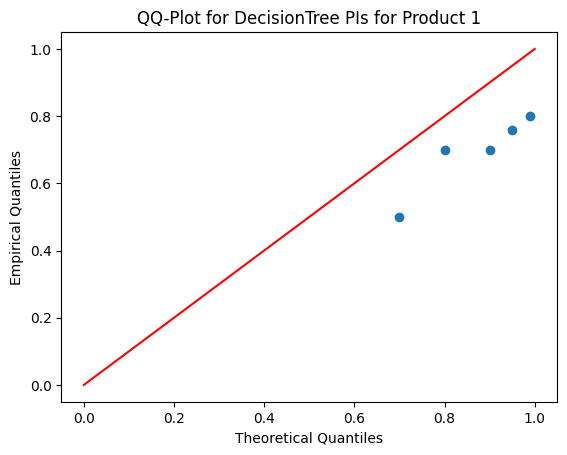

1/1 [==============================] - 0s 13ms/step
Alpha: 0.01, PICP: 80.00%, MPIW: 1.0373
Alpha: 0.05, PICP: 68.00%, MPIW: 0.9144
Alpha: 0.1, PICP: 72.00%, MPIW: 0.8204
Alpha: 0.2, PICP: 64.00%, MPIW: 0.7830
Alpha: 0.3, PICP: 46.00%, MPIW: 0.6226


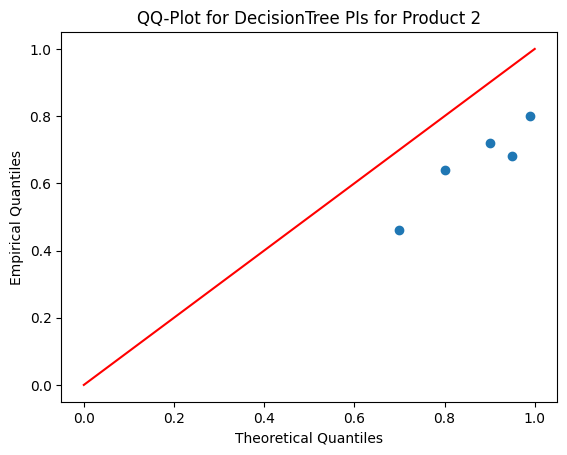

1/1 [==============================] - 0s 15ms/step
Alpha: 0.01, PICP: 72.00%, MPIW: 2.2440
Alpha: 0.05, PICP: 76.00%, MPIW: 2.1259
Alpha: 0.1, PICP: 54.00%, MPIW: 1.7397
Alpha: 0.2, PICP: 50.00%, MPIW: 1.3616
Alpha: 0.3, PICP: 54.00%, MPIW: 1.3362


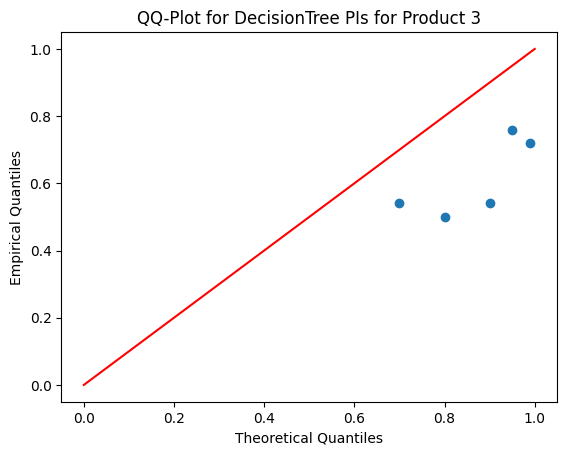

1/1 [==============================] - 0s 13ms/step
Alpha: 0.01, PICP: 86.00%, MPIW: 2.7852
Alpha: 0.05, PICP: 78.00%, MPIW: 2.3931
Alpha: 0.1, PICP: 68.00%, MPIW: 1.9137
Alpha: 0.2, PICP: 66.00%, MPIW: 1.5627
Alpha: 0.3, PICP: 50.00%, MPIW: 1.1196


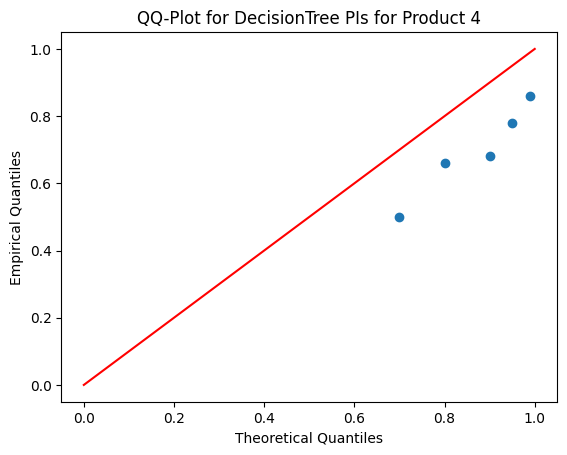

In [89]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import TimeSeriesSplit

def compute_and_plot_RNN(data, tscv, product_name, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]):
    """
    Compute PICP, MPIW, and generate QQ-plots for various alpha levels using a RNN model.
    """
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}

    sequence_length = 10  # or any other suitable length

    X, Y = preprocess_shape_rnn(data, sequence_length)
    
    for train_index, test_index in tscv.split(X):

        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = Y[train_index], Y[test_index]

        model = keras_rnn()
        model.fit(X_train, y_train, epochs=50, verbose=0)

        for alpha in alpha_levels:
            
            x0 = X_test[0]
            lower, pred, upper = prediction_interval_RNN(model, X_train, y_train, x0, alpha=alpha)

            within_interval = np.logical_and(lower <= y_test[0], upper >= y_test[0])
            PICP = np.mean(within_interval)
            MPIW = np.mean(upper - lower)

            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)


    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f}")

    
    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [PICP_values[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for RNN PIs for {product_name}')
    plt.show()

products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]

# Alpha values to evaluate
alphas = [0.01, 0.05, 0.1, 0.2, 0.3]

tscv = TimeSeriesSplit(n_splits=50, test_size=1, max_train_size=100)
for product_data, product_name in products_data:
    product_data = product_data.reshape(-1, 1)
    compute_and_plot_RNN(product_data, tscv, product_name)


# Concrete Dropout Yarin Gal
Code from https://github.com/yaringal/ConcreteDropout/tree/master

In [1]:
import keras.backend as K
from keras import initializers
from keras.layers import Dense, Lambda, Wrapper, InputSpec


class ConcreteDropout(Wrapper):
    """This wrapper allows to learn the dropout probability for any given input Dense layer.
    ```python
        # as the first layer in a model
        model = Sequential()
        model.add(ConcreteDropout(Dense(8), input_shape=(16)))
        # now model.output_shape == (None, 8)
        # subsequent layers: no need for input_shape
        model.add(ConcreteDropout(Dense(32)))
        # now model.output_shape == (None, 32)
    ```
    `ConcreteDropout` can be used with arbitrary layers which have 2D
    kernels, not just `Dense`. However, Conv2D layers require different
    weighing of the regulariser (use SpatialConcreteDropout instead).
    # Arguments
        layer: a layer instance.
        weight_regularizer:
            A positive number which satisfies
                $weight_regularizer = l**2 / (\tau * N)$
            with prior lengthscale l, model precision $\tau$ (inverse observation noise),
            and N the number of instances in the dataset.
            Note that kernel_regularizer is not needed.
        dropout_regularizer:
            A positive number which satisfies
                $dropout_regularizer = 2 / (\tau * N)$
            with model precision $\tau$ (inverse observation noise) and N the number of
            instances in the dataset.
            Note the relation between dropout_regularizer and weight_regularizer:
                $weight_regularizer / dropout_regularizer = l**2 / 2$
            with prior lengthscale l. Note also that the factor of two should be
            ignored for cross-entropy loss, and used only for the eculedian loss.
    """

    def __init__(self, layer, weight_regularizer=1e-6, dropout_regularizer=1e-5,
                 init_min=0.1, init_max=0.1, is_mc_dropout=True, **kwargs):
        assert 'kernel_regularizer' not in kwargs
        super(ConcreteDropout, self).__init__(layer, **kwargs)
        self.weight_regularizer = weight_regularizer
        self.dropout_regularizer = dropout_regularizer
        self.is_mc_dropout = is_mc_dropout
        self.supports_masking = True
        self.p_logit = None
        self.p = None
        self.init_min = np.log(init_min) - np.log(1. - init_min)
        self.init_max = np.log(init_max) - np.log(1. - init_max)

    def build(self, input_shape=None):
        self.input_spec = InputSpec(shape=input_shape)
        if not self.layer.built:
            self.layer.build(input_shape)
            self.layer.built = True
        super(ConcreteDropout, self).build()  # this is very weird.. we must call super before we add new losses

        # initialise p
        self.p_logit = self.layer.add_weight(name='p_logit',
                                            shape=(1,),
                                            initializer=initializers.RandomUniform(self.init_min, self.init_max),
                                            trainable=True)
        self.p = K.sigmoid(self.p_logit[0])

        # initialise regulariser / prior KL term
        assert len(input_shape) == 2, 'this wrapper only supports Dense layers'
        input_dim = np.prod(input_shape[-1])  # we drop only last dim
        weight = self.layer.kernel
        kernel_regularizer = self.weight_regularizer * K.sum(K.square(weight)) / (1. - self.p)
        dropout_regularizer = self.p * K.log(self.p)
        dropout_regularizer += (1. - self.p) * K.log(1. - self.p)
        dropout_regularizer *= self.dropout_regularizer * input_dim
        regularizer = K.sum(kernel_regularizer + dropout_regularizer)
        self.layer.add_loss(regularizer)

    def compute_output_shape(self, input_shape):
        return self.layer.compute_output_shape(input_shape)

    def concrete_dropout(self, x):
        '''
        Concrete dropout - used at training time (gradients can be propagated)
        :param x: input
        :return:  approx. dropped out input
        '''
        eps = K.cast_to_floatx(K.epsilon())
        temp = 0.1

        unif_noise = K.random_uniform(shape=K.shape(x))
        drop_prob = (
            K.log(self.p + eps)
            - K.log(1. - self.p + eps)
            + K.log(unif_noise + eps)
            - K.log(1. - unif_noise + eps)
        )
        drop_prob = K.sigmoid(drop_prob / temp)
        random_tensor = 1. - drop_prob

        retain_prob = 1. - self.p
        x *= random_tensor
        x /= retain_prob
        return x

    def call(self, inputs, training=None):
        if self.is_mc_dropout:
            return self.layer.call(self.concrete_dropout(inputs))
        else:
            def relaxed_dropped_inputs():
                return self.layer.call(self.concrete_dropout(inputs))
            return K.in_train_phase(relaxed_dropped_inputs,
                                    self.layer.call(inputs),
                                    training=training)

(100, 1, 1)
1/1 [==============================] - 0s 17ms/step
Per Point Predictive Probability: -0.5188467101956182
Root Mean Square Error: 0.08606481168581359
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.6218369886040702
Root Mean Square Error: 0.04316041031026874
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.7798097402062623
Root Mean Square Error: 0.40099467936861677
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -1.98419257195757
Root Mean Square Error: 1.167703776159573
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.785668805185479
Root Mean Square Error: 0.22323342967302784
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.6746196423752813
Root Mean Square Error: 0.38028374314308167
(100, 1, 1)
1/1 [================

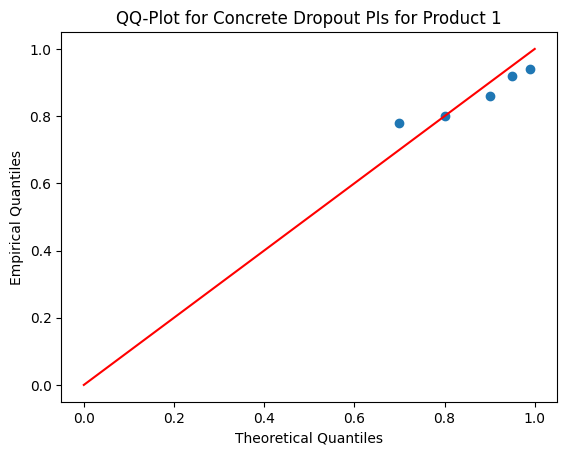

(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.5742280451406345
Root Mean Square Error: 0.42429399220842257
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.5276224077486042
Root Mean Square Error: 0.4088739562466337
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: 0.12625345258136145
Root Mean Square Error: 0.05531984618461916
(100, 1, 1)
1/1 [==============================] - 0s 11ms/step
Per Point Predictive Probability: 0.051628809207020065
Root Mean Square Error: 0.049159321824190805
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.5486618480286016
Root Mean Square Error: 0.4094346795156518
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -1.2511381695199417
Root Mean Square Error: 0.6778633386940189
(100, 1, 1)
1/1 [============

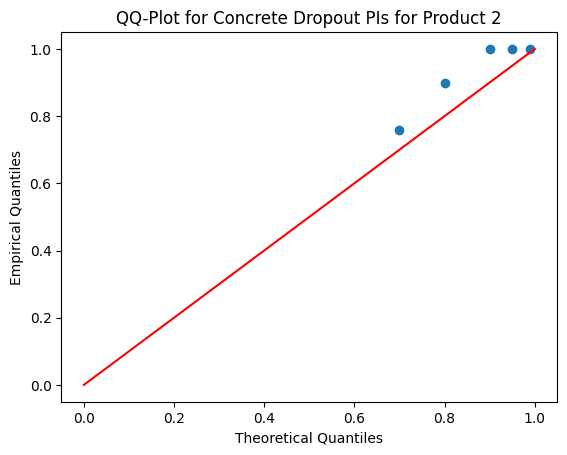

(100, 1, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -0.767183508879016
Root Mean Square Error: 0.3172576676786534
(100, 1, 1)
1/1 [==============================] - 0s 11ms/step
Per Point Predictive Probability: -0.8814723283756956
Root Mean Square Error: 0.5353282552663101
(100, 1, 1)
1/1 [==============================] - 0s 11ms/step
Per Point Predictive Probability: -0.7425101882778562
Root Mean Square Error: 0.1670557448846255
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.7377082317781332
Root Mean Square Error: 0.2198370549661357
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.7604116583403582
Root Mean Square Error: 0.2526968905728486
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.8445562155860915
Root Mean Square Error: 0.28515861575525836
(100, 1, 1)
1/1 [=================

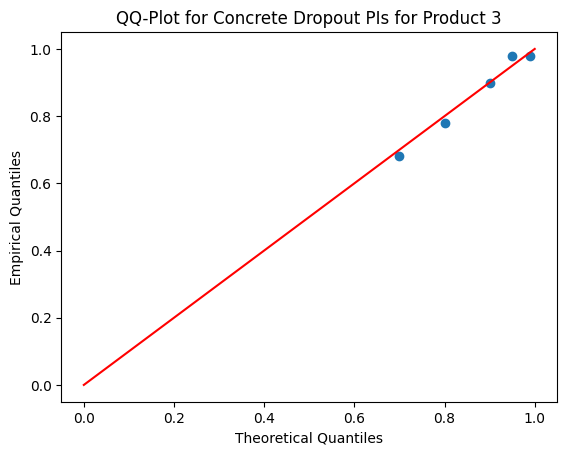

(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.6925777915380373
Root Mean Square Error: 0.14756794911245397
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.7428945232966178
Root Mean Square Error: 0.1564333935845168
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.7218062957404947
Root Mean Square Error: 0.011380010117030714
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -1.3663511382661224
Root Mean Square Error: 0.9433052418087788
(100, 1, 1)
1/1 [==============================] - 0s 11ms/step
Per Point Predictive Probability: -0.5342627399891104
Root Mean Square Error: 0.09894993845640787
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.7997482059948915
Root Mean Square Error: 0.299610141531903
(100, 1, 1)
1/1 [==============

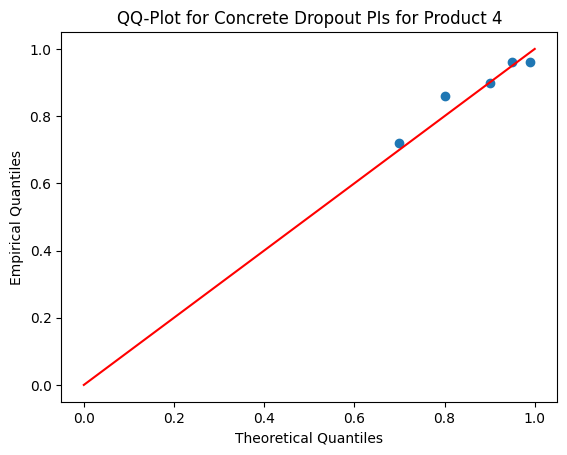

In [7]:
# yarin gal MC dropout
import numpy as np
import keras.backend as K
import numpy as np
import keras
from keras.layers import LSTM, Dense, Dropout
from keras.models import Sequential
from keras.optimizers import Adam
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import TimeSeriesSplit
from keras.layers import LSTM, Dense, Dropout
import scipy
from keras.layers import Input, Dense, Lambda
import keras
from keras.models import Model
from keras import backend as K
from keras.layers import LSTM
from keras.models import Sequential
nb_epoch = 20  # Number of epochs for training
batch_size = 32  # Batch size for training
nb_features = 64  # Number of neurons in the Dense layers
K_test = 50
D=1

from scipy.stats import norm

def compute_prediction_intervals(mean_predictions, std_predictions, confidence=0.95):
    z = norm.ppf(1 - (1 - confidence) / 2)  
    lower = mean_predictions - z * std_predictions
    upper = mean_predictions + z * std_predictions
    return lower, upper

def preprocess_shape_rnn(data, sequence_length):
    X, Y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i+sequence_length])
        Y.append(data[i+sequence_length])
    return np.array(X), np.array(Y)

def fit_model(nb_epoch, X, Y, Q):
    if K.backend() == 'tensorflow':
        K.clear_session()
    N = X.shape[0]
    l = 1e-4
    wd = l**2. / N
    dd = 2. / N
    
    inp = Input(shape=(Q,))
    x = inp
    x = ConcreteDropout(Dense(nb_features, activation='relu'), weight_regularizer=wd, dropout_regularizer=dd)(x)
    x = ConcreteDropout(Dense(nb_features, activation='relu'), weight_regularizer=wd, dropout_regularizer=dd)(x)
    x = ConcreteDropout(Dense(nb_features, activation='relu'), weight_regularizer=wd, dropout_regularizer=dd)(x)
    mean = ConcreteDropout(Dense(D), weight_regularizer=wd, dropout_regularizer=dd)(x)
    log_var = ConcreteDropout(Dense(D), weight_regularizer=wd, dropout_regularizer=dd)(x)
    out = keras.layers.Concatenate( axis=-1)( [mean, log_var])
    model = Model(inp, out)
    
    def heteroscedastic_loss(true, pred):
        mean = pred[:, :D]
        log_var = pred[:, D:]
        precision = K.exp(-log_var)
        return K.sum(precision * (true - mean)**2. + log_var, -1)
    
    model.compile(optimizer='adam', loss=heteroscedastic_loss)
    assert len(model.layers[1].trainable_weights) == 3  # kernel, bias, and dropout prob
    assert len(model.losses) == 5  # a loss for each Concrete Dropout layer
    hist = model.fit(X, Y, epochs=nb_epoch, batch_size=batch_size, verbose=0)
    loss = hist.history['loss'][-1]

    #plt.plot(hist.history['loss'])
    #plt.title(f'loss')
    #plt.ylabel('Loss')
    #plt.xlabel('Epoch')
    #plt.show()

    return model, -0.5 * loss  # return ELBO up to const.

def logsumexp(a):
    a_max = a.max(axis=0)
    return np.log(np.sum(np.exp(a - a_max), axis=0)) + a_max

def test(Y_true, MC_samples):
    """
    Estimate predictive log likelihood:
    log p(y|x, D) = log int p(y|x, w) p(w|D) dw
                 ~= log int p(y|x, w) q(w) dw
                 ~= log 1/K sum p(y|x, w_k) with w_k sim q(w)
                  = LogSumExp log p(y|x, w_k) - log K
    :Y_true: a 2D array of size N x dim
    :MC_samples: a 3D array of size samples K x N x 2*D
    """
    assert len(MC_samples.shape) == 3
    assert len(Y_true.shape) == 2
    k = MC_samples.shape[0]
    N = Y_true.shape[0]
    mean = MC_samples[:, :, :D]  # K x N x D
    logvar = MC_samples[:, :, D:]
    test_ll = -0.5 * np.exp(-logvar) * (mean - Y_true[None])**2. - 0.5 * logvar - 0.5 * np.log(2 * np.pi)
    test_ll = np.sum(np.sum(test_ll, -1), -1)
    test_ll = logsumexp(test_ll) - np.log(k)
    pppp = test_ll / N  # per point predictive probability
    rmse = np.mean((np.mean(mean, 0) - Y_true)**2.)**0.5
    return pppp, rmse

def compute_and_plot_MC_dropout(data, tscv, product_name, sequence_length=10, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]):
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    empirical_quantiles = {}
    normalization_factor = np.max(data) - np.min(data)
    MPIW_dict = {alpha: [] for alpha in alpha_levels}
    NMPIW_dict = {alpha: [] for alpha in alpha_levels}

    X, Y = preprocess_shape_rnn(data, sequence_length)
    for train_index, test_index in tscv.split(X):

        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = Y[train_index], Y[test_index]
        print(X_train.shape)
       
        Q = 1 # Number of features

        model, elbo = fit_model(nb_epoch, X_train, y_train, Q)
        MC_samples = np.array([model.predict(X_test) for _ in range(K_test)])

        # test function to compute the PPPP and RMSE
        pppp, rmse = test(y_test, MC_samples)
        means = MC_samples[:, :, :D]  # K x N
        epistemic_uncertainty = np.var(means, 0).mean(0)
        logvar = np.mean(MC_samples[:, :, D:], 0)
        aleatoric_uncertainty = np.exp(logvar).mean(0)
        print("Per Point Predictive Probability:", pppp)
        print("Root Mean Square Error:", rmse)

        mean_predictions = means.mean(axis=0)  # Monte Carlo means
        epistemic_uncertainty = np.var(means, axis=0)  # Variance of the means across MC samples
        aleatoric_uncertainty = np.exp(logvar).mean(axis=0)  # Mean of the exponentiated log variances

        total_uncertainty = epistemic_uncertainty + aleatoric_uncertainty 
        std_predictions = np.sqrt(total_uncertainty) 

        for alpha in alpha_levels:
            
            lower, upper = compute_prediction_intervals(mean_predictions, std_predictions, confidence=1-alpha)

            within_interval = np.logical_and(lower.squeeze() <= y_test, upper.squeeze() >= y_test)
            PICP = np.mean(within_interval)
            MPIW = np.mean(upper - lower)
            if alpha not in empirical_quantiles:
                empirical_quantiles[alpha] = []
            empirical_quantiles[alpha].append(within_interval)

            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)
            NMPIW_dict[alpha].append(np.mean(upper - lower)/normalization_factor)

  
    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}
    NMPIW_values = {alpha: np.mean(values) for alpha, values in NMPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f},  NMPIW: {NMPIW_values[alpha]:.4f}")
 
    empirical_quantiles = {alpha: np.mean(values) for alpha, values in empirical_quantiles.items()}

    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [empirical_quantiles[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for Concrete Dropout PIs for {product_name}')
    plt.show()

tscv = TimeSeriesSplit(n_splits=50, test_size=1, max_train_size=100)
alpha_levels=[0.05, 0.10, 0.20, 0.30]
products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]
sequence_length =1
alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]

for data, product_name in products_data:
    data = data.reshape(-1, 1)
    compute_and_plot_MC_dropout(data, tscv, product_name, sequence_length=sequence_length,alpha_levels=alpha_levels)


(84, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.19861580426446945
Root Mean Square Error: 0.26008986775190024
(89, 1, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -0.21425866152990106
Root Mean Square Error: 0.2504284890223221
(94, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.3061175702091887
Root Mean Square Error: 0.33857394430535137
(99, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.047395001884985445
Root Mean Square Error: 0.18923574236715143
(100, 1, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -0.3022076078353499
Root Mean Square Error: 0.3063018591276733
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.5228232342176342
Root Mean Square Error: 0.40133853908199424
(100, 1, 1)
1/1 [=============

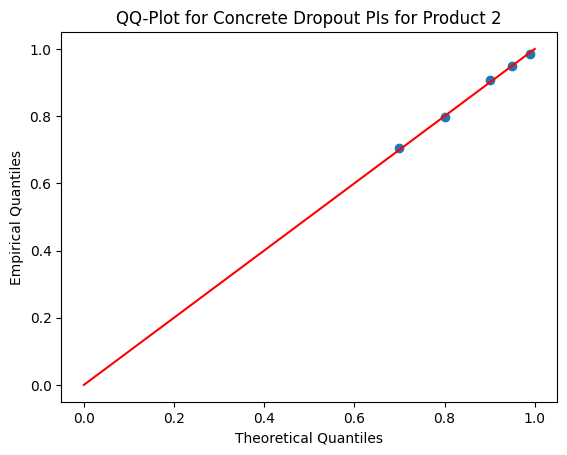

(84, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -1.3684281755626002
Root Mean Square Error: 0.9732470530245966
(89, 1, 1)
1/1 [==============================] - 0s 11ms/step
Per Point Predictive Probability: -1.4420422496588283
Root Mean Square Error: 0.9228480104704562
(94, 1, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -1.555373018872103
Root Mean Square Error: 1.0641752198697054
(99, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -1.0988030468400005
Root Mean Square Error: 0.6830397575852943
(100, 1, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -1.017376540775336
Root Mean Square Error: 0.6551920844327448
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -1.313699482395105
Root Mean Square Error: 0.8518462588290906
(100, 1, 1)
1/1 [========================

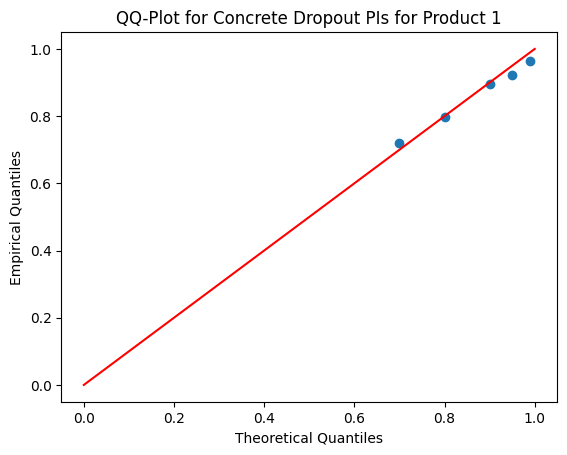

(84, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.9818874076801928
Root Mean Square Error: 0.4973933026257089
(89, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.9821781859003684
Root Mean Square Error: 0.5306295724195627
(94, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.9945350740314762
Root Mean Square Error: 0.5591801658389711
(99, 1, 1)
1/1 [==============================] - 0s 11ms/step
Per Point Predictive Probability: -1.5814549804334144
Root Mean Square Error: 1.110868995852082
(100, 1, 1)
1/1 [==============================] - 0s 11ms/step
Per Point Predictive Probability: -1.1176946406520198
Root Mean Square Error: 0.70535751863847
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -1.0103020550849677
Root Mean Square Error: 0.5894510450723317
(100, 1, 1)
1/1 [========================

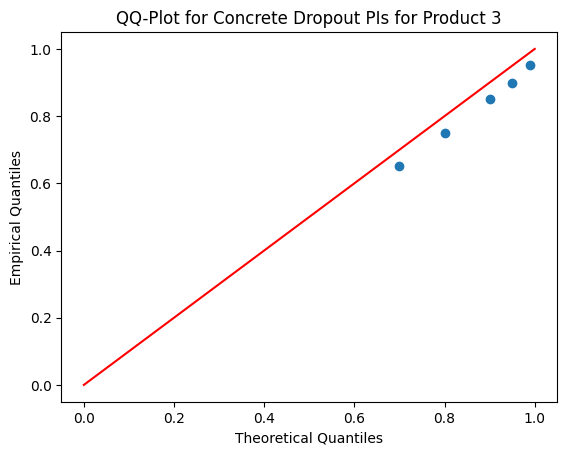

(84, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -1.0208643844946756
Root Mean Square Error: 0.4336228609683036
(89, 1, 1)
1/1 [==============================] - 0s 11ms/step
Per Point Predictive Probability: -0.9380518810249676
Root Mean Square Error: 0.21697084186326585
(94, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -1.0300986663752485
Root Mean Square Error: 0.46875593800532145
(99, 1, 1)
1/1 [==============================] - 0s 11ms/step
Per Point Predictive Probability: -0.9815166048127966
Root Mean Square Error: 0.3479593478128983
(100, 1, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -1.3702396857141124
Root Mean Square Error: 0.8890767331144986
(100, 1, 1)
1/1 [==============================] - 0s 14ms/step
Per Point Predictive Probability: -1.1612802029365377
Root Mean Square Error: 0.6084195037915691
(100, 1, 1)
1/1 [===================

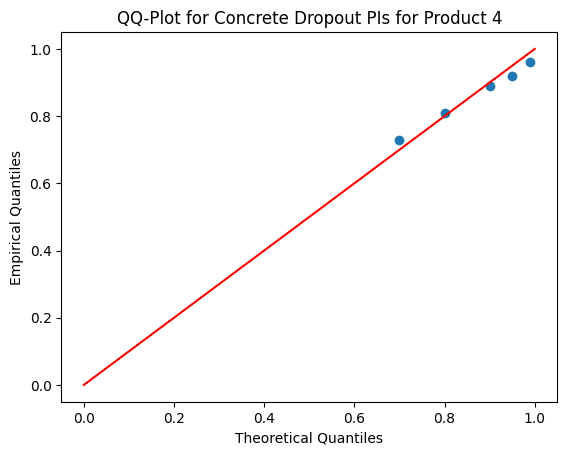

In [8]:
# yarin gal MC dropout
# multi step

tscv = TimeSeriesSplit(n_splits=30, test_size=5, max_train_size=100)
alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]
products_data = [
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]
sequence_length =1
for data, product_name in products_data:
    data = data.reshape(-1, 1)
    compute_and_plot_MC_dropout(data, tscv, product_name, sequence_length,alpha_levels)


In [7]:
# approach to implement rnn with cd
import keras.backend as K
import numpy as np
from keras import initializers
from keras.layers import Wrapper, InputSpec, RNN, LSTM

class RNNConcreteDropout(Wrapper):
    def __init__(self, layer, weight_regularizer=1e-6, dropout_regularizer=1e-5, 
                 init_min=0.1, init_max=0.1, is_mc_dropout=True, **kwargs):
        if not isinstance(layer, RNN):
            raise ValueError('Only RNNs')
        super(RNNConcreteDropout, self).__init__(layer, **kwargs)
        self.weight_regularizer = weight_regularizer
        self.dropout_regularizer = dropout_regularizer
        self.is_mc_dropout = is_mc_dropout
        self.p_logit = None
        self.p = None
        self.init_min = np.log(init_min) - np.log(1. - init_min)
        self.init_max = np.log(init_max) - np.log(1. - init_max)

    def build(self, input_shape):
        if not self.layer.built:
            self.layer.build(input_shape)
            self.layer.built = True
        super(RNNConcreteDropout, self).build(input_shape)

        self.p_logit = self.layer.add_weight(name='p_logit', shape=(1,),
                                             initializer=initializers.RandomUniform(self.init_min, self.init_max),
                                             trainable=True)
        self.p = K.sigmoid(self.p_logit[0])
        
        input_dim = np.prod(input_shape[-1])
        weight = self.layer.cell.kernel
        recurrent_weight = self.layer.cell.recurrent_kernel
        kernel_regularizer = self.weight_regularizer * (K.sum(K.square(weight)) + K.sum(K.square(recurrent_weight))) / (1. - self.p)

        dropout_regularizer = self.p * K.log(self.p)
        dropout_regularizer += (1. - self.p) * K.log(1. - self.p)
        dropout_regularizer *= self.dropout_regularizer * input_dim

        regularizer = K.sum(kernel_regularizer + dropout_regularizer)
        self.layer.add_loss(regularizer)

    def concrete_dropout(self, x):
        eps = K.cast_to_floatx(K.epsilon())
        temp = 0.1

        unif_noise = K.random_uniform(shape=K.shape(x))
        drop_prob = (
            K.log(self.p + eps)
            - K.log(1. - self.p + eps)
            + K.log(unif_noise + eps)
            - K.log(1. - unif_noise + eps)
        )
        drop_prob = K.sigmoid(drop_prob / temp)
        random_tensor = 1. - drop_prob

        retain_prob = 1. - self.p
        x *= random_tensor
        x /= retain_prob
        return x

    def call(self, inputs, training=None):
        if self.is_mc_dropout:
            def relaxed_dropped_inputs():
                return self.layer.call(self.concrete_dropout(inputs))

            return K.in_train_phase(relaxed_dropped_inputs, self.layer.call(inputs), training=training)
        else:
            return self.layer.call(inputs)

    def compute_output_shape(self, input_shape):
        return self.layer.compute_output_shape(input_shape)
from keras.models import Sequential
from keras.layers import Dense, LSTM
import keras

def keras_rnn_cd():
    model = Sequential(name='RNN')
    wrapped_lstm = RNNConcreteDropout(LSTM(25, activation='tanh'), 
                                      weight_regularizer=1e-6, 
                                      dropout_regularizer=1e-5,
                                      init_min=0.1, 
                                      init_max=0.1, 
                                      is_mc_dropout=True)

    model.add(wrapped_lstm)
    model.add(Dense(1, activation='relu'))

    opt = keras.optimizers.legacy.Adam(0.0005)
    model.compile(loss='mean_squared_error', optimizer=opt)

    return model


(50, 10, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -1.2718264858265347
Root Mean Square Error: 0.8396302419210946
(50, 10, 1)
1/1 [==============================] - 0s 11ms/step
Per Point Predictive Probability: -1.5383359014893176
Root Mean Square Error: 1.0271789657859036
(50, 10, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -1.5076706433226348
Root Mean Square Error: 0.9983342280092645
(50, 10, 1)
1/1 [==============================] - 0s 11ms/step
Per Point Predictive Probability: -1.1800642809775481
Root Mean Square Error: 0.7894494388365606
(50, 10, 1)
1/1 [==============================] - 0s 11ms/step
Per Point Predictive Probability: -0.9831271700568698
Root Mean Square Error: 0.6157151234324673
(50, 10, 1)
1/1 [==============================] - 0s 16ms/step
Per Point Predictive Probability: -1.1365122036316542
Root Mean Square Error: 0.7570363761539113
(50, 10, 1)
1/1 [=================

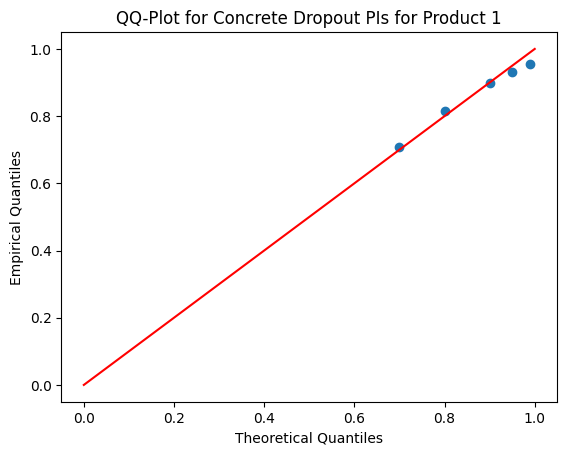

(50, 10, 1)
1/1 [==============================] - 0s 19ms/step
Per Point Predictive Probability: -0.48945337526794475
Root Mean Square Error: 0.40084412113854934
(50, 10, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.10006074355156924
Root Mean Square Error: 0.2382071240961783
(50, 10, 1)
1/1 [==============================] - 0s 15ms/step
Per Point Predictive Probability: -0.5609192625084627
Root Mean Square Error: 0.41150800907031415
(50, 10, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.15622346096850084
Root Mean Square Error: 0.2579918915598099
(50, 10, 1)
1/1 [==============================] - 0s 14ms/step
Per Point Predictive Probability: -0.6477300305187772
Root Mean Square Error: 0.44539440222409576
(50, 10, 1)
1/1 [==============================] - 0s 14ms/step
Per Point Predictive Probability: -0.34050130926036093
Root Mean Square Error: 0.3379936192739328
(50, 10, 1)
1/1 [==========

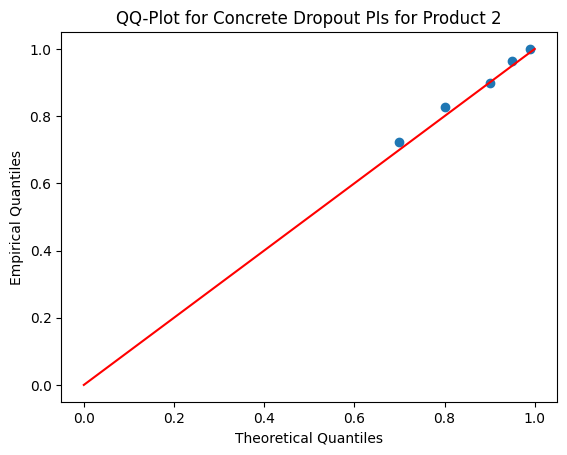

(50, 10, 1)
1/1 [==============================] - 0s 11ms/step
Per Point Predictive Probability: -0.8943653523662226
Root Mean Square Error: 0.4947153712562076
(50, 10, 1)
1/1 [==============================] - 0s 11ms/step
Per Point Predictive Probability: -0.873310010206953
Root Mean Square Error: 0.4746946214378356
(50, 10, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.9032235314323959
Root Mean Square Error: 0.542387766259376
(50, 10, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -1.5735907503978221
Root Mean Square Error: 1.0454367476515196
(50, 10, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -1.0751240360107712
Root Mean Square Error: 0.6896612327993468
(50, 10, 1)
1/1 [==============================] - 0s 14ms/step
Per Point Predictive Probability: -1.0500315383975187
Root Mean Square Error: 0.6675403482942593
(50, 10, 1)
1/1 [===================

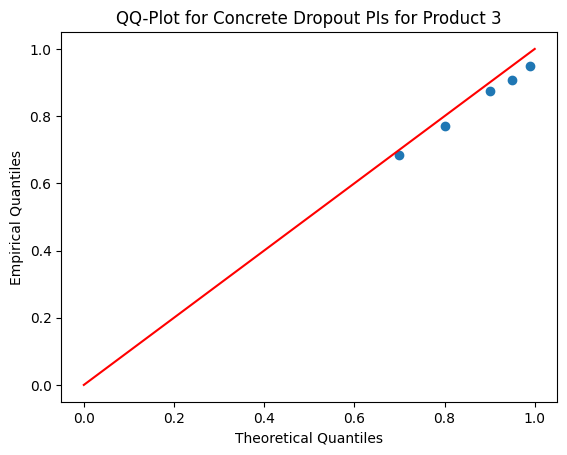

(50, 10, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -0.9656455524358922
Root Mean Square Error: 0.382067871912809
(50, 10, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -0.8865043861142894
Root Mean Square Error: 0.18944545573225408
(50, 10, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.9875108199811387
Root Mean Square Error: 0.5405989454620296
(50, 10, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -1.0240565189675113
Root Mean Square Error: 0.48268013390791675
(50, 10, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -1.5850171056950118
Root Mean Square Error: 1.215407257763309
(50, 10, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -1.3929692060347372
Root Mean Square Error: 0.8167352445480183
(50, 10, 1)
1/1 [=================

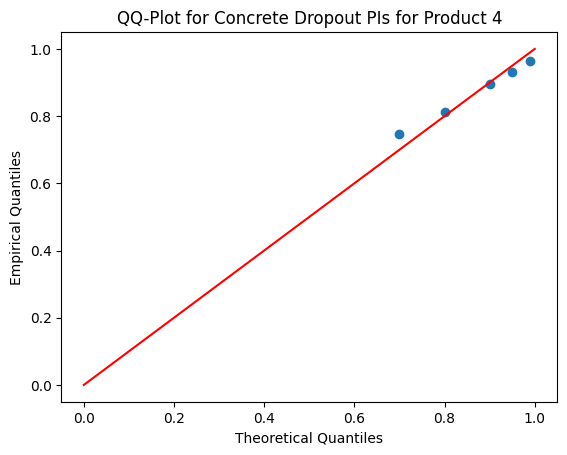

In [8]:
# yarin gal MC dropout - attempt with RNN
import numpy as np
import keras.backend as K
import numpy as np
import keras
from keras.layers import LSTM, Dense, Dropout
from keras.models import Sequential
from keras.optimizers import Adam
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import TimeSeriesSplit
from keras.layers import LSTM, Dense, Dropout
import scipy
from keras.layers import Input, Dense, Lambda
import keras
from keras.models import Model
from keras import backend as K
from keras.layers import LSTM
from keras.models import Sequential
nb_epoch = 20  # Number of epochs for training
batch_size = 32  # Batch size for training
nb_features = 64  # Number of neurons in the Dense layers
K_test = 50
D=1

from scipy.stats import norm

def compute_prediction_intervals(mean_predictions, std_predictions, confidence=0.95):
    z = norm.ppf(1 - (1 - confidence) / 2)  
    lower = mean_predictions - z * std_predictions
    upper = mean_predictions + z * std_predictions
    return lower, upper

def preprocess_shape_rnn(data, sequence_length):
    X, Y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i+sequence_length])
        Y.append(data[i+sequence_length])
    return np.array(X), np.array(Y)

def fit_model(nb_epoch, X, Y, Q):
    if K.backend() == 'tensorflow':
        K.clear_session()
    N = X.shape[0]
    l = 1e-4
    wd = l**2. / N
    dd = 2. / N
    
    inp = Input(shape=(sequence_length, 1))  # Adjust the input shape for LSTM
    x = inp
    # Replace Dense layers with LSTM layers
    x = RNNConcreteDropout(LSTM(nb_features, activation='tanh', return_sequences=True),
                           weight_regularizer=wd, dropout_regularizer=dd)(x)
    x = RNNConcreteDropout(LSTM(nb_features, activation='tanh'),
                           weight_regularizer=wd, dropout_regularizer=dd)(x)
    mean = ConcreteDropout(Dense(D), weight_regularizer=wd, dropout_regularizer=dd)(x)
    log_var = ConcreteDropout(Dense(D), weight_regularizer=wd, dropout_regularizer=dd)(x)
    out = keras.layers.Concatenate(axis=-1)([mean, log_var])
    model = Model(inp, out)
    
    def heteroscedastic_loss(true, pred):
        mean = pred[:, :D]
        log_var = pred[:, D:]
        precision = K.exp(-log_var)
        return K.sum(precision * (true - mean)**2. + log_var, -1)
    
    model.compile(optimizer='adam', loss=heteroscedastic_loss)
    #assert len(model.layers[1].trainable_weights) == 3  # kernel, bias, and dropout prob
    #assert len(model.losses) == 5  # a loss for each Concrete Dropout layer
    hist = model.fit(X, Y, epochs=nb_epoch, batch_size=batch_size, verbose=0)
    loss = hist.history['loss'][-1]

    #plt.plot(hist.history['loss'])
    #plt.title(f'loss')
    #plt.ylabel('Loss')
    #plt.xlabel('Epoch')
    #plt.show()


    return model, -0.5 * loss  # return ELBO up to const.

def logsumexp(a):
    a_max = a.max(axis=0)
    return np.log(np.sum(np.exp(a - a_max), axis=0)) + a_max

def test(Y_true, MC_samples):
    """
    Estimate predictive log likelihood:
    log p(y|x, D) = log int p(y|x, w) p(w|D) dw
                 ~= log int p(y|x, w) q(w) dw
                 ~= log 1/K sum p(y|x, w_k) with w_k sim q(w)
                  = LogSumExp log p(y|x, w_k) - log K
    :Y_true: a 2D array of size N x dim
    :MC_samples: a 3D array of size samples K x N x 2*D
    """
    assert len(MC_samples.shape) == 3
    assert len(Y_true.shape) == 2
    k = MC_samples.shape[0]
    N = Y_true.shape[0]
    mean = MC_samples[:, :, :D]  # K x N x D
    logvar = MC_samples[:, :, D:]
    test_ll = -0.5 * np.exp(-logvar) * (mean - Y_true[None])**2. - 0.5 * logvar - 0.5 * np.log(2 * np.pi)
    test_ll = np.sum(np.sum(test_ll, -1), -1)
    test_ll = logsumexp(test_ll) - np.log(k)
    pppp = test_ll / N  # per point predictive probability
    rmse = np.mean((np.mean(mean, 0) - Y_true)**2.)**0.5
    return pppp, rmse

def compute_and_plot_MC_dropout_RNN(data, tscv, product_name, sequence_length=10, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]):
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    empirical_quantiles = {}
    normalization_factor = np.max(data) - np.min(data)
    MPIW_dict = {alpha: [] for alpha in alpha_levels}
    NMPIW_dict = {alpha: [] for alpha in alpha_levels}

    X, Y = preprocess_shape_rnn(data, sequence_length)
    for train_index, test_index in tscv.split(X):

        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = Y[train_index], Y[test_index]
        print(X_train.shape)
       
        Q = 1 # Number of features

        model, elbo = fit_model(nb_epoch, X_train, y_train, Q)
        
        MC_samples = np.array([model.predict(X_test) for _ in range(K_test)])

        # test function to compute the PPPP and RMSE
        pppp, rmse = test(y_test, MC_samples)
        means = MC_samples[:, :, :D]  # K x N
        epistemic_uncertainty = np.var(means, 0).mean(0)
        logvar = np.mean(MC_samples[:, :, D:], 0)
        aleatoric_uncertainty = np.exp(logvar).mean(0)
        #print("Per Point Predictive Probability:", pppp)
        #print("Root Mean Square Error:", rmse)

        mean_predictions = means.mean(axis=0)  # Monte Carlo means
        epistemic_uncertainty = np.var(means, axis=0)  # Variance of the means across MC samples
        aleatoric_uncertainty = np.exp(logvar).mean(axis=0)  # Mean of the exponentiated log variances

        total_uncertainty = epistemic_uncertainty + aleatoric_uncertainty 
        std_predictions = np.sqrt(total_uncertainty) 

        for alpha in alpha_levels:
            
            lower, upper = compute_prediction_intervals(mean_predictions, std_predictions, confidence=1-alpha)

            within_interval = np.logical_and(lower.squeeze() <= y_test, upper.squeeze() >= y_test)
            PICP = np.mean(within_interval)
            MPIW = np.mean(upper - lower)
            if alpha not in empirical_quantiles:
                empirical_quantiles[alpha] = []
            empirical_quantiles[alpha].append(within_interval)

            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)
            NMPIW_dict[alpha].append(np.mean(upper - lower)/normalization_factor)

  
    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}
    NMPIW_values = {alpha: np.mean(values) for alpha, values in NMPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f},  NMPIW: {NMPIW_values[alpha]:.4f}")
    
    empirical_quantiles = {alpha: np.mean(values) for alpha, values in empirical_quantiles.items()}

    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [empirical_quantiles[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for Concrete Dropout PIs for {product_name}')
    plt.show()

tscv = TimeSeriesSplit(n_splits=30, test_size=5, max_train_size=100)
products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]
sequence_length =10
alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]

for data, product_name in products_data:
    data = data.reshape(-1, 1)
    compute_and_plot_MC_dropout_RNN(data, tscv, product_name, sequence_length=sequence_length,alpha_levels=alpha_levels)


(100, 10, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -0.8542095392067321
Root Mean Square Error: 0.5188591765397348
(100, 10, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.017198968151658445
Root Mean Square Error: 0.08484048490470997
(100, 10, 1)
1/1 [==============================] - 0s 15ms/step
Per Point Predictive Probability: 0.11206892259603984
Root Mean Square Error: 0.06227649880602204
(100, 10, 1)
1/1 [==============================] - 0s 15ms/step
Per Point Predictive Probability: -0.027495566397325977
Root Mean Square Error: 0.1494855472836436
(100, 10, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -0.08679350718097734
Root Mean Square Error: 0.0932368171730511
(100, 10, 1)
1/1 [==============================] - 0s 15ms/step
Per Point Predictive Probability: -0.12246218555006605
Root Mean Square Error: 0.2617672409631151
(100, 10, 1)
1/1 [==

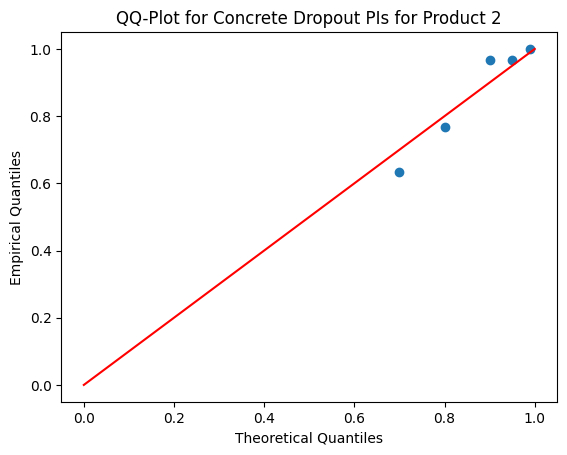

(100, 10, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -5.498734142787017
Root Mean Square Error: 1.7506501716933647
(100, 10, 1)
1/1 [==============================] - 0s 12ms/step
Per Point Predictive Probability: -0.6938554007535176
Root Mean Square Error: 0.3924437371471501
(100, 10, 1)
1/1 [==============================] - 0s 15ms/step
Per Point Predictive Probability: -0.42494742416878184
Root Mean Square Error: 0.2106678223255627
(100, 10, 1)
1/1 [==============================] - 0s 11ms/step
Per Point Predictive Probability: -2.592724029146885
Root Mean Square Error: 1.306273936137437
(100, 10, 1)
1/1 [==============================] - 0s 14ms/step
Per Point Predictive Probability: -0.5245593820356671
Root Mean Square Error: 0.33462369208795817
(100, 10, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -1.2465287592240393
Root Mean Square Error: 0.7478087230419672
(100, 10, 1)
1/1 [===========

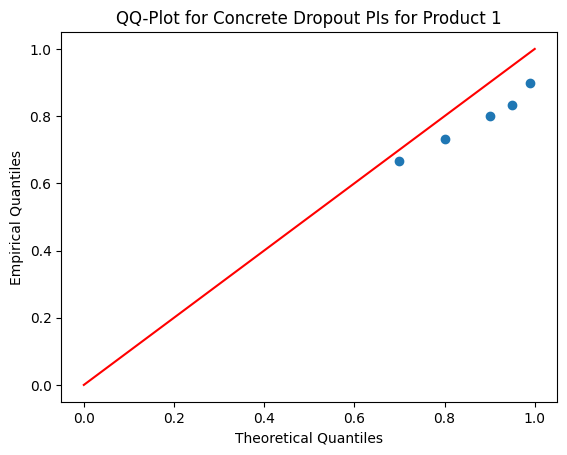

(100, 10, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -2.02421690688849
Root Mean Square Error: 1.2149264625004301
(100, 10, 1)
1/1 [==============================] - 0s 11ms/step
Per Point Predictive Probability: -1.369496178873725
Root Mean Square Error: 0.9172570281564925
(100, 10, 1)
1/1 [==============================] - 0s 15ms/step
Per Point Predictive Probability: -0.5783016646141683
Root Mean Square Error: 0.181094153904775
(100, 10, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -1.8139072739687019
Root Mean Square Error: 1.2231525747776266
(100, 10, 1)
1/1 [==============================] - 0s 15ms/step
Per Point Predictive Probability: -0.778037448949878
Root Mean Square Error: 0.22411122713390297
(100, 10, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -1.0809038578644374
Root Mean Square Error: 0.7108423915774607
(100, 10, 1)
1/1 [==============

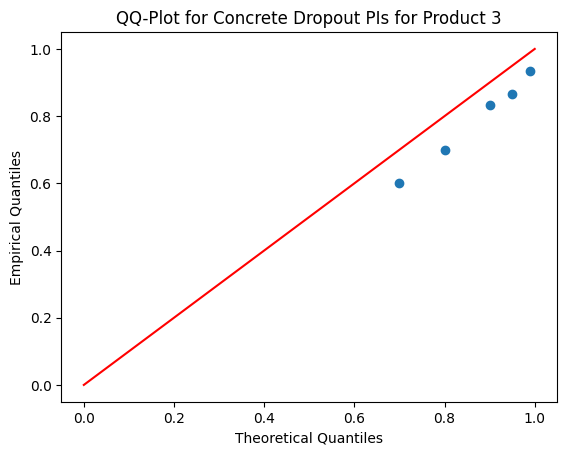

(100, 10, 1)
1/1 [==============================] - 0s 13ms/step
Per Point Predictive Probability: -0.7946790095646494
Root Mean Square Error: 0.2797509210339113
(100, 10, 1)
1/1 [==============================] - 0s 17ms/step
Per Point Predictive Probability: -0.9244893958013276
Root Mean Square Error: 0.5496293636009879
(100, 10, 1)
1/1 [==============================] - 0s 14ms/step
Per Point Predictive Probability: -1.1990128288361799
Root Mean Square Error: 0.7959933136294226
(100, 10, 1)
1/1 [==============================] - 0s 14ms/step
Per Point Predictive Probability: -1.0298063599378486
Root Mean Square Error: 0.6708422816110251
(100, 10, 1)
1/1 [==============================] - 0s 15ms/step
Per Point Predictive Probability: -1.556910293311765
Root Mean Square Error: 1.055020997666603
(100, 10, 1)
1/1 [==============================] - 0s 14ms/step
Per Point Predictive Probability: -6.683286789309918
Root Mean Square Error: 2.506320176621086
(100, 10, 1)
1/1 [==============

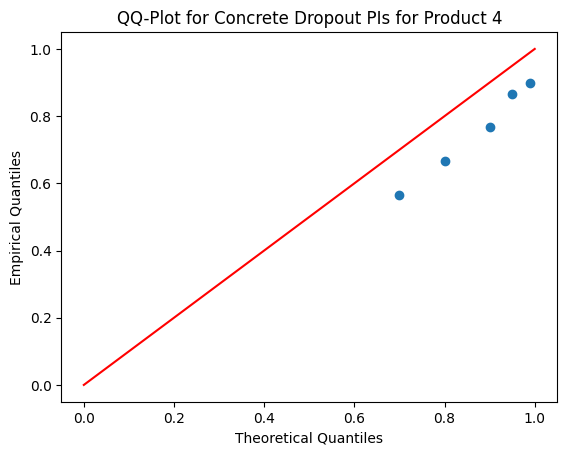

In [9]:
tscv = TimeSeriesSplit(n_splits=30, test_size=1, max_train_size=100)
alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]
products_data = [
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]
sequence_length =10
for data, product_name in products_data:
    data = data.reshape(-1, 1)
    compute_and_plot_MC_dropout_RNN(data, tscv, product_name, sequence_length,alpha_levels)

# RNN with Jackknife+ after Bootstrap PI construction

Epoch 1, Loss: 0.15589143335819244
Epoch 11, Loss: 0.14720812439918518
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 0.20785167813301086
1/1 [==============================] - 0s 11ms/step
Epoch 1, Loss: 0.10677998512983322
Epoch 11, Loss: 0.10585315525531769
Epoch 21, Loss: 0.10533308237791061
Epoch 31, Loss: 0.10483640432357788
Epoch 41, Loss: 0.10437187552452087
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 0.11859899759292603
Epoch 11, Loss: 0.11438906937837601
Epoch 21, Loss: 0.11165394634008408
Epoch 31, Loss: 0.10918494313955307
Epoch 41, Loss: 0.10690928250551224
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 0.133737251162529
Epoch 11, Loss: 0.13174079358577728
1/1 [==============================] - 0s 12ms/step
Epoch 1, Loss: 0.18105454742908478
1/1 [==============================] - 0s 11ms/step
Epoch 1, Loss: 0.1290457844734192
Epoch 11, Loss: 0.1245800033211708
Epoch 21, Loss: 0.12275148183107376
Epoch 31, Loss: 0.

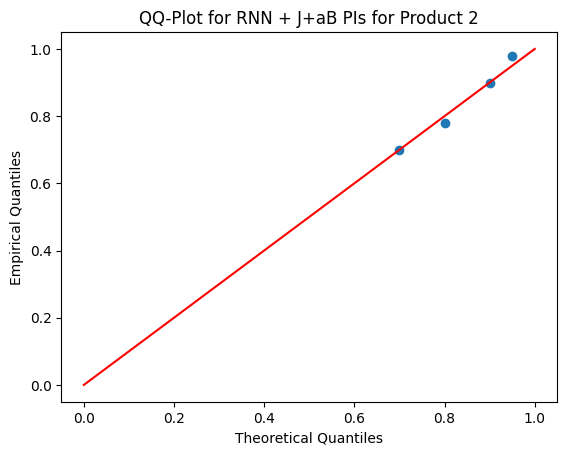

Epoch 1, Loss: 1.1715874671936035
Epoch 11, Loss: 1.1254494190216064
Epoch 21, Loss: 1.091680645942688
Epoch 31, Loss: 1.0596011877059937
Epoch 41, Loss: 1.0272501707077026
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 1.0529135465621948
Epoch 11, Loss: 1.0183367729187012
Epoch 21, Loss: 0.9973399639129639
Epoch 31, Loss: 0.9774687886238098
Epoch 41, Loss: 0.9581245183944702
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 1.3053227663040161
Epoch 11, Loss: 1.2596991062164307
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 0.7934106588363647
Epoch 11, Loss: 0.7670841217041016
Epoch 21, Loss: 0.7497782111167908
Epoch 31, Loss: 0.7342824339866638
Epoch 41, Loss: 0.7196325659751892
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 0.8820257782936096
Epoch 11, Loss: 0.8583783507347107
1/1 [==============================] - 0s 8ms/step
Epoch 1, Loss: 0.8310195207595825
Epoch 11, Loss: 0.7980735301971436
Epoch 21, Loss: 0

: 

: 

In [21]:
# for low alpha values this is better done with a good cpu e.g google collab
import numpy as np
import keras.backend as K
import numpy as np
import keras
from keras.layers import LSTM, Dense, Dropout
from keras.models import Sequential
from keras.optimizers import Adam
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import TimeSeriesSplit

def keras_rnn():
    model = Sequential(name='RNN')
    # For fast cuDNN implementation, activation = 'relu' does not work
    model.add(LSTM(25, activation='tanh'))
    #model.add(LSTM(100, activation='tanh'))
    model.add(Dense(1, activation='relu'))
    # Compile model
    opt = keras.optimizers.legacy.Adam(0.0005)#0.0005
    model.compile(loss='mean_squared_error', optimizer=opt)
    return model

def preprocess_shape_rnn(data, sequence_length):
    X, Y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i+sequence_length])
        Y.append(data[i+sequence_length])
    return np.array(X), np.array(Y)



def generate_bootstrap_samples(n, m, B):
    """
    Generate B bootstrap samples of size m from an original dataset of size n.
    """
    return [np.random.choice(np.arange(n), size=m, replace=True) for _ in range(B)]
def fit_bootstrap_models(X_train, Y_train, X_predict, sequence_length, B):
    n = len(X_train)
    boot_samples_idx = generate_bootstrap_samples(n, n, B)
    
    predictions_train = np.zeros((B, n), dtype=float)
    n_predict = len(X_predict)
    predictions_test = np.zeros((B, n_predict), dtype=float)
    
    for b in range(B):
        model = keras_rnn()
        callback = keras.callbacks.EarlyStopping(monitor='loss', patience=5)
        history=model.fit(X_train[boot_samples_idx[b]], Y_train[boot_samples_idx[b]], epochs=50, batch_size=50, callbacks=[callback], verbose=0)
        
        training_loss = history.history['loss']

        #for i, loss_value in enumerate(training_loss):
        #    if i % 10 == 0:  
        #        print(f'Epoch {i+1}, Loss: {loss_value}')

        predictions_train[b] = model.predict(X_train).flatten()
        predictions_test[b] = model.predict(X_predict).flatten()
    
    return boot_samples_idx, predictions_train, predictions_test

def compute_PIs_JaB(X_train, Y_train, X_predict, alpha, B, sequence_length):
    n = len(X_train)
    boot_samples_idx, boot_predictions_train, boot_predictions_test = fit_bootstrap_models(X_train, Y_train, X_predict, sequence_length, B)
    
    in_boot_sample = np.zeros((B, n), dtype=bool)
    for b in range(len(in_boot_sample)):
        in_boot_sample[b, boot_samples_idx[b]] = True
    
    resids_LOO = np.zeros(n)
    muh_LOO_vals_testpoint = np.zeros((n, len(X_predict)))
    for i in range(n):
        b_keep = np.argwhere(~(in_boot_sample[:, i])).reshape(-1)
        if len(b_keep) > 0:
            resids_LOO[i] = np.abs(Y_train[i] - boot_predictions_train[b_keep, i].mean())
            muh_LOO_vals_testpoint[i] = boot_predictions_test[b_keep].mean(0)
        else:
            resids_LOO[i] = np.abs(Y_train[i])
            muh_LOO_vals_testpoint[i] = np.zeros(len(X_predict))
    
    #ind_q = (np.ceil((1-alpha)*(n+1))).astype(int)

    # new test for alpha=0.01 - important for alpha = 0.01
    ind_q = (np.ceil((1-alpha)*(n+1))).astype(int)
    ind_q = min(ind_q, n)
    # end of test

    lower_bound = np.sort(muh_LOO_vals_testpoint.T - resids_LOO, axis=1).T[-ind_q]
    upper_bound = np.sort(muh_LOO_vals_testpoint.T + resids_LOO, axis=1).T[ind_q-1]
    
    return lower_bound, upper_bound



def compute_and_plot_JaB_intervals(data, tscv, product_name, sequence_length=10, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]):
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}
    X, Y = preprocess_shape_rnn(data, sequence_length)
    for train_index, test_index in tscv.split(X):
       
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = Y[train_index], Y[test_index]
        
        X_train_rnn, X_cal = X_train[:len(X_train)//2], X_train[len(X_train)//2:]
        y_train_rnn, y_cal = y_train[:len(y_train)//2], y_train[len(y_train)//2:]
        
        for alpha in alpha_levels:
           
            lower, upper = compute_PIs_JaB(X_train, y_train, X_test, alpha, B=30, sequence_length=sequence_length)

            within_interval = np.logical_and(lower.squeeze() <= y_test, upper.squeeze() >= y_test)
            PICP = np.mean(within_interval)
            MPIW = np.mean(upper - lower)

            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)

    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f}")

    
    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [PICP_values[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for RNN + J+aB PIs for {product_name}')
    plt.show()

tscv = TimeSeriesSplit(n_splits=50, test_size=1, max_train_size=50)
alpha_levels=[0.05, 0.10, 0.20, 0.30]
products_data = [
    #(product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4"),
    (product1_processed['seasonal_diff'].values, "Product 1")
]
sequence_length =10
for data, product_name in products_data:
    data = data.reshape(-1, 1)
    compute_and_plot_JaB_intervals(data, tscv, product_name, sequence_length,alpha_levels)


Epoch 1, Loss: 1.0069568157196045
1/1 [==============================] - 0s 10ms/step
Epoch 1, Loss: 0.9500247240066528
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 0.9799014329910278
1/1 [==============================] - 0s 10ms/step
Epoch 1, Loss: 1.2674696445465088
1/1 [==============================] - 0s 14ms/step
Epoch 1, Loss: 0.8625204563140869
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 1.0205403566360474
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 1.0659373998641968
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 0.7351111769676208
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 0.736642062664032
1/1 [==============================] - 0s 8ms/step
Epoch 1, Loss: 0.9753007292747498
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 0.8762255907058716
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 1.1343779563903809
1/1 [========================

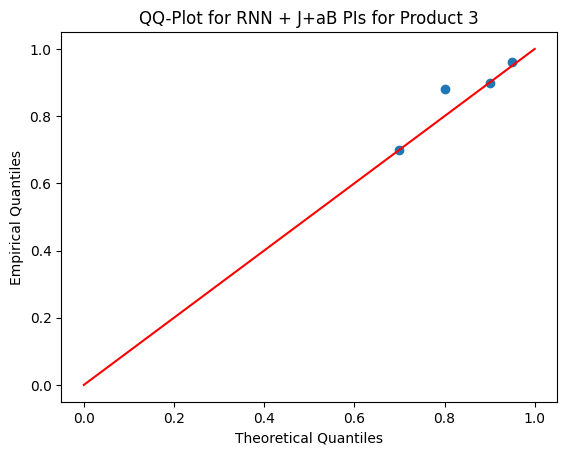

Epoch 1, Loss: 0.5382443070411682
1/1 [==============================] - 0s 8ms/step
Epoch 1, Loss: 0.6382453441619873
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 0.4905053377151489
1/1 [==============================] - 0s 8ms/step
Epoch 1, Loss: 0.4941602051258087
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 0.3234703540802002
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 0.4177974462509155
1/1 [==============================] - 0s 8ms/step
Epoch 1, Loss: 0.48270371556282043
1/1 [==============================] - 0s 8ms/step
Epoch 1, Loss: 0.5058422684669495
1/1 [==============================] - 0s 8ms/step
Epoch 1, Loss: 0.6434714794158936
1/1 [==============================] - 0s 11ms/step
Epoch 1, Loss: 0.48048460483551025
1/1 [==============================] - 0s 8ms/step
Epoch 1, Loss: 0.6264083385467529
1/1 [==============================] - 0s 9ms/step
Epoch 1, Loss: 0.7735235095024109
1/1 [=======================

KeyboardInterrupt: 

In [7]:
import numpy as np
import keras.backend as K
import numpy as np
import keras
from keras.layers import LSTM, Dense, Dropout
from keras.models import Sequential
from keras.optimizers import Adam
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import TimeSeriesSplit
def keras_rnn():
    model = Sequential(name='RNN')
    # For fast cuDNN implementation, activation = 'relu' does not work
    model.add(LSTM(25, activation='tanh'))
    #model.add(LSTM(100, activation='tanh'))
    model.add(Dense(1, activation='relu'))
    # Compile model
    opt = keras.optimizers.legacy.Adam(0.0005)
    model.compile(loss='mean_squared_error', optimizer=opt)
    return model

def preprocess_shape_rnn(data, sequence_length):
    X, Y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i+sequence_length])
        Y.append(data[i+sequence_length])
    return np.array(X), np.array(Y)



def generate_bootstrap_samples(n, m, B):
    """
    Generate B bootstrap samples of size m from an original dataset of size n.
    """
    return [np.random.choice(np.arange(n), size=m, replace=True) for _ in range(B)]
def fit_bootstrap_models(X_train, Y_train, X_predict, sequence_length, B):
    n = len(X_train)
    boot_samples_idx = generate_bootstrap_samples(n, n, B)
    
    predictions_train = np.zeros((B, n), dtype=float)
    n_predict = len(X_predict)
    predictions_test = np.zeros((B, n_predict), dtype=float)
    
    for b in range(B):
        model = keras_rnn()
        callback = keras.callbacks.EarlyStopping(monitor='loss', patience=3)
        history=model.fit(X_train[boot_samples_idx[b]], Y_train[boot_samples_idx[b]], epochs=10, batch_size=50, callbacks=[callback], verbose=0)
        
        training_loss = history.history['loss']
        for i, loss_value in enumerate(training_loss):
            if i % 10 == 0:  # Adjust the frequency as needed
                print(f'Epoch {i+1}, Loss: {loss_value}')
        predictions_train[b] = model.predict(X_train).flatten()
        predictions_test[b] = model.predict(X_predict).flatten()
    
    return boot_samples_idx, predictions_train, predictions_test

def compute_PIs_JaB(X_train, Y_train, X_predict, alpha, B, sequence_length):
    n = len(X_train)
    boot_samples_idx, boot_predictions_train, boot_predictions_test = fit_bootstrap_models(X_train, Y_train, X_predict, sequence_length, B)
    
    in_boot_sample = np.zeros((B, n), dtype=bool)
    for b in range(len(in_boot_sample)):
        in_boot_sample[b, boot_samples_idx[b]] = True
    
    resids_LOO = np.zeros(n)
    muh_LOO_vals_testpoint = np.zeros((n, len(X_predict)))
    for i in range(n):
        b_keep = np.argwhere(~(in_boot_sample[:, i])).reshape(-1)
        if len(b_keep) > 0:
            resids_LOO[i] = np.abs(Y_train[i] - boot_predictions_train[b_keep, i].mean())
            muh_LOO_vals_testpoint[i] = boot_predictions_test[b_keep].mean(0)
        else:
            resids_LOO[i] = np.abs(Y_train[i])
            muh_LOO_vals_testpoint[i] = np.zeros(len(X_predict))
    
    ind_q = (np.ceil((1-alpha)*(n+1))).astype(int)
    
    lower_bound = np.sort(muh_LOO_vals_testpoint.T - resids_LOO, axis=1).T[-ind_q]
    upper_bound = np.sort(muh_LOO_vals_testpoint.T + resids_LOO, axis=1).T[ind_q-1]
    
    return lower_bound, upper_bound



def compute_and_plot_JaB_intervals(data, tscv, product_name, sequence_length=10, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]):
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}
    X, Y = preprocess_shape_rnn(data, sequence_length)
    for train_index, test_index in tscv.split(X):
    
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = Y[train_index], Y[test_index]

        X_train_rnn, X_cal = X_train[:len(X_train)//2], X_train[len(X_train)//2:]
        y_train_rnn, y_cal = y_train[:len(y_train)//2], y_train[len(y_train)//2:]
             
        for alpha in alpha_levels:
   
            lower, upper = compute_PIs_JaB(X_train, y_train, X_test, alpha, B=30, sequence_length=sequence_length)

            within_interval = np.logical_and(lower.squeeze() <= y_test, upper.squeeze() >= y_test)
            PICP = np.mean(within_interval)
            MPIW = np.mean(upper - lower)

            
            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)

    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f}")

    
    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [PICP_values[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for RNN + J+aB PIs for {product_name}')
    plt.show()

tscv = TimeSeriesSplit(n_splits=50, test_size=1, max_train_size=50)
alpha_levels=[0.05, 0.10, 0.20, 0.30]
products_data = [
    #(product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4"),
    (product1_processed['seasonal_diff'].values, "Product 1")
]
sequence_length =10
for data, product_name in products_data:
    data = data.reshape(-1, 1)
    compute_and_plot_JaB_intervals(data, tscv, product_name, sequence_length,alpha_levels)


1/1 [==============================] - 0s 8ms/step
Alpha: 0.05, PICP: 98.00%, MPIW: 1.9347
Alpha: 0.1, PICP: 95.04%, MPIW: 1.3458
Alpha: 0.2, PICP: 76.08%, MPIW: 0.8784
Alpha: 0.3, PICP: 65.52%, MPIW: 0.7556


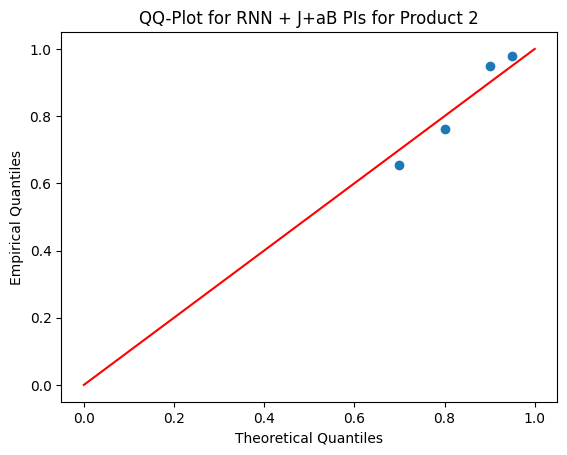

In [8]:
import numpy as np
import keras.backend as K
import numpy as np
import keras
from keras.layers import LSTM, Dense, Dropout
from keras.models import Sequential
from keras.optimizers import Adam
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import TimeSeriesSplit
def keras_rnn():
    model = Sequential(name='RNN')
    # For fast cuDNN implementation, activation = 'relu' does not work
    model.add(LSTM(25, activation='tanh'))
    #model.add(LSTM(100, activation='tanh'))
    model.add(Dense(1, activation='relu'))
    # Compile model
    opt = keras.optimizers.legacy.Adam(0.0005)
    model.compile(loss='mean_squared_error', optimizer=opt)
    return model

def preprocess_shape_rnn(data, sequence_length):
    X, Y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i+sequence_length])
        Y.append(data[i+sequence_length])
    return np.array(X), np.array(Y)

def split_conformal_prediction(model, X_cal, y_cal, x0, alpha_level):
  
    predictions_cal = model.predict(X_cal)
    # absolute residual distance
    errors_cal = np.abs(predictions_cal - y_cal)
    sequence_length=10
    # RNN point prediction
    point_predictions_test = model.predict(x0.reshape(1, sequence_length, 1))
    print(point_predictions_test)
    # Find the quantile of the calibration errors
    epsilon = np.percentile(errors_cal, 100*(1-alpha_level))

    lower = point_predictions_test - epsilon
    upper = point_predictions_test + epsilon

    return lower, upper, point_predictions_test

def generate_bootstrap_samples(n, m, B):
    """
    Generate B bootstrap samples of size m from an original dataset of size n.
    """
    return [np.random.choice(np.arange(n), size=m, replace=True) for _ in range(B)]
def fit_bootstrap_models(X_train, Y_train, X_predict, sequence_length, B):
    n = len(X_train)
    boot_samples_idx = generate_bootstrap_samples(n, n, B)
    
    predictions_train = np.zeros((B, n), dtype=float)
    n_predict = len(X_predict)
    predictions_test = np.zeros((B, n_predict), dtype=float)
    
    for b in range(B):
        model = keras_rnn()
        callback = keras.callbacks.EarlyStopping(monitor='loss', patience=10)
        model.fit(X_train[boot_samples_idx[b]], Y_train[boot_samples_idx[b]], epochs=100, batch_size=100, callbacks=[callback], verbose=0)
        predictions_train[b] = model.predict(X_train).flatten()
        predictions_test[b] = model.predict(X_predict).flatten()
    
    return boot_samples_idx, predictions_train, predictions_test

def compute_PIs_JaB(X_train, Y_train, X_predict, alpha, B, sequence_length):
    n = len(X_train)
    boot_samples_idx, boot_predictions_train, boot_predictions_test = fit_bootstrap_models(X_train, Y_train, X_predict, sequence_length, B)
    
    in_boot_sample = np.zeros((B, n), dtype=bool)
    for b in range(len(in_boot_sample)):
        in_boot_sample[b, boot_samples_idx[b]] = True
    
    resids_LOO = np.zeros(n)
    muh_LOO_vals_testpoint = np.zeros((n, len(X_predict)))
    for i in range(n):
        b_keep = np.argwhere(~(in_boot_sample[:, i])).reshape(-1)
        if len(b_keep) > 0:
            resids_LOO[i] = np.abs(Y_train[i] - boot_predictions_train[b_keep, i].mean())
            muh_LOO_vals_testpoint[i] = boot_predictions_test[b_keep].mean(0)
        else:
            resids_LOO[i] = np.abs(Y_train[i])
            muh_LOO_vals_testpoint[i] = np.zeros(len(X_predict))
    
    ind_q = (np.ceil((1-alpha)*(n+1))).astype(int)
    lower_bound = np.sort(muh_LOO_vals_testpoint.T - resids_LOO, axis=1).T[-ind_q]
    upper_bound = np.sort(muh_LOO_vals_testpoint.T + resids_LOO, axis=1).T[ind_q-1]
    
    return lower_bound, upper_bound



def compute_and_plot_JaB_intervals(data, tscv, product_name, sequence_length=10, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]):
    empirical_quantiles = {}
    normalization_factor = np.max(data) - np.min(data)
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}
    NMPIW_dict = {alpha: [] for alpha in alpha_levels}

    X, Y = preprocess_shape_rnn(data, sequence_length)
    for train_index, test_index in tscv.split(X):
    
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = Y[train_index], Y[test_index]

        X_train_rnn, X_cal = X_train[:len(X_train)//2], X_train[len(X_train)//2:]
        y_train_rnn, y_cal = y_train[:len(y_train)//2], y_train[len(y_train)//2:]
       
        for alpha in alpha_levels:
           
            lower, upper = compute_PIs_JaB(X_train_rnn, y_train_rnn, X_cal, alpha, B=30, sequence_length=sequence_length)

            within_interval = np.logical_and(lower.squeeze() <= y_test, upper.squeeze() >= y_test)
            PICP = np.mean(within_interval)
            MPIW = np.mean(upper - lower)

            
            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)
            NMPIW_dict[alpha].append(np.mean(upper - lower)/normalization_factor)

            if alpha not in empirical_quantiles:
                empirical_quantiles[alpha] = []
            empirical_quantiles[alpha].append(within_interval)

    
    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}
    NMPIW_values = {alpha: np.mean(values) for alpha, values in NMPIW_dict.items()}

    for alpha in alpha_levels:
       print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f},  NMPIW: {NMPIW_values[alpha]:.4f}")
    
    
    empirical_quantiles = {alpha: np.mean(values) for alpha, values in empirical_quantiles.items()}

    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [empirical_quantiles[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for RNN + J+aB PIs for {product_name}')
    plt.show()

tscv = TimeSeriesSplit(n_splits=10, test_size=5, max_train_size=50)
alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]
products_data = [
    (product2_processed['seasonal_diff'].values, "Product 2"),
    #(product1_processed['seasonal_diff'].values, "Product 1"),
    #(product3_processed['seasonal_diff'].values, "Product 3"),
    #(product4_processed['seasonal_diff'].values, "Product 4")
]
sequence_length =10
for data, product_name in products_data:
    data = data.reshape(-1, 1)
    compute_and_plot_JaB_intervals(data, tscv, product_name, sequence_length,alpha_levels)


1/1 [==============================] - 0s 9ms/step
Alpha: 0.05, PICP: 95.36%, MPIW: 3.2807
Alpha: 0.1, PICP: 87.84%, MPIW: 2.4713
Alpha: 0.2, PICP: 80.52%, MPIW: 1.6662
Alpha: 0.3, PICP: 74.44%, MPIW: 1.4662


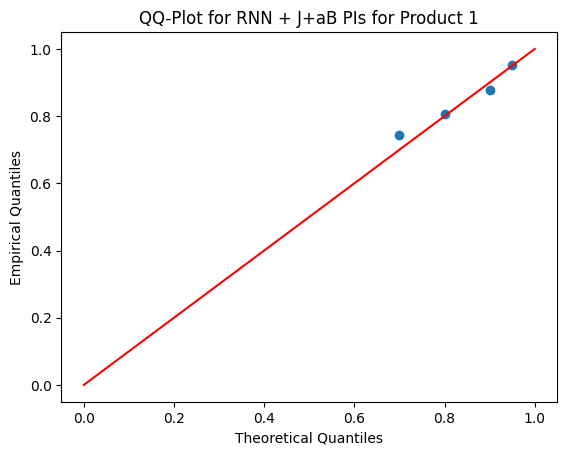

1/1 [==============================] - 0s 8ms/step
Alpha: 0.05, PICP: 89.12%, MPIW: 3.6568
Alpha: 0.1, PICP: 87.60%, MPIW: 3.2133
Alpha: 0.2, PICP: 79.88%, MPIW: 2.3078
Alpha: 0.3, PICP: 64.44%, MPIW: 1.7021


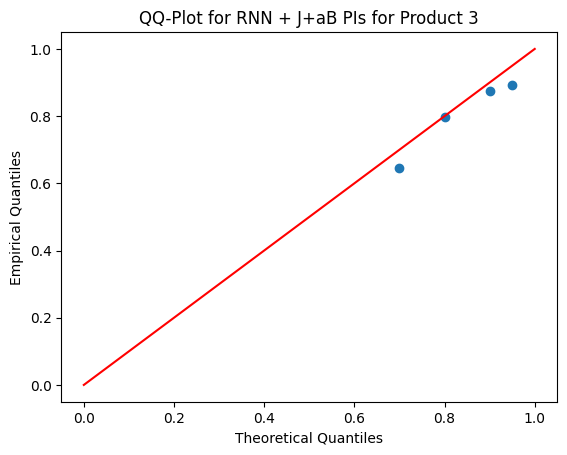

1/1 [==============================] - 0s 10ms/step
Alpha: 0.05, PICP: 96.84%, MPIW: 4.0472
Alpha: 0.1, PICP: 90.12%, MPIW: 3.1395
Alpha: 0.2, PICP: 79.92%, MPIW: 2.2524
Alpha: 0.3, PICP: 71.76%, MPIW: 1.7870


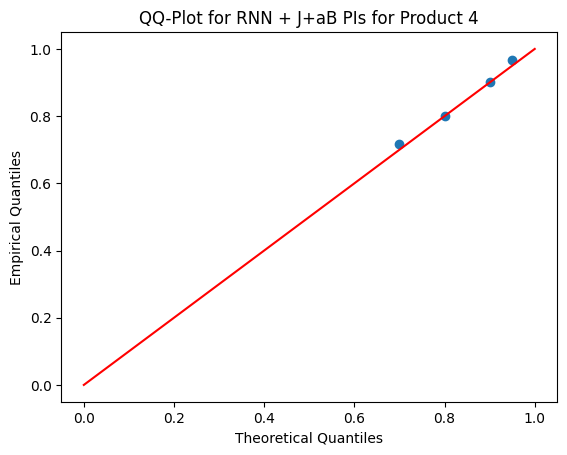

1/1 [==============================] - 0s 8ms/step
Alpha: 0.05, PICP: 96.04%, MPIW: 1.6982
Alpha: 0.1, PICP: 92.56%, MPIW: 1.3392
Alpha: 0.2, PICP: 81.20%, MPIW: 0.9424
Alpha: 0.3, PICP: 72.08%, MPIW: 0.7722


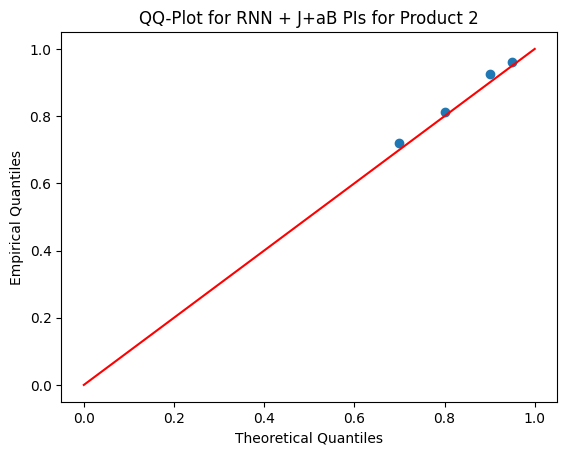

In [10]:
tscv = TimeSeriesSplit(n_splits=40, test_size=5, max_train_size=50)
alpha_levels=[0.05, 0.10, 0.20, 0.30]
products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4"),
    (product2_processed['seasonal_diff'].values, "Product 2")

]
sequence_length =10
for data, product_name in products_data:
    data = data.reshape(-1, 1)
    compute_and_plot_JaB_intervals(data, tscv, product_name, sequence_length,alpha_levels)

In [10]:
# data range
print(np.max(product1_processed["seasonal_diff"])-np.min(product1_processed["seasonal_diff"]))
print(np.max(product2_processed["seasonal_diff"])-np.min(product2_processed["seasonal_diff"]))
print(np.max(product3_processed["seasonal_diff"])-np.min(product3_processed["seasonal_diff"]))
print(np.max(product4_processed["seasonal_diff"])-np.min(product4_processed["seasonal_diff"]))

6.738182115010349
1.9025468729674717
5.51663744312799
7.920867635658938


## RNN with Split Conformal Prediction PI (classical approach)

see google collab

(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 13ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 14ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 13ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 13ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 13ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 13ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 13ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 17ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 13ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 13ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 13ms/step
(50, 10, 1)
(1, 10, 1)
1/

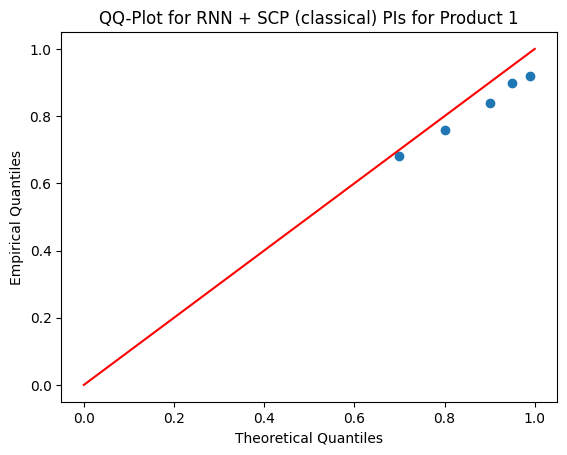

(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 13ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 13ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 13ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/

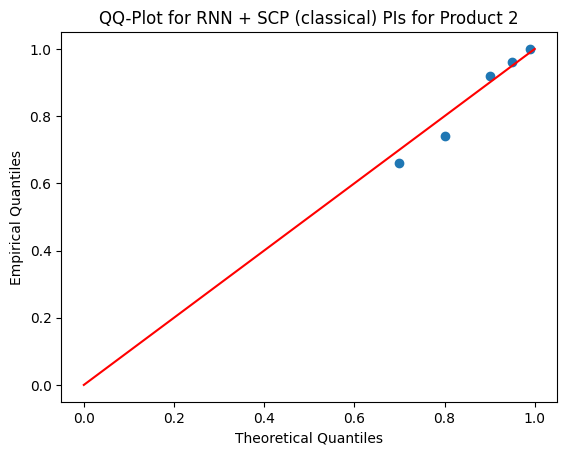

(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 13ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 13ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/

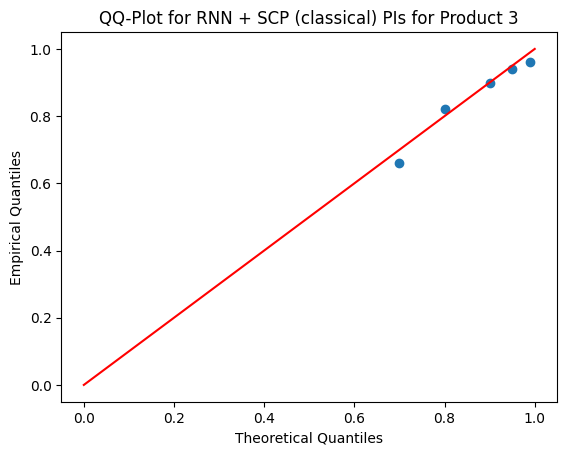

(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 14ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 13ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/1 [==============================] - 0s 12ms/step
(50, 10, 1)
(1, 10, 1)
1/

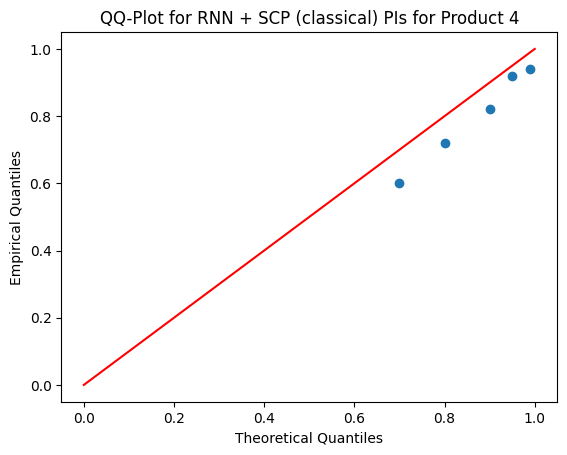

In [12]:
# split conformal prediction
import numpy as np
def keras_rnn():
    model = Sequential(name='RNN')
    # For fast cuDNN implementation, activation = 'relu' does not work
    model.add(LSTM(25, activation='tanh'))
    #model.add(LSTM(100, activation='tanh'))
    model.add(Dense(1, activation='relu'))
    # Compile model
    opt = Adam(0.0005)
    model.compile(loss='mean_squared_error', optimizer=opt)
    return model

def transform_to_sequences(data, sequence_length):
    X, Y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i+sequence_length])
        Y.append(data[i+sequence_length])
    return np.array(X), np.array(Y)


def split_conformal_prediction(model, X_cal, y_cal, x0, alpha_level):

    predictions_cal = model.predict(X_cal)
    # absolute residual distance
    errors_cal = np.abs(predictions_cal - y_cal)
    sequence_length=10
    # RNN point prediction
    point_predictions_test = model.predict(x0.reshape(1, sequence_length, 1))

    # Find the quantile of the calibration errors
    epsilon = np.percentile(errors_cal, 100*(1-alpha_level))

    lower = point_predictions_test - epsilon
    upper = point_predictions_test + epsilon

    return lower, upper, point_predictions_test

def compute_and_plot_scp_classical(data, tscv, product_name, sequence_length=10, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]):
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}
    X, Y = transform_to_sequences(data, sequence_length)
    for train_index, test_index in tscv.split(X):
        #X_train, y_train = transform_to_sequences(data[train_index], sequence_length)
        #print(np.shape(X_train))
        # Split the train data for training and calibration
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = Y[train_index], Y[test_index]

        X_train_rnn, X_cal = X_train[:len(X_train)//2], X_train[len(X_train)//2:]
        y_train_rnn, y_cal = y_train[:len(y_train)//2], y_train[len(y_train)//2:]
        print(np.shape(X_train_rnn))
        model = keras_rnn()
        model.fit(X_train_rnn, y_train_rnn, epochs=50, verbose=0)


        # Prepare the test data
        #X_test, y_test = data[test_index]
        print(X_test.shape)

        for alpha in alpha_levels:
            x0 = X_test[0]

            lower, upper, predictions = split_conformal_prediction(model, X_cal, y_cal, x0, alpha)

            within_interval = np.logical_and(lower.squeeze() <= y_test, upper.squeeze() >= y_test)
            PICP = np.mean(within_interval)
            MPIW = np.mean(upper - lower)

            
            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)

    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f}")

    
    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [PICP_values[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for RNN + SCP (classical) PIs for {product_name}')
    plt.show()

tscv = TimeSeriesSplit(n_splits=50, test_size=1, max_train_size=100)

products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]

for data, product_name in products_data:
    data = data.reshape(-1, 1)
    compute_and_plot_scp_classical(data, tscv, product_name)


(12, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(15, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(17, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(20, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 15ms/step
(22, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 14ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 14ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(25, 10, 1)
(5, 10, 1)
1/

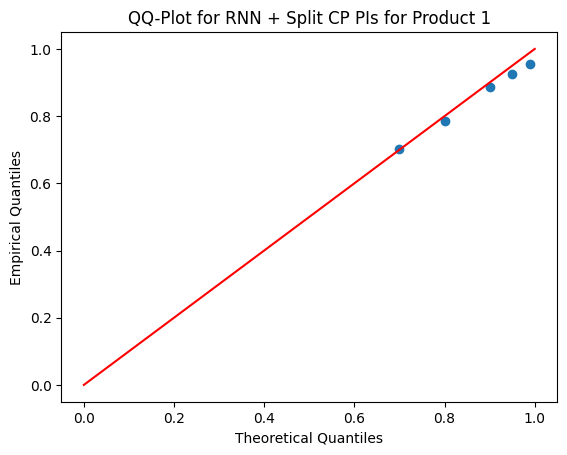

(12, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(15, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 14ms/step
(17, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(20, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(22, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 14ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 14ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(25, 10, 1)
(5, 10, 1)
1/

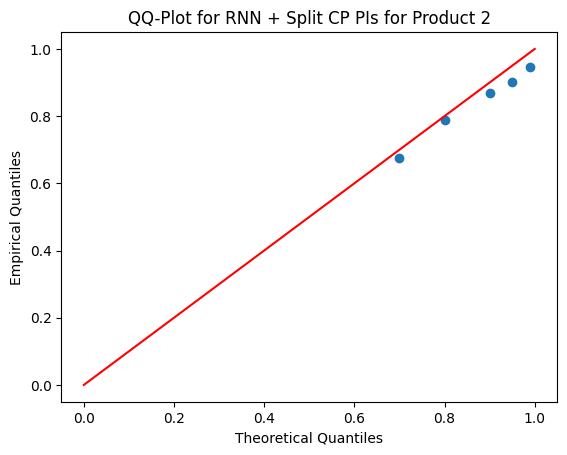

(12, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 15ms/step
(15, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(17, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(20, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(22, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 14ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 14ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 14ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(25, 10, 1)
(5, 10, 1)
1/

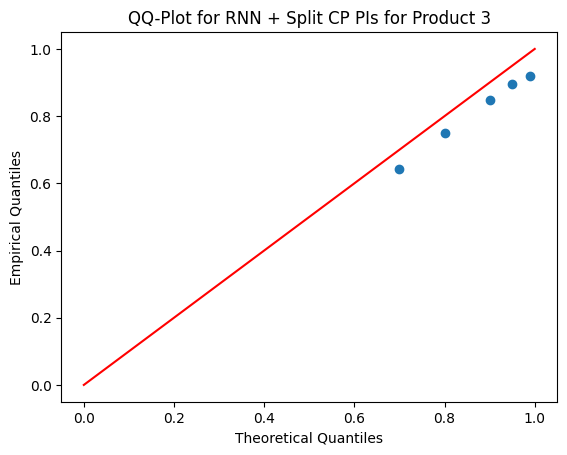

(12, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(15, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 14ms/step
(17, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(20, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 14ms/step
(22, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 14ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 14ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 15ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 13ms/step
(25, 10, 1)
(5, 10, 1)
1/1 [==============================] - 0s 12ms/step
(25, 10, 1)
(5, 10, 1)
1/

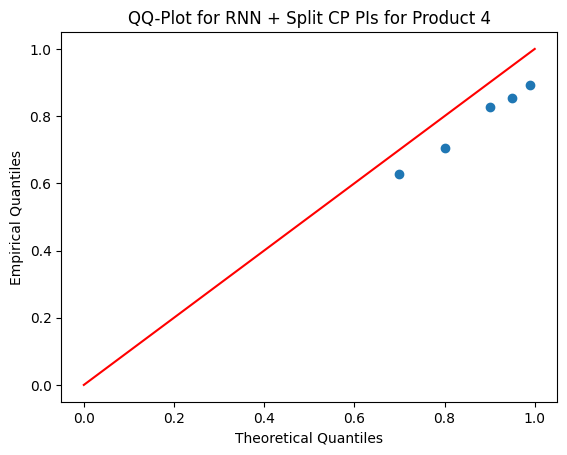

In [13]:
# split conformal prediction
# multi step
import numpy as np
import keras.backend as K
import numpy as np
from keras.layers import LSTM, Dense, Dropout
from keras.models import Sequential
from keras.optimizers.legacy import Adam

def keras_rnn():
    model = Sequential(name='RNN')
    # For fast cuDNN implementation, activation = 'relu' does not work
    model.add(LSTM(25, activation='tanh'))
    model.add(Dense(1, activation='relu'))
    # Compile model
    opt = Adam(0.0005)
    model.compile(loss='mean_squared_error', optimizer=opt)
    return model

def transform_to_sequences(data, sequence_length):
    X, Y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i+sequence_length])
        Y.append(data[i+sequence_length])
    return np.array(X), np.array(Y)


def split_conformal_prediction(model, X_cal, y_cal, x0, alpha_level):
  
    predictions_cal = model.predict(X_cal)

    # absolute residual distance
    errors_cal = np.abs(predictions_cal - y_cal)
    sequence_length=10
    # RNN point prediction
    point_predictions_test = model.predict(x0.reshape(5, sequence_length, 1))

    # quantile of the calibration errors
    epsilon = np.percentile(errors_cal, 100*(1-alpha_level))

    lower = point_predictions_test - epsilon
    upper = point_predictions_test + epsilon

    return lower, upper, point_predictions_test

def compute_and_plot_conformal_intervals(data, tscv, product_name, sequence_length=10, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]):
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}

    X, Y = transform_to_sequences(data, sequence_length)
    for train_index, test_index in tscv.split(X):
        # Split the train data for training and calibration
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = Y[train_index], Y[test_index]

        X_train_rnn, X_cal = X_train[:len(X_train)//2], X_train[len(X_train)//2:]
        y_train_rnn, y_cal = y_train[:len(y_train)//2], y_train[len(y_train)//2:]
        print(np.shape(X_train_rnn))
        model = keras_rnn()
        model.fit(X_train_rnn, y_train_rnn, epochs=50, verbose=0)

        print(X_test.shape)

        for alpha in alpha_levels:
            x0 = X_test

            lower, upper, predictions = split_conformal_prediction(model, X_cal, y_cal, x0, alpha)

            within_interval = np.logical_and(lower.squeeze() <= y_test, upper.squeeze() >= y_test)
            PICP = np.mean(within_interval)
            MPIW = np.mean(upper - lower)

            
            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)

    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f}")

    
    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [PICP_values[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for RNN + Split CP PIs for {product_name}')
    plt.show()

tscv = TimeSeriesSplit(n_splits=40, test_size=5, max_train_size=50)

products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]

for data, product_name in products_data:
    data = data.reshape(-1, 1)
    compute_and_plot_conformal_intervals(data, tscv, product_name)


## RNN with Split Conformal Prediction PIs with Kernel Density Estimation for estimating the residual distribution
based on the implementation by Alex Contario
https://github.com/alexcontarino/Constructing-Prediction-Intervals-for-Neural-Networks/blob/main/Execute%20Experiment.ipynb

1/1 [==============================] - 0s 13ms/step


/var/folders/8x/0zjt5hnd3s74dcghvfgvz5d40000gn/T/ipykernel_50869/3053109323.py:64: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  d = np.percentile(conform_scores, 100*CL, interpolation='higher')


1/1 [==============================] - 0s 13ms/step
Alpha: 0.01, PICP: 96.00%, MPIW: 4.8471
Alpha: 0.05, PICP: 90.00%, MPIW: 3.1774
Alpha: 0.1, PICP: 88.00%, MPIW: 2.1849
Alpha: 0.2, PICP: 76.00%, MPIW: 1.5354
Alpha: 0.3, PICP: 74.00%, MPIW: 1.2113


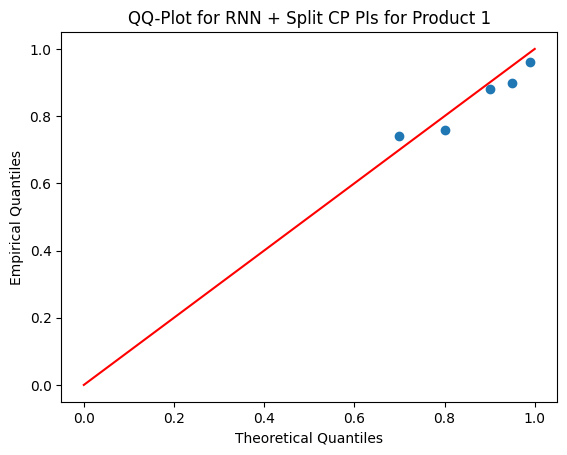

1/1 [==============================] - 0s 14ms/step
Alpha: 0.01, PICP: 100.00%, MPIW: 1.9734
Alpha: 0.05, PICP: 96.00%, MPIW: 1.4311
Alpha: 0.1, PICP: 92.00%, MPIW: 1.2415
Alpha: 0.2, PICP: 72.00%, MPIW: 0.8885
Alpha: 0.3, PICP: 68.00%, MPIW: 0.7608


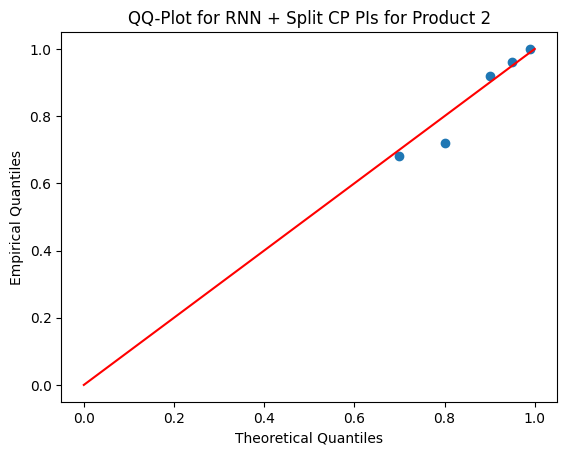

1/1 [==============================] - 0s 14ms/step
Alpha: 0.01, PICP: 98.00%, MPIW: 4.8459
Alpha: 0.05, PICP: 96.00%, MPIW: 4.2983
Alpha: 0.1, PICP: 90.00%, MPIW: 3.6594
Alpha: 0.2, PICP: 84.00%, MPIW: 2.3597
Alpha: 0.3, PICP: 68.00%, MPIW: 1.7859


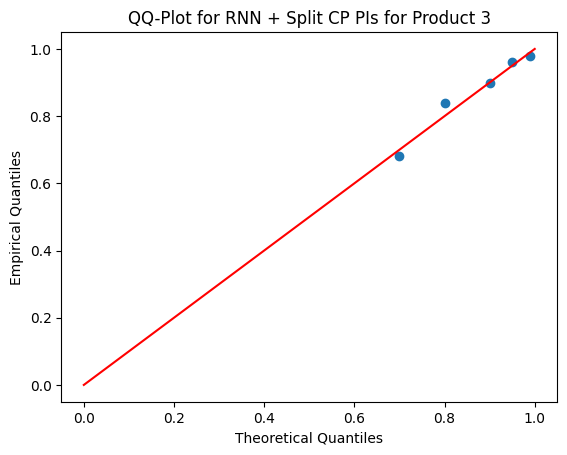

1/1 [==============================] - 0s 20ms/step
Alpha: 0.01, PICP: 94.00%, MPIW: 5.0555
Alpha: 0.05, PICP: 88.00%, MPIW: 3.4563
Alpha: 0.1, PICP: 86.00%, MPIW: 2.6829
Alpha: 0.2, PICP: 74.00%, MPIW: 2.0045
Alpha: 0.3, PICP: 64.00%, MPIW: 1.6342


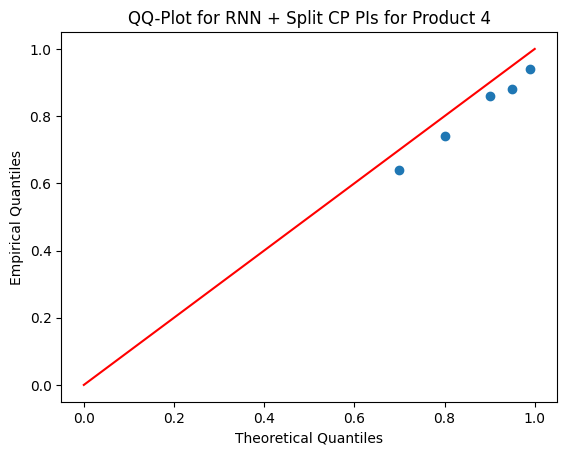

In [20]:
# split conformal prediction with KDE as conformity score
import numpy as np
import keras.backend as K
import keras
from keras.layers import LSTM, Dense, Dropout
from keras.models import Sequential
from keras.optimizers.legacy import Adam
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import TimeSeriesSplit
from sklearn.neighbors import KernelDensity
import matplotlib.pyplot as plt
import tensorflow as tf

def keras_rnn():
    model = Sequential(name='RNN')
    # For fast cuDNN implementation, activation = 'relu' does not work
    model.add(LSTM(25, activation='tanh'))
    #model.add(LSTM(100, activation='tanh'))
    model.add(Dense(1, activation='relu'))
    # Compile model
    opt = Adam(0.0005)
    model.compile(loss='mean_squared_error', optimizer=opt)
    return model

def preprocess_shape_rnn(data, sequence_length):
    X, Y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i+sequence_length])
        Y.append(data[i+sequence_length])
    return np.array(X), np.array(Y)


def split_conformal(model, X_cal, y_cal, X_test, y_test, CL):
        
    trial_bandwidths = [0]
    search_range = 26.27
    grid_fineness = 100
    #predict values in test set 
    #test_preds = model.predict(tf.convert_to_tensor(X_test), batch_size=len(X_test)).flatten()
    test_preds = model.predict(X_test).flatten()
    #identify calibration sets and estimate residuals
    y_cal_preds = model.predict(tf.convert_to_tensor(X_cal), batch_size=len(X_cal))
    #y_cal_preds = model.predict(tf.convert_to_tensor(X_calibration), batch_size=len(X_calibration))
    residuals = y_cal.flatten() - y_cal_preds.flatten()
    
    # setting the search range
    quantile_95 = np.percentile(np.abs(residuals), 95)
    quantile_99 = np.percentile(np.abs(residuals), 99)

    # search range constructed around quantile values

    search_range_95 = 2 * quantile_95
    search_range_99 = 2 * quantile_99

    search_range = search_range_99
    #initialize results array
    results = np.zeros((len(y_test),4,len(trial_bandwidths)))
    results[:,1,:] = y_test.reshape(-1,1)
    results[:,0,:] = test_preds.reshape(-1,1)

    for h, my_bandwidth in enumerate(trial_bandwidths):
        if my_bandwidth == 0:
            conform_scores = np.abs(residuals)
            d = np.percentile(conform_scores, 100*CL, interpolation='higher')
            results[:,3,h] = np.ones(len(y_test)) * 2 * d
            lower_bounds = test_preds.flatten() - d
            upper_bounds = test_preds.flatten() + d
            results[:,2,h] = (y_test.flatten() - lower_bounds)*(upper_bounds - y_test.flatten()) > 0
        else:
            #fit KDE distributions on augmented residual sets and compute p-value of potential residual values
            search_grid = np.linspace(0-search_range/2,
                                      0+search_range/2,
                                      grid_fineness)
            p_values = np.zeros(len(search_grid))
            for trial, resid_trial in enumerate(search_grid):
                aug_resids = np.concatenate([residuals, np.array([resid_trial])])
                kde = KernelDensity(bandwidth=my_bandwidth).fit(aug_resids.reshape(-1,1))
                conform_scores = -kde.score_samples(aug_resids.reshape(-1,1))
                p_values[trial] = np.sum(conform_scores <= conform_scores[-1]) / np.size(conform_scores)
        
            pred_region = p_values < CL
            #width
            results[:,3,h] = np.sum(pred_region) / grid_fineness * search_range
            for test_obs, y_true in enumerate(y_test):
                critical_resid = y_true - test_preds[test_obs]
                try:
                    lower_arg = np.argwhere(search_grid < critical_resid).flatten().max()
                    upper_arg = np.argwhere(search_grid >= critical_resid).flatten().min()
                    #in bounds?
                    results[test_obs,2,h] = pred_region[lower_arg] * pred_region[upper_arg]
                except:
                    #in bounds? 
                    results[test_obs,2,h] = 0
        
    return results

def compute_and_plot_conformal_intervals(data, tscv, product_name, sequence_length=10, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]):
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}
    # shape for RNN
    X, Y = preprocess_shape_rnn(data, sequence_length)
    for train_index, test_index in tscv.split(X):
    
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = Y[train_index], Y[test_index]

        X_train_rnn, X_cal = X_train[:len(X_train)//2], X_train[len(X_train)//2:]
        y_train_rnn, y_cal = y_train[:len(y_train)//2], y_train[len(y_train)//2:]
        #print(np.shape(X_train_rnn))
        model = keras_rnn()
        model.fit(X_train_rnn, y_train_rnn, epochs=25, verbose=0)


        for alpha in alpha_levels:
            #x0 = X_test[0]

            CL = 1 - alpha

            results = split_conformal(model, X_cal, y_cal, X_test, y_test, CL)
            PICP = np.mean(results[:, 2])  
            MPIW = np.mean(results[:, 3])  

            
            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)

    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f}")

    
    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [PICP_values[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for RNN + Split CP PIs for {product_name}')
    plt.show()

tscv = TimeSeriesSplit(n_splits=50, test_size=1, max_train_size=100)
alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]

products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]
for data, product_name in products_data:
    data = data.reshape(-1, 1)
    compute_and_plot_conformal_intervals(data, tscv, product_name)


1/1 [==============================] - 0s 11ms/step


/var/folders/8x/0zjt5hnd3s74dcghvfgvz5d40000gn/T/ipykernel_50869/3053109323.py:64: DeprecationWarning: the `interpolation=` argument to percentile was renamed to `method=`, which has additional options.
Users of the modes 'nearest', 'lower', 'higher', or 'midpoint' are encouraged to review the method they used. (Deprecated NumPy 1.22)
  d = np.percentile(conform_scores, 100*CL, interpolation='higher')


1/1 [==============================] - 0s 11ms/step
Alpha: 0.01, PICP: 96.50%, MPIW: 3.8342
Alpha: 0.05, PICP: 93.00%, MPIW: 3.1440
Alpha: 0.1, PICP: 90.50%, MPIW: 2.6306
Alpha: 0.2, PICP: 83.00%, MPIW: 2.0617
Alpha: 0.3, PICP: 71.50%, MPIW: 1.6120


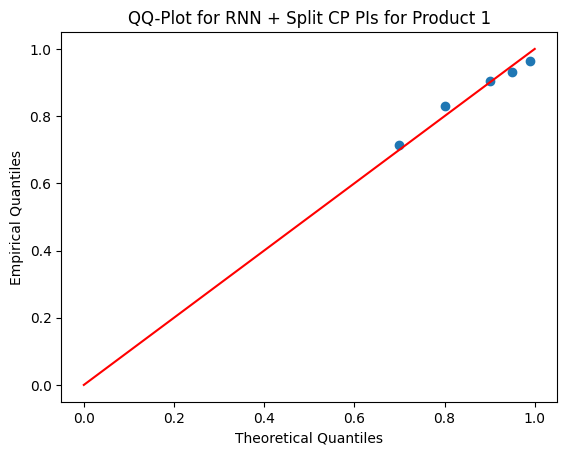

1/1 [==============================] - 0s 11ms/step
Alpha: 0.01, PICP: 96.00%, MPIW: 1.5367
Alpha: 0.05, PICP: 94.00%, MPIW: 1.3172
Alpha: 0.1, PICP: 88.50%, MPIW: 1.1824
Alpha: 0.2, PICP: 82.00%, MPIW: 0.9607
Alpha: 0.3, PICP: 71.00%, MPIW: 0.7194


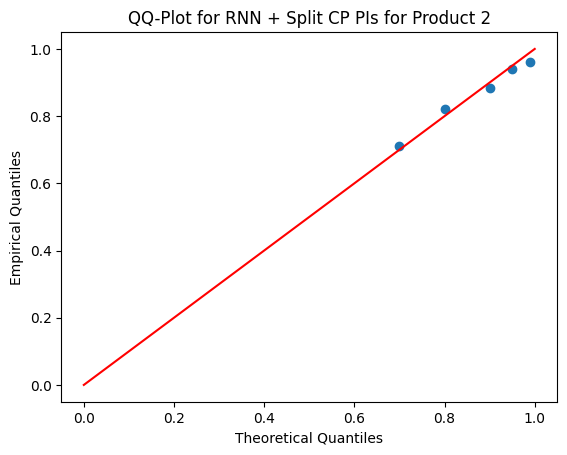

1/1 [==============================] - 0s 12ms/step
Alpha: 0.01, PICP: 94.00%, MPIW: 3.5935
Alpha: 0.05, PICP: 90.50%, MPIW: 3.2746
Alpha: 0.1, PICP: 86.00%, MPIW: 2.8905
Alpha: 0.2, PICP: 79.00%, MPIW: 2.2575
Alpha: 0.3, PICP: 65.50%, MPIW: 1.6350


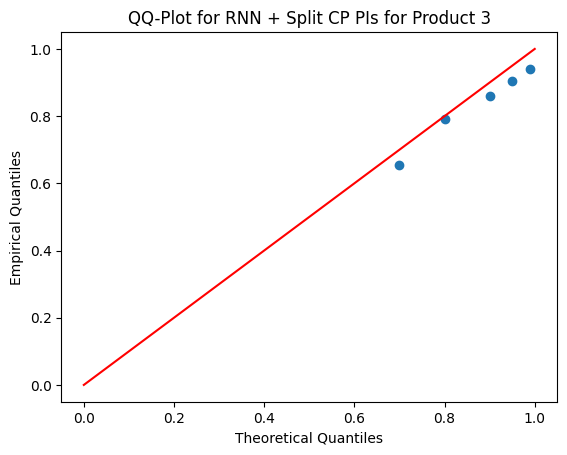

1/1 [==============================] - 0s 12ms/step
Alpha: 0.01, PICP: 90.00%, MPIW: 4.3414
Alpha: 0.05, PICP: 87.50%, MPIW: 3.3410
Alpha: 0.1, PICP: 83.00%, MPIW: 2.9180
Alpha: 0.2, PICP: 76.00%, MPIW: 2.2212
Alpha: 0.3, PICP: 63.50%, MPIW: 1.5500


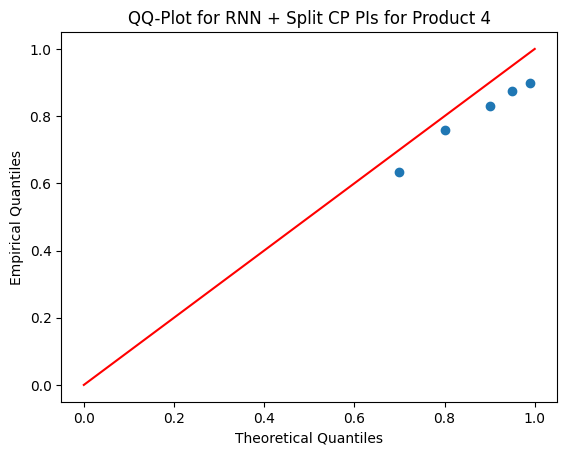

In [21]:
# multi step
tscv = TimeSeriesSplit(n_splits=40, test_size=5, max_train_size=50)
alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30]

products_data = [
    (product1_processed['seasonal_diff'].values, "Product 1"),
    (product2_processed['seasonal_diff'].values, "Product 2"),
    (product3_processed['seasonal_diff'].values, "Product 3"),
    (product4_processed['seasonal_diff'].values, "Product 4")
]
for data, product_name in products_data:
    data = data.reshape(-1, 1)
    compute_and_plot_conformal_intervals(data, tscv, product_name)

1/1 [==============================] - 0s 161ms/step
Alpha: 0.01, PICP: 96.00%, MPIW: 3.8931
Alpha: 0.05, PICP: 92.50%, MPIW: 2.9380
Alpha: 0.1, PICP: 87.50%, MPIW: 2.3250
Alpha: 0.2, PICP: 79.00%, MPIW: 1.8319
Alpha: 0.3, PICP: 66.50%, MPIW: 1.4308


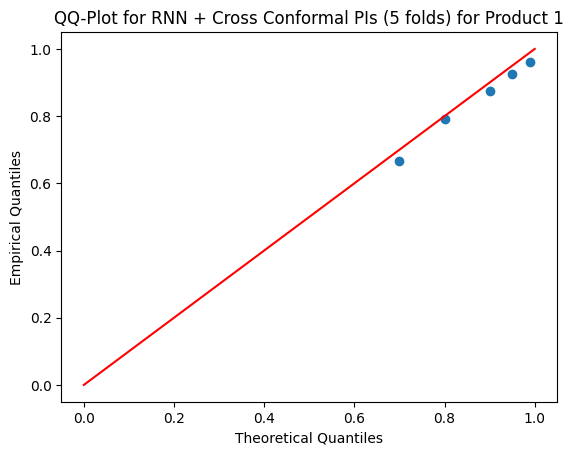

In [5]:
# cross conformal prediction
# multi step prediction
import numpy as np
import keras.backend as K
import keras
from sklearn.model_selection import KFold
from keras.layers import LSTM, Dense, Dropout
from keras.models import Sequential
from keras.optimizers.legacy import Adam
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import TimeSeriesSplit
from sklearn.neighbors import KernelDensity
import matplotlib.pyplot as plt
import tensorflow as tf

def keras_rnn():
    model = Sequential(name='RNN')
    # For fast cuDNN implementation, activation = 'relu' does not work
    model.add(LSTM(30, activation='tanh'))
    #model.add(LSTM(100, activation='tanh'))
    model.add(Dense(1, activation='relu'))
    # Compile model
    opt = Adam(0.0005)
    model.compile(loss='mean_squared_error', optimizer=opt)
    return model

def preprocess_shape_rnn(data, sequence_length):
    X, Y = [], []
    for i in range(len(data) - sequence_length):
        X.append(data[i:i+sequence_length])
        Y.append(data[i+sequence_length])
    return np.array(X), np.array(Y)

def cross_conformal(X_train, y_train, X_test, y_test, folds, CL):
     
    #initiate models
    trial_bandwidths = [0]
    search_range = 26.27
    grid_fineness = 100
   
    #create folds and fit models to each set of training data; 
    #then calculate residuals on calibration sets
    model_dict = {}
    for k in range(folds):
        model_dict[k] = keras_rnn()

    residual_sets = {}
    kf = TimeSeriesSplit(n_splits=folds)
    counter = 0
    for train_index, cal_index in kf.split(X_train):
        X_train_k, X_cal_k = X_train[train_index], X_train[cal_index]
        y_train_k, y_cal_k = y_train[train_index], y_train[cal_index]
        model_dict[counter].fit(X_train_k, y_train_k, epochs=25, verbose=0)
        y_pred_b = model_dict[counter].predict(X_cal_k, batch_size=len(X_cal_k)).flatten()
        residual_sets[counter] = y_cal_k.flatten() - y_pred_b.flatten()       
        counter+=1
        

    #predict values in test set using ensemble of fitted networks
    test_preds = np.zeros((len(y_test),folds))
    for b in range(folds):
        test_preds[:,b] = model_dict[b].predict(tf.convert_to_tensor(X_test), batch_size=len(X_test)).flatten()

        
    ensemble_mean = test_preds.mean(axis=1)
  
    #fit KDE distributions on augmented residual sets and compute p-value of potential residual values

    all_residuals = np.hstack(list(residual_sets.values()))
    quantile_99 = np.percentile(np.abs(all_residuals), 99)
    search_range = 2 * quantile_99

    search_grid = np.linspace(0-search_range/2,
                              0+search_range/2,
                              grid_fineness)
    p_values = np.zeros((len(search_grid),folds,len(trial_bandwidths)))
    for b in range(folds):
        residuals = residual_sets[b]
        for trial, resid_trial in enumerate(search_grid):
            aug_resids = np.concatenate([residuals, np.array([resid_trial])])
            for bandwidth, my_bandwidth in enumerate(trial_bandwidths):
                if my_bandwidth == 0:
                    conform_scores = np.abs(aug_resids)
                else:
                    kde = KernelDensity(bandwidth=my_bandwidth).fit(aug_resids.reshape(-1,1))
                    conform_scores = -kde.score_samples(aug_resids.reshape(-1,1))
                p_values[trial,b,bandwidth] = np.sum(conform_scores <= conform_scores[-1]) / np.size(conform_scores)

    #initialize results array
    results = np.zeros((len(y_test),4,len(trial_bandwidths)))
    results[:,1,:] = y_test.reshape(-1,1)
    results[:,0,:] = ensemble_mean.reshape(-1,1)
    
    #loop over each test value and bandwidth to find and evaluate prediction regions
    for h, my_bandwidth in enumerate(trial_bandwidths):
        mean_p_values = p_values[:,:,h].mean(axis=1)
        pred_region = mean_p_values < CL

        interval_widths = np.sum(pred_region) / grid_fineness * search_range
        results[:,3,h] = interval_widths

        # Calculate lower and upper bounds of prediction intervals
        lower_bounds = ensemble_mean - results[:, 3, 0] / 2
        upper_bounds = ensemble_mean + results[:, 3, 0] / 2     

        # Check if actual values are within the prediction intervals
        within_interval = (y_test.flatten() >= lower_bounds) & (y_test.flatten() <= upper_bounds)
        results[:, 2, h] = within_interval.astype(int)
    #print(results)
    return results


def compute_and_plot_CC_intervals(data, tscv, product_name, sequence_length=10, alpha_levels=[0.01, 0.05, 0.10, 0.20, 0.30], folds=5):
    PICP_dict = {alpha: [] for alpha in alpha_levels}
    MPIW_dict = {alpha: [] for alpha in alpha_levels}

    X, Y = preprocess_shape_rnn(data, sequence_length)

    for train_index, test_index in tscv.split(X):

        # Split the train data for training and calibration
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = Y[train_index], Y[test_index]

        X_train_rnn, X_cal = X_train[:len(X_train)//2], X_train[len(X_train)//2:]
        y_train_rnn, y_cal = y_train[:len(y_train)//2], y_train[len(y_train)//2:]
      
        for alpha in alpha_levels:
            #x0 = X_test[0]

            CL = 1 - alpha

            results = cross_conformal(X_train, y_train, X_test, y_test, folds, CL)
            PICP = np.mean(results[:, 2,:],axis=0)  
            MPIW = np.mean(results[:, 3,:])

            PICP_dict[alpha].append(PICP)
            MPIW_dict[alpha].append(MPIW)

    PICP_values = {alpha: np.mean(values) for alpha, values in PICP_dict.items()}
    MPIW_values = {alpha: np.mean(values) for alpha, values in MPIW_dict.items()}

    for alpha in alpha_levels:
        print(f"Alpha: {alpha}, PICP: {PICP_values[alpha]*100:.2f}%, MPIW: {MPIW_values[alpha]:.4f}")

    
    theoretical_quantiles = [1-a for a in alpha_levels]
    empirical_values = [PICP_values[a] for a in alpha_levels]

    plt.plot(theoretical_quantiles, empirical_values, 'o')
    plt.plot([0, 1], [0, 1], 'r-')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Empirical Quantiles')
    plt.title(f'QQ-Plot for RNN + Cross Conformal PIs ({folds} folds) for {product_name}')
    plt.show()

tscv = TimeSeriesSplit(n_splits=40, test_size=5, max_train_size=50)

products_data = [
    #(product2_processed['seasonal_diff'].values, "Product 2"),
    #(product3_processed['seasonal_diff'].values, "Product 3"),
    #(product4_processed['seasonal_diff'].values, "Product 4"),
    (product1_processed['seasonal_diff'].values, "Product 1")

]
folds = 5
for data, product_name in products_data:
    data = data.reshape(-1, 1)
    compute_and_plot_CC_intervals(data, tscv, product_name, folds)


1/1 [==============================] - 0s 190ms/step
Alpha: 0.01, PICP: 100.00%, MPIW: 1.7343
Alpha: 0.05, PICP: 96.00%, MPIW: 1.3559
Alpha: 0.1, PICP: 90.00%, MPIW: 1.1801
Alpha: 0.2, PICP: 74.00%, MPIW: 0.8046
Alpha: 0.3, PICP: 60.00%, MPIW: 0.6883


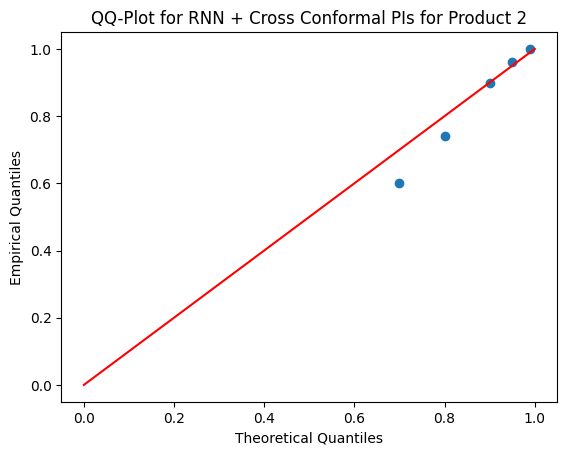

1/1 [==============================] - 0s 191ms/step
Alpha: 0.01, PICP: 96.00%, MPIW: 4.4942
Alpha: 0.05, PICP: 92.00%, MPIW: 3.8280
Alpha: 0.1, PICP: 90.00%, MPIW: 2.7972
Alpha: 0.2, PICP: 72.00%, MPIW: 1.9822
Alpha: 0.3, PICP: 58.00%, MPIW: 1.5823


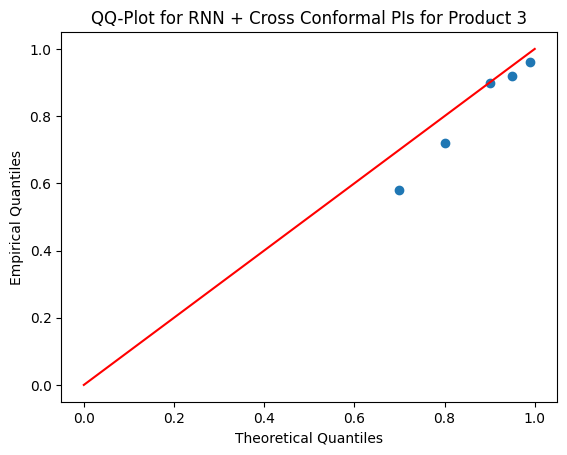

1/1 [==============================] - 0s 195ms/step
Alpha: 0.01, PICP: 94.00%, MPIW: 4.7653
Alpha: 0.05, PICP: 90.00%, MPIW: 3.2856
Alpha: 0.1, PICP: 84.00%, MPIW: 2.5556
Alpha: 0.2, PICP: 74.00%, MPIW: 1.8165
Alpha: 0.3, PICP: 60.00%, MPIW: 1.4722


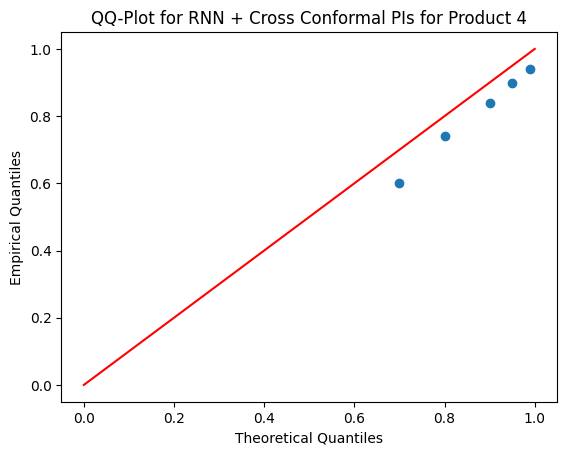

1/1 [==============================] - 0s 194ms/step
Alpha: 0.01, PICP: 92.00%, MPIW: 4.1356
Alpha: 0.05, PICP: 88.00%, MPIW: 2.7670
Alpha: 0.1, PICP: 82.00%, MPIW: 1.9388
Alpha: 0.2, PICP: 76.00%, MPIW: 1.4580
Alpha: 0.3, PICP: 72.00%, MPIW: 1.2327


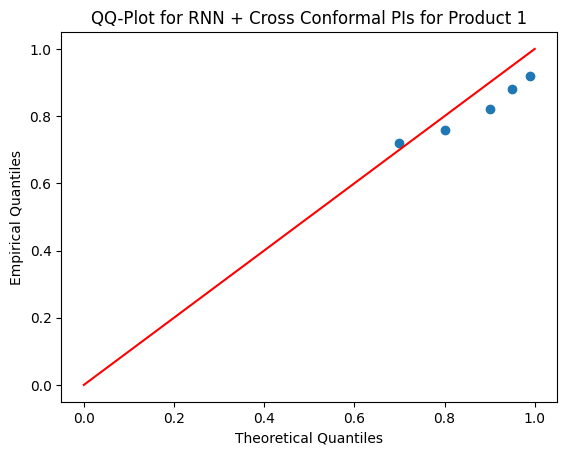

1/1 [==============================] - 0s 205ms/step
Alpha: 0.01, PICP: 100.00%, MPIW: 1.7342
Alpha: 0.05, PICP: 96.00%, MPIW: 1.3421
Alpha: 0.1, PICP: 92.00%, MPIW: 1.1782
Alpha: 0.2, PICP: 74.00%, MPIW: 0.8092
Alpha: 0.3, PICP: 64.00%, MPIW: 0.7030


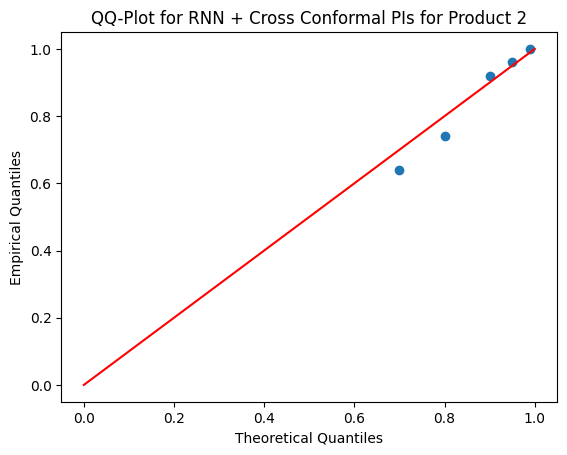

1/1 [==============================] - 0s 192ms/step
Alpha: 0.01, PICP: 96.00%, MPIW: 4.5803
Alpha: 0.05, PICP: 92.00%, MPIW: 3.8306
Alpha: 0.1, PICP: 90.00%, MPIW: 2.7443
Alpha: 0.2, PICP: 72.00%, MPIW: 1.9285
Alpha: 0.3, PICP: 58.00%, MPIW: 1.6188


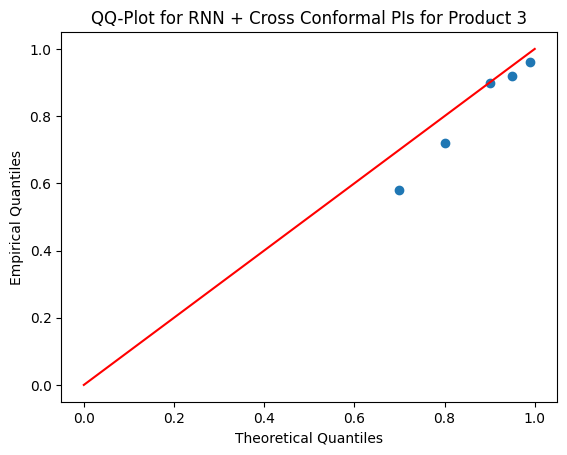

1/1 [==============================] - 0s 193ms/step
Alpha: 0.01, PICP: 94.00%, MPIW: 4.7057
Alpha: 0.05, PICP: 90.00%, MPIW: 3.2049
Alpha: 0.1, PICP: 84.00%, MPIW: 2.5664
Alpha: 0.2, PICP: 74.00%, MPIW: 1.8303
Alpha: 0.3, PICP: 60.00%, MPIW: 1.4978


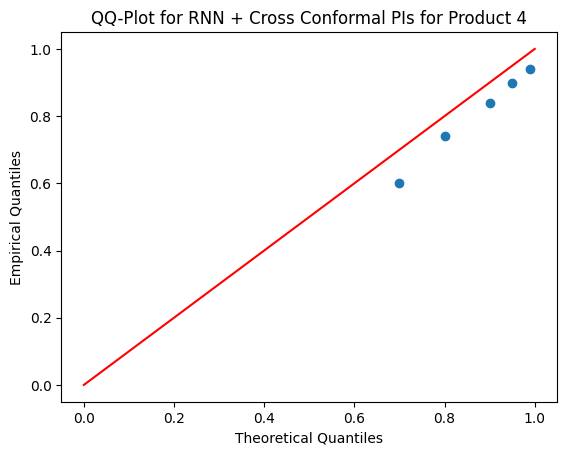

1/1 [==============================] - 3s 3s/step
Alpha: 0.01, PICP: 92.00%, MPIW: 4.3235
Alpha: 0.05, PICP: 90.00%, MPIW: 2.8283
Alpha: 0.1, PICP: 82.00%, MPIW: 1.9476
Alpha: 0.2, PICP: 76.00%, MPIW: 1.4488
Alpha: 0.3, PICP: 70.00%, MPIW: 1.1738


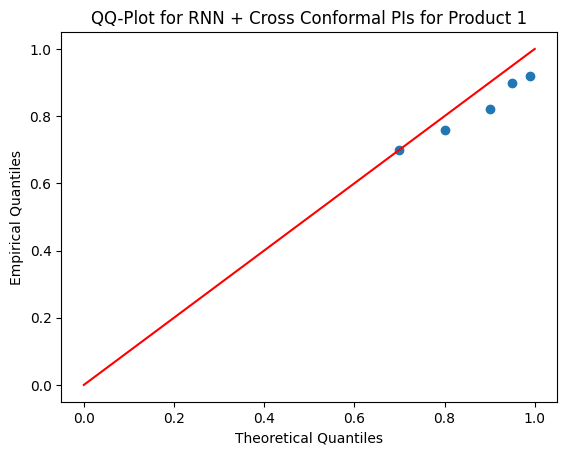

In [30]:
# with different folds
folds = 10
for data, product_name in products_data:
    data = data.reshape(-1, 1)
    compute_and_plot_CC_intervals(data, tscv, product_name, folds)
folds = 20
for data, product_name in products_data:
    data = data.reshape(-1, 1)
    compute_and_plot_CC_intervals(data, tscv, product_name, folds)